# <font color =dimgrey>Credit EDA Case Study
**<font color =dodgerblue>RISK ANALYSIS IN BANK AND FINANCIAL SERVICES**

<font color =navy>This case study focuses on risk analytics in banking and financial services, particularly in the context of loan approval decisions. The problem statement outlines the two main risks associated with loan approval:

1. Risk of not approving a loan to a client who would repay it, resulting in a loss of business.
2. Risk of approving a loan to a client who would default, resulting in financial losses for the company.

<font color =navy>The data provided contains information about loan applications, categorized into two scenarios:
1. Clients with payment difficulties: Those who had late payments on at least one of the first few instalments.
2. All other cases: Applications where payments were made on time.

<font color =navy>When a client applies for a loan, there are four possible decisions:
- **Approved**: Loan application approved.
- **Cancelled**: Client cancels the application during approval.
- **Refused**: Loan application rejected by the company.
- **Unused offer**: Loan cancelled by the client at different stages of the process.

<font color =navy>The objective of this case study is to conduct exploratory data analysis (EDA) to understand how consumer attributes and loan attributes influence the likelihood of default.

<font color =navy>In summary, the case study aims to analyze loan application data to identify patterns and factors influencing loan default tendencies, helping the company make informed decisions to minimize risks associated with lending.

## <font color=green>Import all the required libraries for analysis

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statistics
import warnings
import scipy.stats as ss
warnings.filterwarnings('ignore')

#### <font color=red> Read the Source File of Dataset

In [2]:
curr=pd.read_csv('application_data.csv')
curr.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
curr.tail()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
307510,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,0,0,0,0,0.0,0.0,0.0,2.0,0.0,1.0


**Set display options to show up to 500 columns and 500 rows in the output**

In [4]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

### <font color =red> Checking the number of columns and row in the columns

In [5]:
curr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


* Datatype is correct in all the columns 

## Checking null values in all columns

In [6]:
curr.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

##  <font color =red> Data Cleaning
**Missing Values**

In [7]:
# Checking % of missing values
curr.isnull().sum()

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

In [8]:
curr.isnull().sum()/len(curr)*100

SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE               0.000000
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
NAME_TYPE_SUITE                  0.420148
NAME_INCOME_TYPE                 0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_FAMILY_STATUS               0.000000
NAME_HOUSING_TYPE                0.000000
REGION_POPULATION_RELATIVE       0.000000
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                    0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
OWN_CAR_AGE                     65.990810
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0

In [9]:
per=curr.isnull().mean().sort_values(ascending=False) *100

**checking columns percentage of null values is greater than 40**

In [10]:
per[per>40].shape

(49,)

**Dropping columns with null value percentage greater than 40**

The columns listed below have a negligible percentage of missing values. Instead of performing imputation, it's recommended to eliminate these null values. The percentage of null values falls within the range of 0 to 1 percent. Removing these null values will have no significant impact on the analysis results.

In [11]:
columns_drop=per[per<40].index
curr=curr[columns_drop]

**Column with percentage null values less than 40%**

In [12]:
(curr.isnull().mean().sort_values(ascending=False) *100).head(10)

OCCUPATION_TYPE               31.345545
EXT_SOURCE_3                  19.825307
AMT_REQ_CREDIT_BUREAU_HOUR    13.501631
AMT_REQ_CREDIT_BUREAU_DAY     13.501631
AMT_REQ_CREDIT_BUREAU_WEEK    13.501631
AMT_REQ_CREDIT_BUREAU_MON     13.501631
AMT_REQ_CREDIT_BUREAU_QRT     13.501631
AMT_REQ_CREDIT_BUREAU_YEAR    13.501631
NAME_TYPE_SUITE                0.420148
OBS_30_CNT_SOCIAL_CIRCLE       0.332021
dtype: float64

## <font color =red>Handling invalid data

#### OCCUPATION_TYPE

In [13]:
curr.OCCUPATION_TYPE.value_counts(normalize='True')*100

OCCUPATION_TYPE
Laborers                 26.139636
Sales staff              15.205570
Core staff               13.058924
Managers                 10.122679
Drivers                   8.811576
High skill tech staff     5.390299
Accountants               4.648067
Medicine staff            4.043672
Security staff            3.183498
Cooking staff             2.816408
Cleaning staff            2.203960
Private service staff     1.256158
Low-skill Laborers        0.991379
Waiters/barmen staff      0.638499
Secretaries               0.618132
Realty agents             0.355722
HR staff                  0.266673
IT staff                  0.249147
Name: proportion, dtype: float64

* Null values in the Occupation type are linked to higher income, indicating MNAR (missing not at random) as high-income individuals often hide their occupation. To avoid data skew and loss, we will neither impute nor drop these missing values.

* Keeping the null values in OCCUPATION_TYPE as it is.

## EXT_SOURCE_3

In [14]:
curr.EXT_SOURCE_3.value_counts().sort_values(ascending=False)

EXT_SOURCE_3
0.746300    1460
0.713631    1315
0.694093    1276
0.670652    1191
0.652897    1154
            ... 
0.017506       1
0.018266       1
0.844493       1
0.028674       1
0.043227       1
Name: count, Length: 814, dtype: int64

In [15]:
curr['EXT_SOURCE_3'].isnull().sum()

60965

In [16]:
curr['EXT_SOURCE_3'].describe()

count    246546.000000
mean          0.510853
std           0.194844
min           0.000527
25%           0.370650
50%           0.535276
75%           0.669057
max           0.896010
Name: EXT_SOURCE_3, dtype: float64

* In this column mode is 0.74 where as mean and median are around 0.52 data is right skewed imputing null values with any of this can skew the data.
* Keeping the null values as it is.

## AMT_REQ_CREDIT_BUREAU_HOUR

In [17]:
curr['AMT_REQ_CREDIT_BUREAU_HOUR'].value_counts()


AMT_REQ_CREDIT_BUREAU_HOUR
0.0    264366
1.0      1560
2.0        56
3.0         9
4.0         1
Name: count, dtype: int64

In [18]:
curr['AMT_REQ_CREDIT_BUREAU_DAY'].value_counts()


AMT_REQ_CREDIT_BUREAU_DAY
0.0    264503
1.0      1292
2.0       106
3.0        45
4.0        26
5.0         9
6.0         8
9.0         2
8.0         1
Name: count, dtype: int64

In [19]:
curr['AMT_REQ_CREDIT_BUREAU_WEEK'].value_counts()


AMT_REQ_CREDIT_BUREAU_WEEK
0.0    257456
1.0      8208
2.0       199
3.0        58
4.0        34
6.0        20
5.0        10
8.0         5
7.0         2
Name: count, dtype: int64

In [20]:
curr['AMT_REQ_CREDIT_BUREAU_MON'].value_counts()


AMT_REQ_CREDIT_BUREAU_MON
0.0     222233
1.0      33147
2.0       5386
3.0       1991
4.0       1076
5.0        602
6.0        343
7.0        298
9.0        206
8.0        185
10.0       132
11.0       119
12.0        77
13.0        72
14.0        40
15.0        35
16.0        23
17.0        14
18.0         6
19.0         3
24.0         1
23.0         1
27.0         1
22.0         1
Name: count, dtype: int64

In [21]:
curr['AMT_REQ_CREDIT_BUREAU_QRT'].value_counts()

AMT_REQ_CREDIT_BUREAU_QRT
0.0      215417
1.0       33862
2.0       14412
3.0        1717
4.0         476
5.0          64
6.0          28
8.0           7
7.0           7
261.0         1
19.0          1
Name: count, dtype: int64

In [22]:
curr['AMT_REQ_CREDIT_BUREAU_HOUR']=curr['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(curr['AMT_REQ_CREDIT_BUREAU_HOUR'].mode()[0])
curr['AMT_REQ_CREDIT_BUREAU_DAY']=curr['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(curr['AMT_REQ_CREDIT_BUREAU_DAY'].mode()[0])
curr['AMT_REQ_CREDIT_BUREAU_WEEK']=curr['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(curr['AMT_REQ_CREDIT_BUREAU_WEEK'].mode()[0])
curr['AMT_REQ_CREDIT_BUREAU_MON']=curr['AMT_REQ_CREDIT_BUREAU_MON'].fillna(curr['AMT_REQ_CREDIT_BUREAU_MON'].mode()[0])
curr['AMT_REQ_CREDIT_BUREAU_YEAR']=curr['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(curr['AMT_REQ_CREDIT_BUREAU_YEAR'].mode()[0])
curr['AMT_REQ_CREDIT_BUREAU_QRT']=curr['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(curr['AMT_REQ_CREDIT_BUREAU_QRT'].mode()[0])

* Mode of the column is zero imputing the null values with Zero

In [23]:
curr['AMT_REQ_CREDIT_BUREAU_HOUR']=curr['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(curr['AMT_REQ_CREDIT_BUREAU_HOUR'].mode()[0])

In [24]:
curr['AMT_REQ_CREDIT_BUREAU_DAY'].value_counts()

AMT_REQ_CREDIT_BUREAU_DAY
0.0    306022
1.0      1292
2.0       106
3.0        45
4.0        26
5.0         9
6.0         8
9.0         2
8.0         1
Name: count, dtype: int64

In [25]:
curr['AMT_REQ_CREDIT_BUREAU_WEEK'].value_counts()

AMT_REQ_CREDIT_BUREAU_WEEK
0.0    298975
1.0      8208
2.0       199
3.0        58
4.0        34
6.0        20
5.0        10
8.0         5
7.0         2
Name: count, dtype: int64

**Handling Null Values between 0 & 1**

In [26]:
miss_per = curr.isnull().mean() * 100
fil_col = miss_per[(miss_per> 0) & (miss_per< 1)] 
fil_col

NAME_TYPE_SUITE             0.420148
OBS_30_CNT_SOCIAL_CIRCLE    0.332021
DEF_30_CNT_SOCIAL_CIRCLE    0.332021
OBS_60_CNT_SOCIAL_CIRCLE    0.332021
DEF_60_CNT_SOCIAL_CIRCLE    0.332021
EXT_SOURCE_2                0.214626
AMT_GOODS_PRICE             0.090403
AMT_ANNUITY                 0.003902
CNT_FAM_MEMBERS             0.000650
DAYS_LAST_PHONE_CHANGE      0.000325
dtype: float64

- Since the percentage of null values is negligible, removing them would have minimal impact on the overall analysis. Therefore, we can proceed with the analysis without considering the null values.

In [27]:
curr.dropna(subset=['AMT_ANNUITY','AMT_GOODS_PRICE','NAME_TYPE_SUITE','CNT_FAM_MEMBERS','EXT_SOURCE_2','OBS_30_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE','DAYS_LAST_PHONE_CHANGE'],inplace=True)

In [28]:
curr.nunique()

OCCUPATION_TYPE                    18
EXT_SOURCE_3                      814
AMT_REQ_CREDIT_BUREAU_HOUR          5
AMT_REQ_CREDIT_BUREAU_DAY           9
AMT_REQ_CREDIT_BUREAU_WEEK          9
AMT_REQ_CREDIT_BUREAU_MON          24
AMT_REQ_CREDIT_BUREAU_QRT          11
AMT_REQ_CREDIT_BUREAU_YEAR         25
NAME_TYPE_SUITE                     7
OBS_30_CNT_SOCIAL_CIRCLE           33
DEF_30_CNT_SOCIAL_CIRCLE           10
OBS_60_CNT_SOCIAL_CIRCLE           33
DEF_60_CNT_SOCIAL_CIRCLE            9
EXT_SOURCE_2                   119485
AMT_GOODS_PRICE                   985
AMT_ANNUITY                     13652
CNT_FAM_MEMBERS                    17
DAYS_LAST_PHONE_CHANGE           3770
CNT_CHILDREN                       15
FLAG_DOCUMENT_8                     2
NAME_CONTRACT_TYPE                  2
CODE_GENDER                         3
FLAG_OWN_CAR                        2
FLAG_DOCUMENT_2                     2
FLAG_DOCUMENT_3                     2
FLAG_DOCUMENT_4                     2
FLAG_DOCUMEN

## Handling invalids values in columns

- To maintain the expressiveness of the data representing time durations in days, it's preferable to keep the negative values intact to signify the past and to express them in years for better interpretability

In [29]:
curr['DAYS_BIRTH']=((curr['DAYS_BIRTH']).abs()/365).astype('int64')
curr['DAYS_EMPLOYED']=((curr['DAYS_EMPLOYED']).abs()/365).astype('int64')
curr['DAYS_REGISTRATION']=((curr['DAYS_REGISTRATION']).abs()/365).astype('int64')
curr['DAYS_ID_PUBLISH']=((curr['DAYS_ID_PUBLISH']).abs()/365).astype('int64')

In [30]:
curr['CODE_GENDER'].value_counts()

CODE_GENDER
F      200482
M      104045
XNA         4
Name: count, dtype: int64

* XNA is an invalid code in 'CODE_GENDER' , mode is F imputing XNA with F

In [31]:
curr['CODE_GENDER']=curr['CODE_GENDER'].str.replace('XNA','F')

In [32]:
curr['CODE_GENDER'].value_counts()

CODE_GENDER
F    200486
M    104045
Name: count, dtype: int64

# <font color =red> Outliers Handling

- User Defined functions to observ the **`skewness`**
 in the colums of the data

Using **`IQR`** method for removing outliers

In [33]:
def func_boxplot(curr, column_name):

    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    
    sns.histplot(curr[column_name], ax=axes[0], kde=True)
    axes[0].set_title(f'Distribution of {column_name}')
    
    sns.boxplot(y=curr[column_name], ax=axes[1])
    axes[1].set_title(f'Boxplot of {column_name}')
    
    plt.show()




In [34]:
def iqr(curr, col_name):
    q1 = curr[col_name].quantile(0.25)
    q3 = curr[col_name].quantile(0.75)
    iqr = q3 - q1

    upper_limit = q3 + 1.5 * iqr
    lower_limit = q1 - 1.5 * iqr

    curr.loc[curr[col_name] > upper_limit, col_name] = upper_limit
    curr.loc[curr[col_name] < lower_limit, col_name] = lower_limit
    
    return curr

Checking the distribution of columns whether their are outliers or not

## CNT_CHILDREN

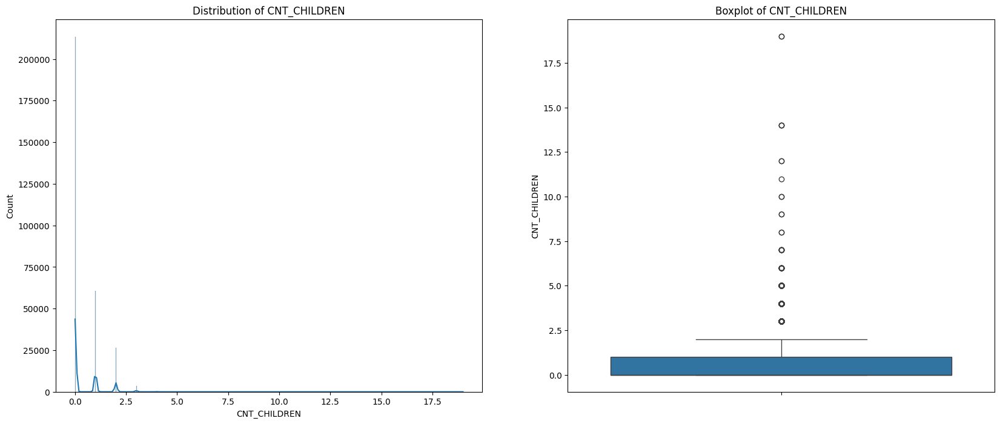

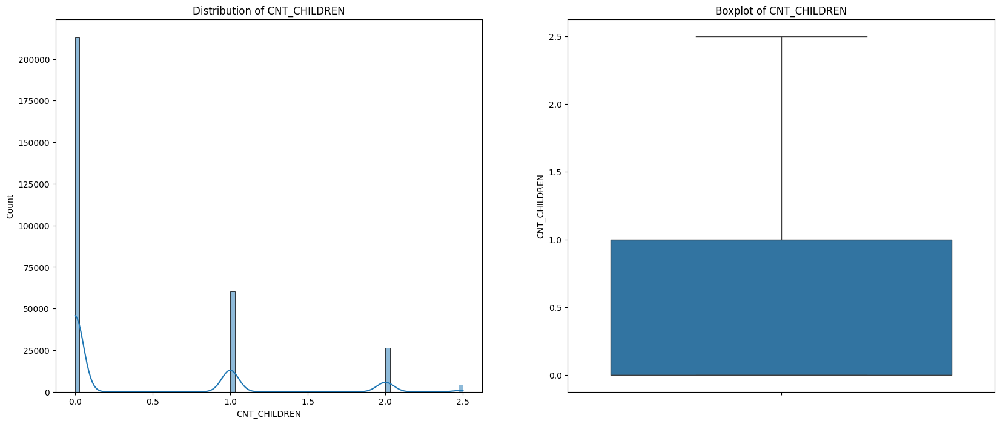

In [35]:
func_boxplot(curr,'CNT_CHILDREN')
curr = iqr(curr, 'CNT_CHILDREN')
func_boxplot(curr,'CNT_CHILDREN')

* distplot data is not evenly distributed it is completely right skewed, and in the boxplot we can see the outliers very clearly

## AMT_CREDIT

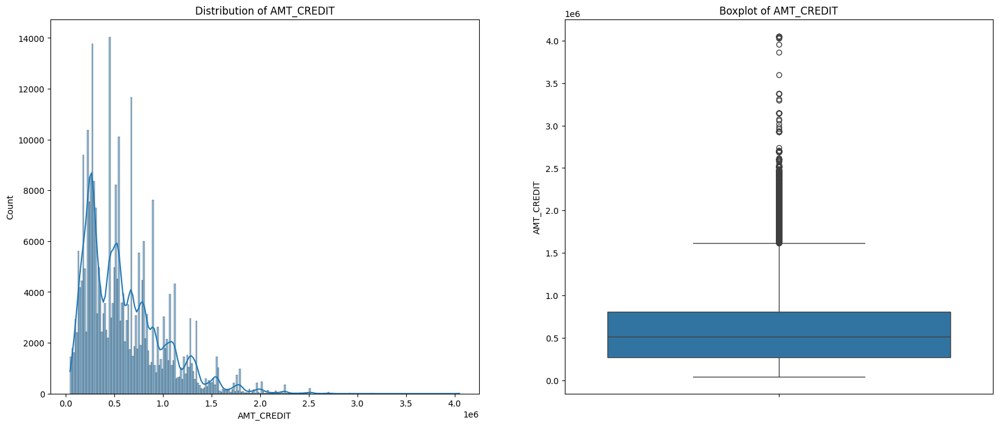

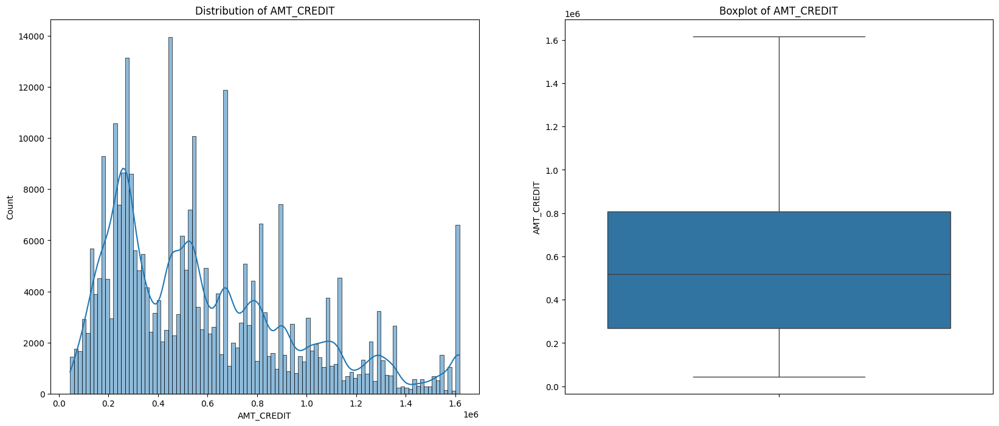

In [36]:
func_boxplot(curr,'AMT_CREDIT')
curr = iqr(curr, 'AMT_CREDIT')
func_boxplot(curr,'AMT_CREDIT')

## AMT_ANNUITY

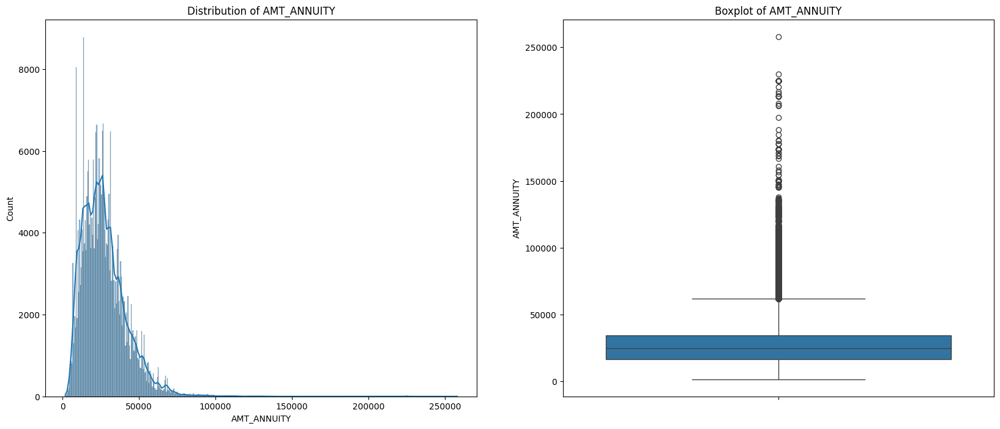

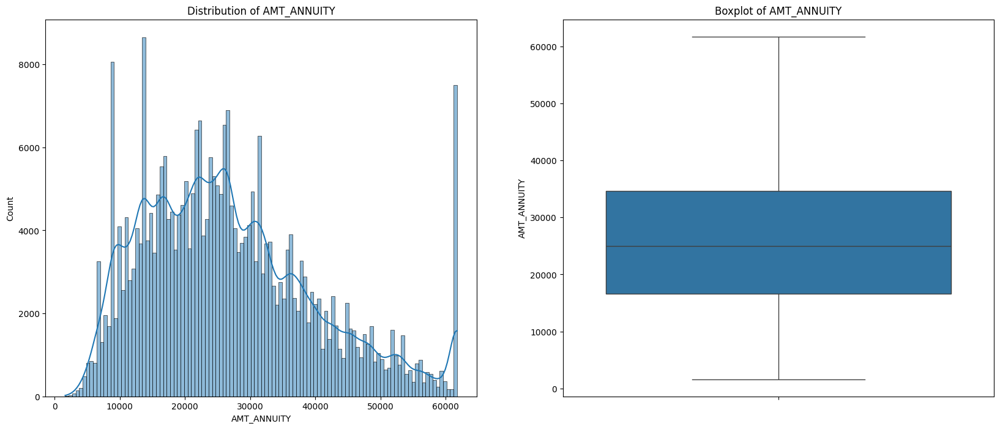

In [37]:
func_boxplot(curr,'AMT_ANNUITY')
curr = iqr(curr, 'AMT_ANNUITY')
func_boxplot(curr,'AMT_ANNUITY')

## AMT_INCOME_TOTAL

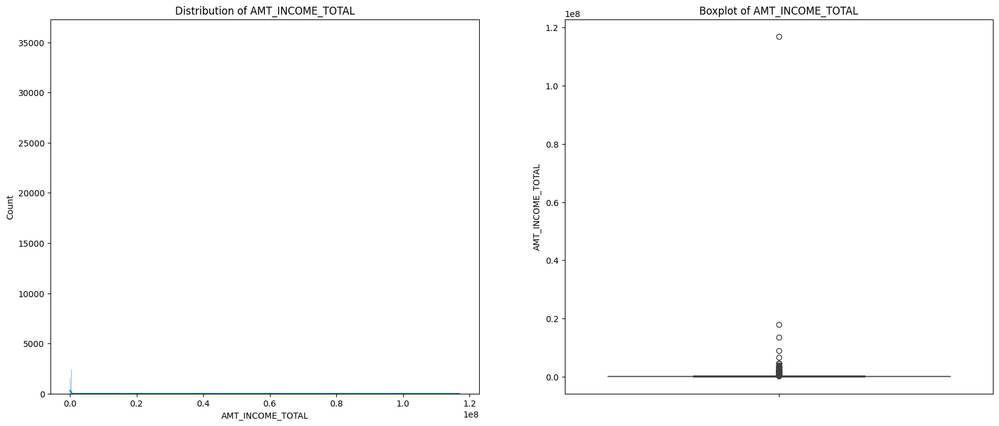

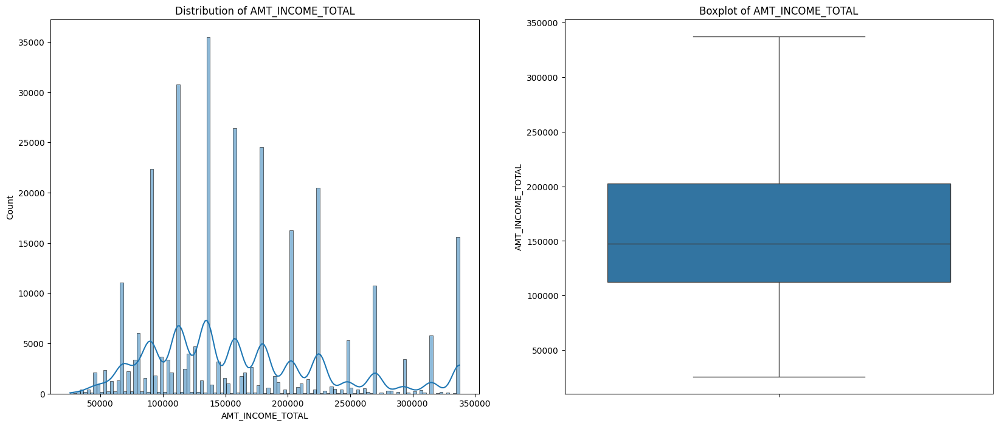

In [38]:
func_boxplot(curr,'AMT_INCOME_TOTAL')
curr = iqr(curr, 'AMT_INCOME_TOTAL')
func_boxplot(curr,'AMT_INCOME_TOTAL')

## AMT_GOODS_PRICE

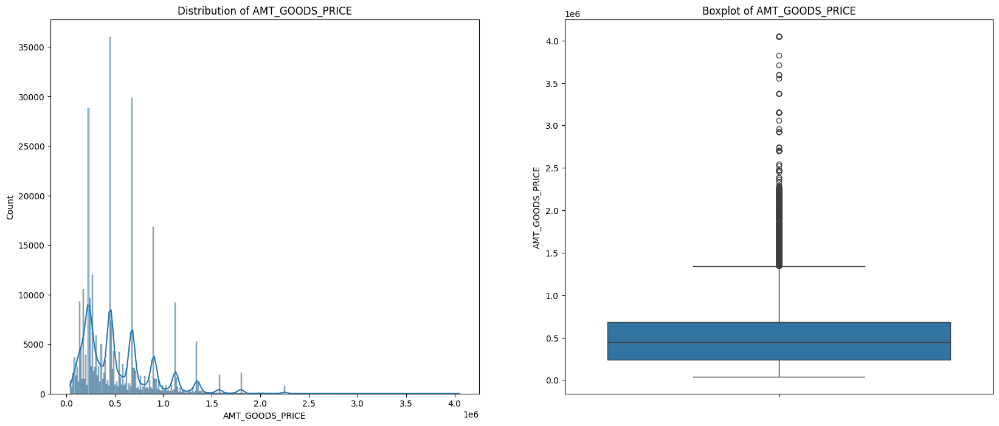

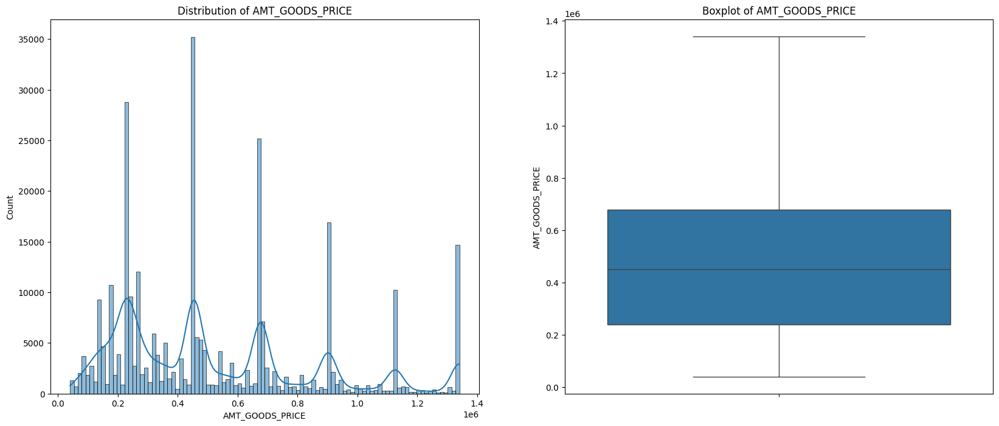

In [39]:
func_boxplot(curr,'AMT_GOODS_PRICE')
curr = iqr(curr, 'AMT_GOODS_PRICE')
func_boxplot(curr,'AMT_GOODS_PRICE')

# <font color= red>Data Imbalance

In [40]:
#checking exact Target 0 to Target 1 ratio
curr[curr.TARGET==0].shape[0]/curr[curr.TARGET==1].shape[0]

11.345684517776787

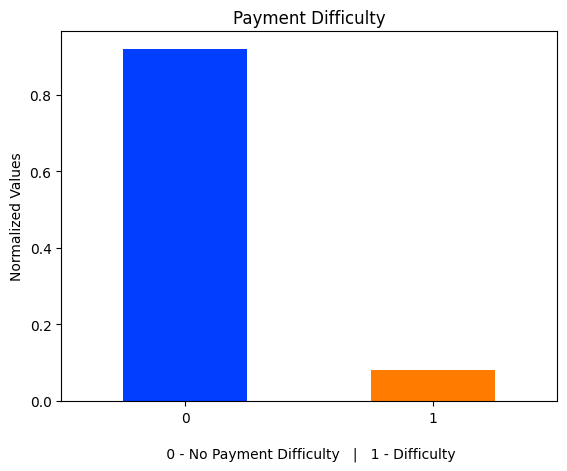

In [41]:
curr.TARGET.value_counts(normalize=True).plot.bar(color=sns.color_palette("bright"))
plt.title("Payment Difficulty")
plt.xlabel("\n 0 - No Payment Difficulty   |   1 - Difficulty")
plt.xticks(rotation=0)
plt.ylabel("Normalized Values")
plt.show()

 **There is a high imbalance observed in the data, as depicted in the plot, where out of 11 individuals, only 1 person is facing payment difficulties.**

# <font color= red> Binning Continuous Numeric Column

# DAYS_BIRTH

In [42]:
curr['DAYS_BIRTH'].max()

69

In [43]:
curr['DAYS_BIRTH'].min()

20

In [44]:
curr['AGE_GROUP']= pd.cut(curr.DAYS_BIRTH,bins=[20,25,30,35,40,45,50,55,60,65,70])

curr['AGE_GROUP'].value_counts(normalize=True)

AGE_GROUP
(35, 40]    0.142039
(40, 45]    0.130148
(30, 35]    0.128326
(25, 30]    0.118461
(50, 55]    0.114199
(45, 50]    0.112022
(55, 60]    0.106499
(60, 65]    0.079181
(20, 25]    0.052819
(65, 70]    0.016307
Name: proportion, dtype: float64

In [45]:
# col_seg=['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','DAYS_ID_PUBLISH','DAYS_REGISTRATION','DAYS_BIRTH']

# AMT_INCOME_TOTAL

In [46]:
curr['AMT_INCOME_TOTAL'].max()

337500.0

In [47]:
curr['AMT_INCOME_TOTAL'].min()

25650.0

In [48]:
curr['INCOME_GROUP']= pd.cut(curr.AMT_INCOME_TOTAL,bins=[25000,50000,75000,100000,125000,150000,175000,200000,225000,250000,275000,300000,3250000,3500000])

# AMT_CREDIT

In [49]:
curr['AMT_CREDIT'].min()

45000.0

In [50]:
curr['AMT_CREDIT'].max()

1616625.0

In [51]:
curr['CREDIT_GROUP']= pd.cut(curr.AMT_CREDIT,bins=[40000,300000,600000,900000,1200000,1500000,1800000])

# AMT_ANNUITY

In [52]:
curr['AMT_ANNUITY'].max()

61742.25

In [53]:
curr['AMT_ANNUITY'].min()

1615.5

In [54]:
curr['ANNUITY_GROUP']= pd.cut(curr.AMT_ANNUITY,bins=[1600,5000,10000,15000,20000,25000,30000,35000,40000,45000,50000,55000,60000,65000])

# DAYS_ID_PUBLISH

In [55]:
curr['DAYS_ID_PUBLISH'].max()

19

In [56]:
curr['DAYS_ID_PUBLISH'].min()

0

In [57]:
curr['PUBLISH_GROUP']= pd.cut(curr.DAYS_ID_PUBLISH,bins=[0,4,8,12,16,20])

# DAYS_REGISTRATION

In [58]:
curr['DAYS_REGISTRATION'].max()

67

In [59]:
curr['DAYS_REGISTRATION'].min()

0

In [60]:
curr['REGISTRATION_GROUP']= pd.cut(curr.DAYS_REGISTRATION,bins=[ 0,10,20,30,40,50,60,70])

In [61]:
curr.drop(columns=['FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_21', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_12'],inplace=True)

### <font color = red> Divide columns into categoric and numeric columns

In [62]:
category=[]
numeric=[]
for i in curr.columns:
    if curr[i].dtypes=="object":
        category.append(i)
    else:
        numeric.append(i)

catvar=[]
for i in numeric:
    if len(curr[i].unique())<4:
        curr[i].astype("category")
        catvar.append(i)

## Categorical columns

In [63]:
print(category)

['OCCUPATION_TYPE', 'NAME_TYPE_SUITE', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'NAME_HOUSING_TYPE', 'NAME_FAMILY_STATUS', 'NAME_EDUCATION_TYPE', 'NAME_INCOME_TYPE']


## Numeric columns

In [64]:
print(numeric)

['EXT_SOURCE_3', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'EXT_SOURCE_2', 'AMT_GOODS_PRICE', 'AMT_ANNUITY', 'CNT_FAM_MEMBERS', 'DAYS_LAST_PHONE_CHANGE', 'CNT_CHILDREN', 'AMT_CREDIT', 'AMT_INCOME_TOTAL', 'FLAG_PHONE', 'LIVE_CITY_NOT_WORK_CITY', 'REG_CITY_NOT_WORK_CITY', 'TARGET', 'REG_CITY_NOT_LIVE_CITY', 'LIVE_REGION_NOT_WORK_REGION', 'REG_REGION_NOT_WORK_REGION', 'REG_REGION_NOT_LIVE_REGION', 'HOUR_APPR_PROCESS_START', 'REGION_RATING_CLIENT_W_CITY', 'REGION_RATING_CLIENT', 'FLAG_EMAIL', 'FLAG_CONT_MOBILE', 'FLAG_WORK_PHONE', 'FLAG_EMP_PHONE', 'FLAG_MOBIL', 'DAYS_ID_PUBLISH', 'DAYS_REGISTRATION', 'DAYS_EMPLOYED', 'DAYS_BIRTH', 'REGION_POPULATION_RELATIVE', 'SK_ID_CURR', 'AGE_GROUP', 'INCOME_GROUP', 'CREDIT_GROUP', 'ANNUITY_GROUP', 'PUBLISH_GR

## categorical numeric columns

In [65]:
print(catvar)

['FLAG_PHONE', 'LIVE_CITY_NOT_WORK_CITY', 'REG_CITY_NOT_WORK_CITY', 'TARGET', 'REG_CITY_NOT_LIVE_CITY', 'LIVE_REGION_NOT_WORK_REGION', 'REG_REGION_NOT_WORK_REGION', 'REG_REGION_NOT_LIVE_REGION', 'REGION_RATING_CLIENT_W_CITY', 'REGION_RATING_CLIENT', 'FLAG_EMAIL', 'FLAG_CONT_MOBILE', 'FLAG_WORK_PHONE', 'FLAG_EMP_PHONE', 'FLAG_MOBIL']


## <font color =red> UNIVARIATE ANALYSIS

In [66]:
def count_func(curr,i):
    plt.figure(figsize=(10, 6))
    sns.countplot(data=curr, x=i)
    plt.title(f'Count Plot for {i}')
    plt.ylabel('Count')
    plt.xlabel(i)
    plt.xticks(rotation=90)
    plt.show()


##  <font color=blue> Dataframe divided into Target 1 and Target 0
Target variable 1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample <br>
Target variable 0 - all other cases, ie no payment difficulties


In [67]:
curr_true=curr[curr['TARGET']==1]
curr_false=curr[curr['TARGET']==0]

OCCUPATION_TYPE
NaN                      31.34
Laborers                 17.97
Sales staff              10.44
Core staff                8.95
Managers                  6.93
Drivers                   6.06
High skill tech staff     3.70
Accountants               3.18
Medicine staff            2.78
Security staff            2.19
Cooking staff             1.94
Cleaning staff            1.52
Private service staff     0.86
Low-skill Laborers        0.68
Waiters/barmen staff      0.44
Secretaries               0.42
Realty agents             0.24
HR staff                  0.18
IT staff                  0.17
Name: proportion, dtype: float64


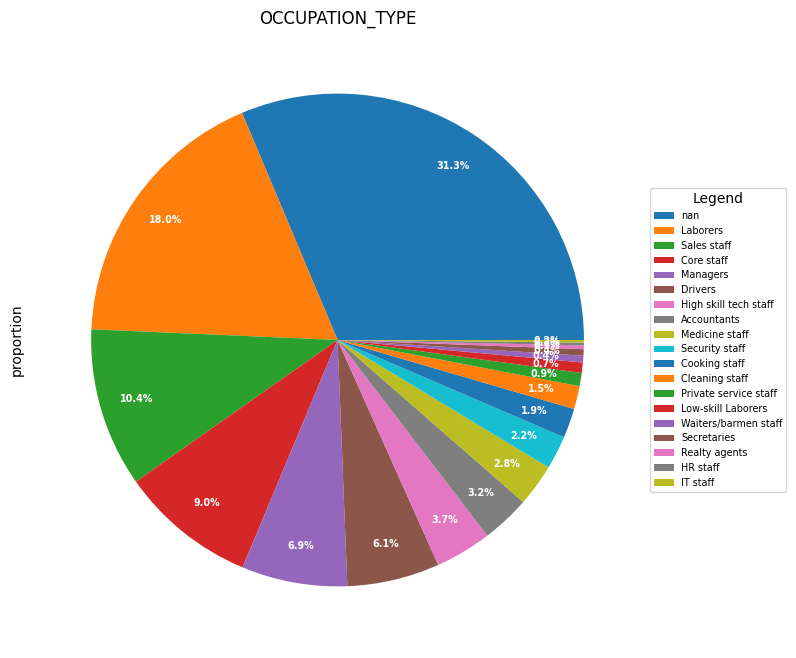

NAME_TYPE_SUITE
Unaccompanied      81.15
Family             13.12
Spouse, partner     3.71
Children            1.07
Other_B             0.58
Other_A             0.28
Group of people     0.09
Name: proportion, dtype: float64


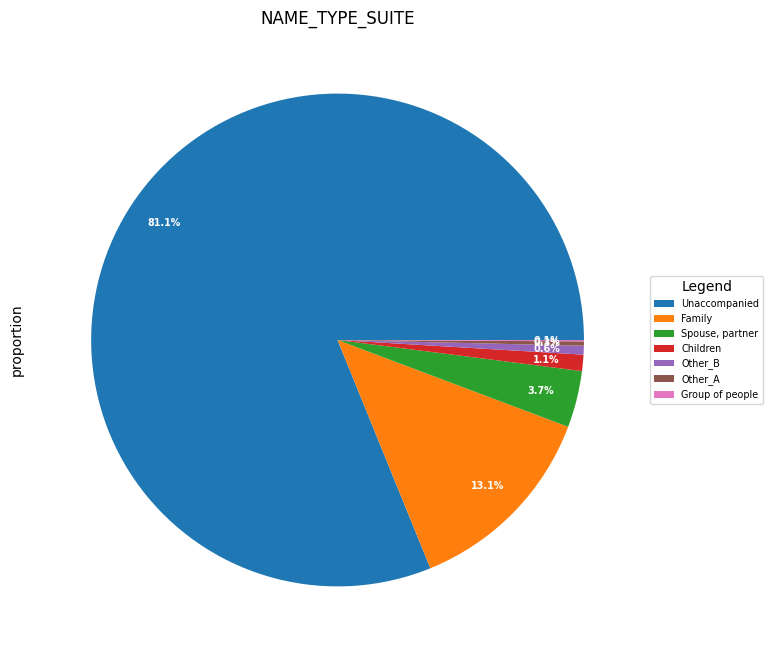

NAME_CONTRACT_TYPE
Cash loans         90.83
Revolving loans     9.17
Name: proportion, dtype: float64


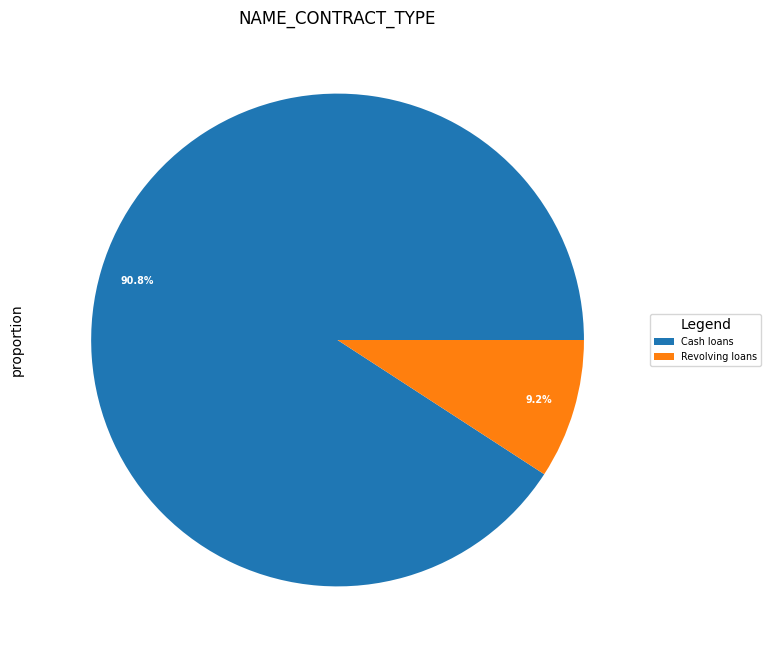

CODE_GENDER
F    65.83
M    34.17
Name: proportion, dtype: float64


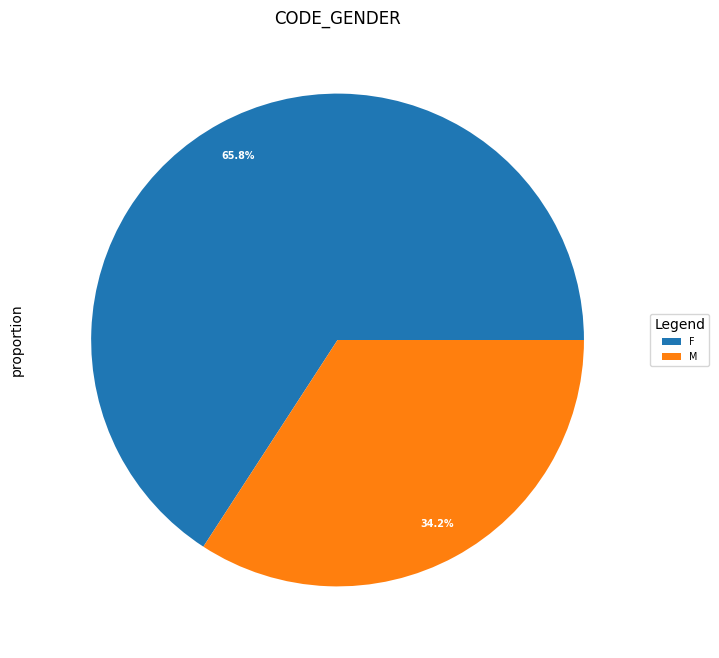

FLAG_OWN_CAR
N    65.97
Y    34.03
Name: proportion, dtype: float64


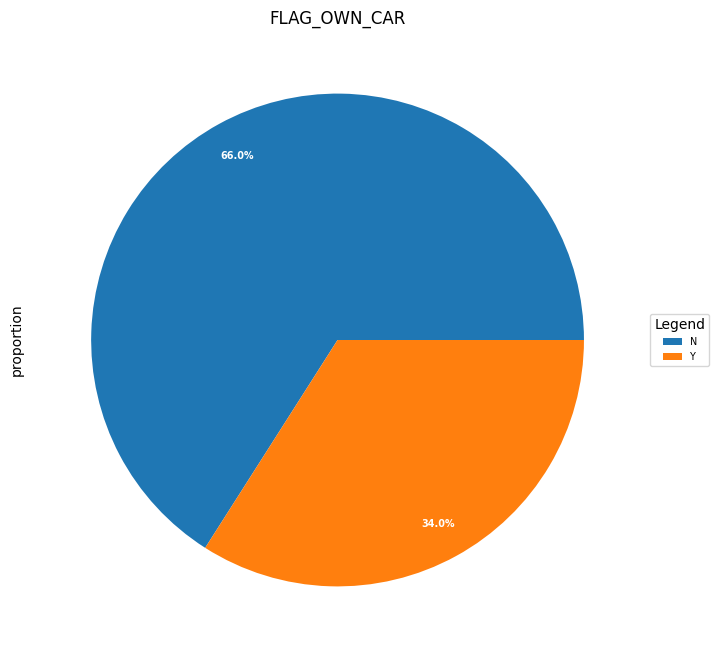

FLAG_OWN_REALTY
Y    69.5
N    30.5
Name: proportion, dtype: float64


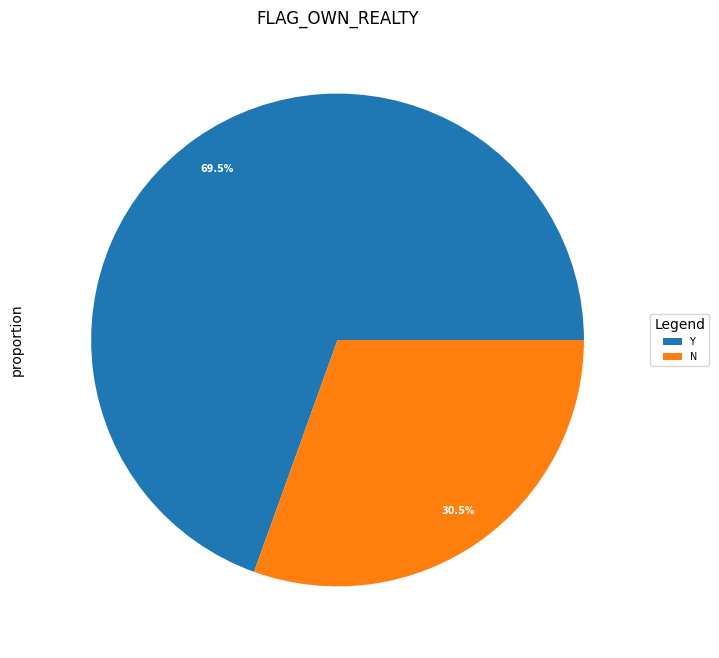

WEEKDAY_APPR_PROCESS_START
TUESDAY      17.53
WEDNESDAY    16.88
MONDAY       16.51
THURSDAY     16.45
FRIDAY       16.36
SATURDAY     11.00
SUNDAY        5.26
Name: proportion, dtype: float64


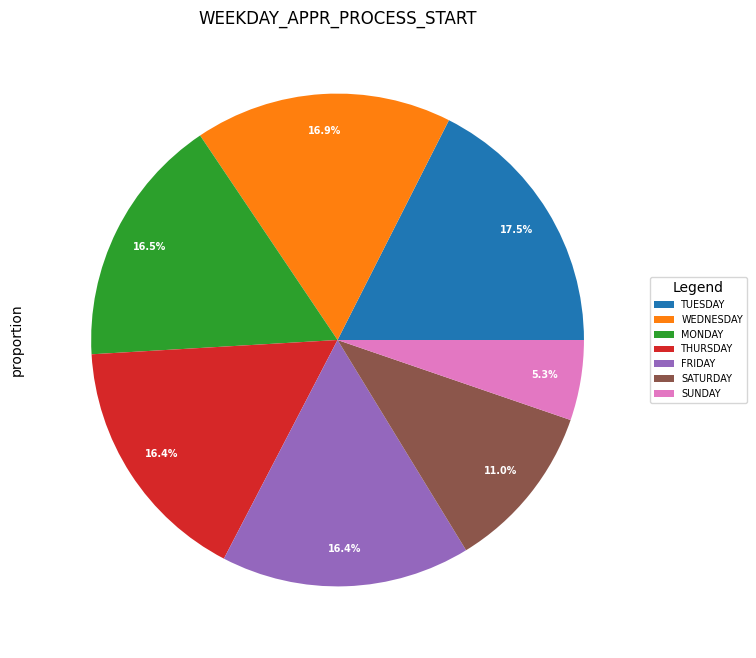

ORGANIZATION_TYPE
Business Entity Type 3    22.09
XNA                       18.01
Self-employed             12.49
Other                      5.43
Medicine                   3.64
Business Entity Type 2     3.43
Government                 3.38
School                     2.90
Trade: type 7              2.55
Kindergarten               2.24
Construction               2.19
Business Entity Type 1     1.94
Transport: type 4          1.76
Trade: type 3              1.13
Industry: type 9           1.09
Industry: type 3           1.07
Security                   1.06
Housing                    0.96
Industry: type 11          0.88
Military                   0.86
Bank                       0.81
Agriculture                0.80
Police                     0.76
Transport: type 2          0.72
Postal                     0.70
Security Ministries        0.64
Trade: type 2              0.61
Restaurant                 0.59
Services                   0.51
University                 0.43
Industry: type 7      

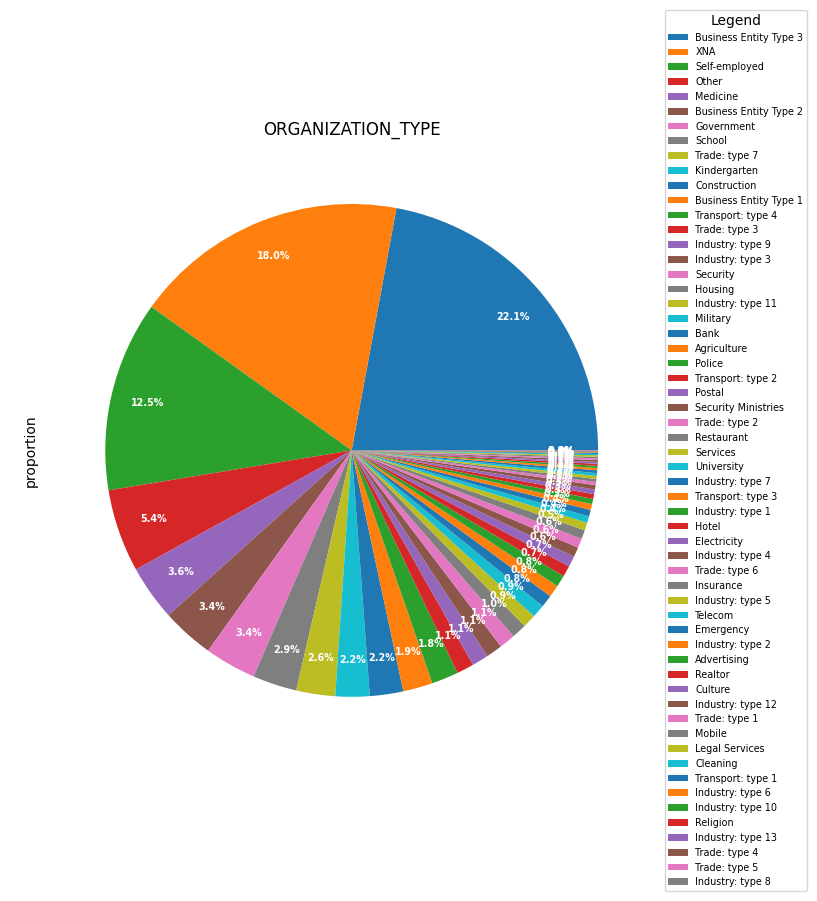

NAME_HOUSING_TYPE
House / apartment      88.74
With parents            4.82
Municipal apartment     3.64
Rented apartment        1.59
Office apartment        0.85
Co-op apartment         0.36
Name: proportion, dtype: float64


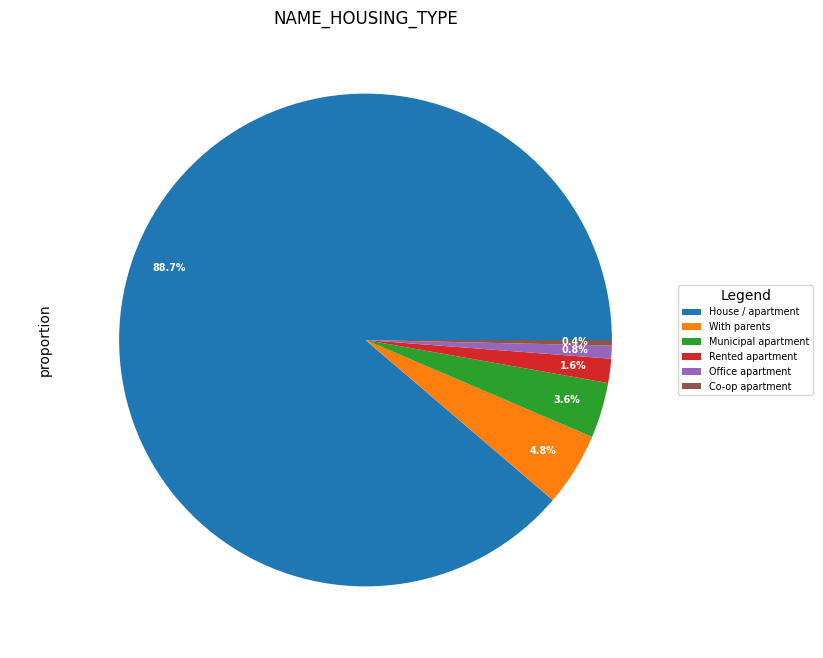

NAME_FAMILY_STATUS
Married                 63.92
Single / not married    14.74
Civil marriage           9.68
Separated                6.43
Widow                    5.23
Name: proportion, dtype: float64


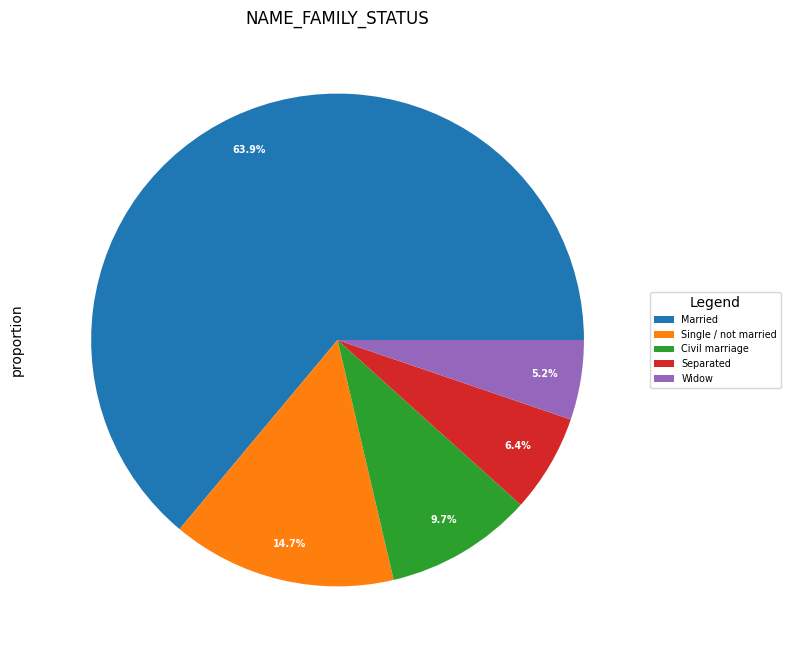

NAME_EDUCATION_TYPE
Secondary / secondary special    71.12
Higher education                 24.24
Incomplete higher                 3.34
Lower secondary                   1.24
Academic degree                   0.05
Name: proportion, dtype: float64


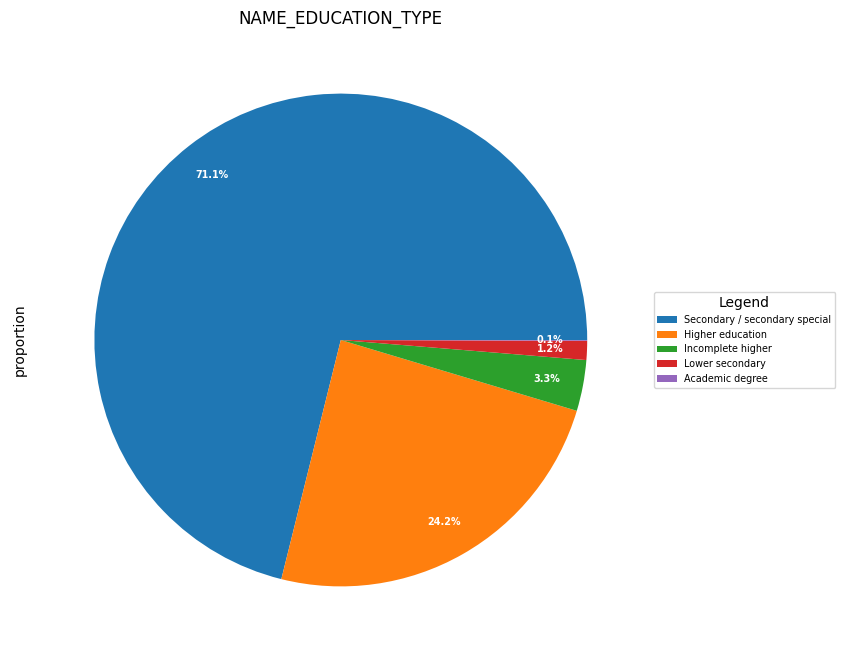

NAME_INCOME_TYPE
Working                 51.67
Commercial associate    23.25
Pensioner               18.01
State servant            7.06
Unemployed               0.01
Student                  0.01
Businessman              0.00
Maternity leave          0.00
Name: proportion, dtype: float64


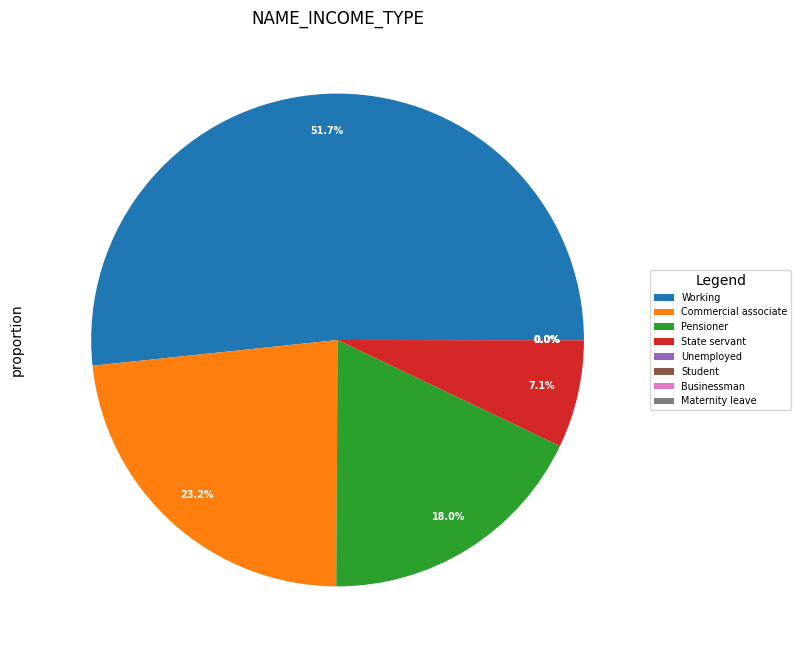

In [68]:


for column in curr.columns:
    if curr[column].dtypes == "object":
        value_counts_percentage = (curr[column].value_counts(normalize=True, dropna=False) * 100).round(2)
        print(value_counts_percentage)
        
        plt.figure(figsize=[8,8])
        pie = curr[column].value_counts(normalize=True, dropna=False).plot.pie(labeldistance=1.1, autopct='%1.1f%%', pctdistance=0.85)
        plt.title(column)
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='x-small')
        pie.legend(value_counts_percentage.index, title="Legend", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1), fontsize='x-small')
        
        for text in pie.texts:
            text.set_fontsize('x-small')
            text.set_color('white')
            text.set_weight('bold')
        
        plt.show()


**Inference**

1. **Loan Types:** Cash loans are more prevalent than revolving loans, constituting 90% of the loans offered.

2. **Gender Distribution:** Interestingly, 65% of the loan applicants are female, while only 34% are male. This significant difference warrants further investigation.

3. **Car Ownership:** A majority, 65%, of applicants do not own cars.

4. **Property Ownership:** 69% of applicants own their living quarters.

5. **Loan Application Accompaniment:** A significant majority, 81%, of applicants come accompanied for the loan application process.

6. **Occupation:** While the majority of applicants are from the working class, 18% are pensioners.

7. **Education Level:** 71% of applicants have a secondary education.

8. **Marital Status:** The majority, 63%, of applicants are married.

9. **Occupation Type:** Interestingly, 31% of applicants have not specified their occupation type.


In [69]:
def bar_func(column):
    plt.subplots(1,2,figsize=(20,8))
    plt.subplot(1,2,1)             
    per = curr_true[column].value_counts(normalize=True) * 100
    sns.barplot(x=per.index, y=per.values, palette='bright')
    plt.xticks(rotation=90)
    plt.title('PAYMENT WITH DIFFICULTY')
    
    plt.subplot(1,2,2)
    per = curr_false[column].value_counts(normalize=True) * 100
    sns.barplot(x=per.index, y=per.values, palette='bright')
    plt.xticks(rotation=90)
    plt.title('PAYMENT ON TIME')
    

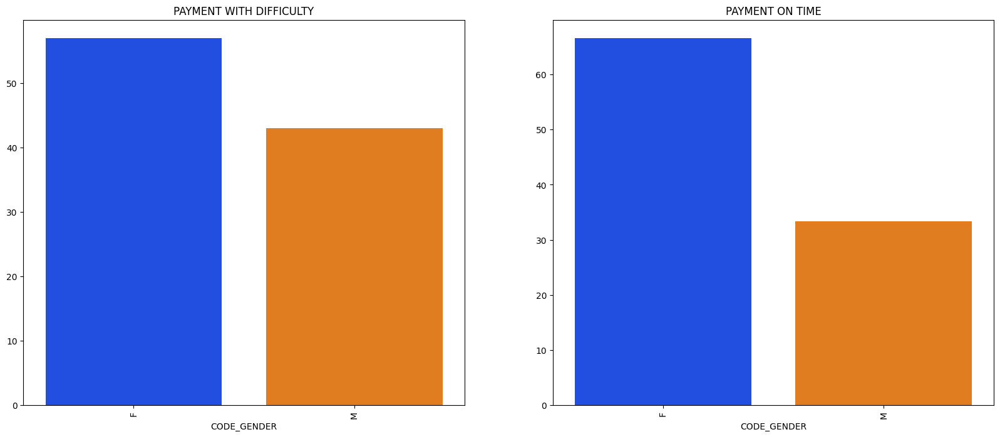

In [70]:
bar_func('CODE_GENDER')

**Inference:**
<br>Points to be concluded from the above graph

* Female applicants outnumber male applicants. The percentage of male applicants experiencing payment difficulties is about 10%, compared to 7% for female applicants. The difference in payment difficulty percentages between genders is minimal; it is nearly the same.

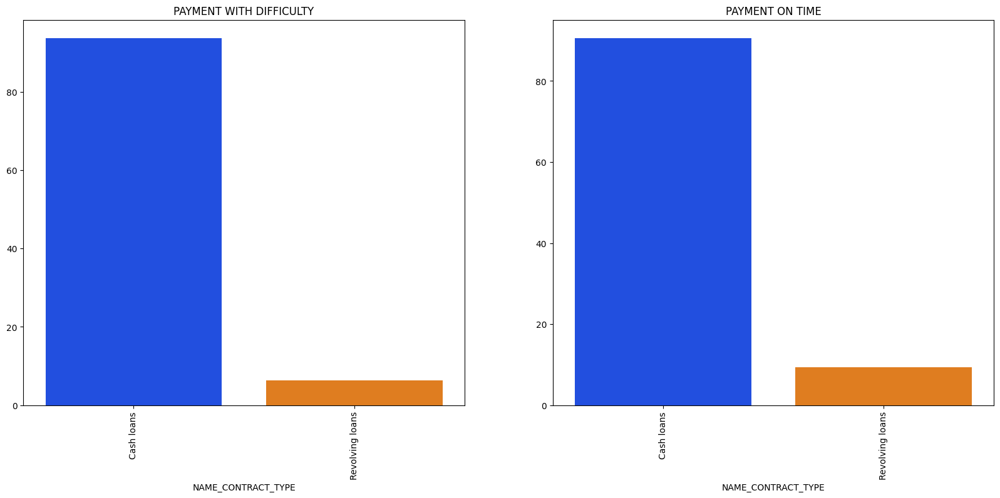

In [71]:
bar_func('NAME_CONTRACT_TYPE')

**Inference:**
<br>Points to be concluded from the above graph

* mostly cash loans are taken in maximum in compared to revolving loans

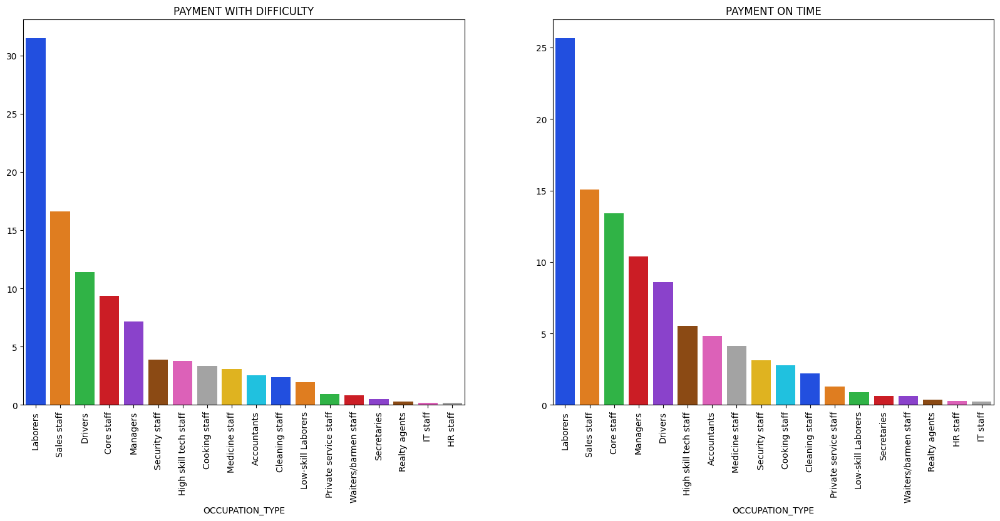

In [72]:
bar_func('OCCUPATION_TYPE')

**Inference**
* Laborers are in maximum number followed by sales stuff applicants 

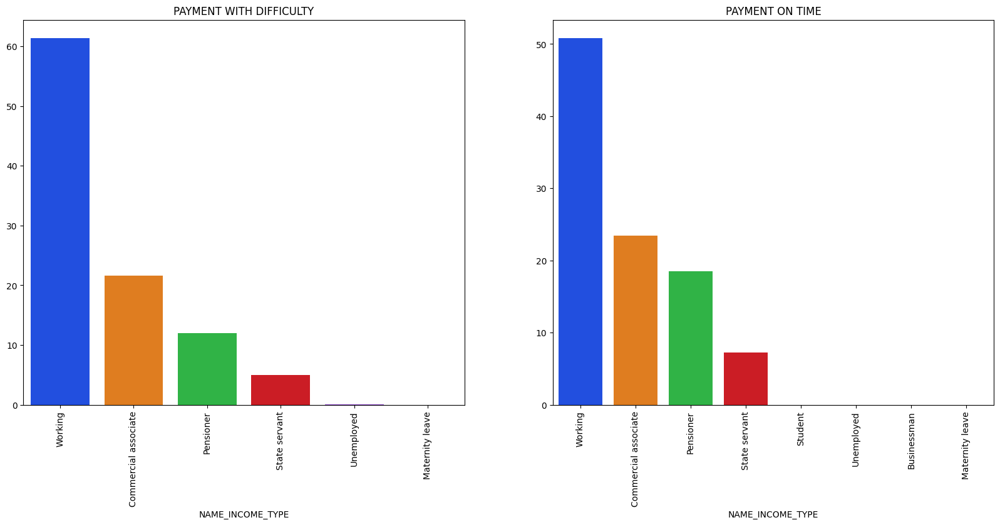

In [73]:
bar_func('NAME_INCOME_TYPE')

**Inference**
* Working are maximum iare mostly facing payment difficulties
* commercial & associate piosioners are doing their payment on time

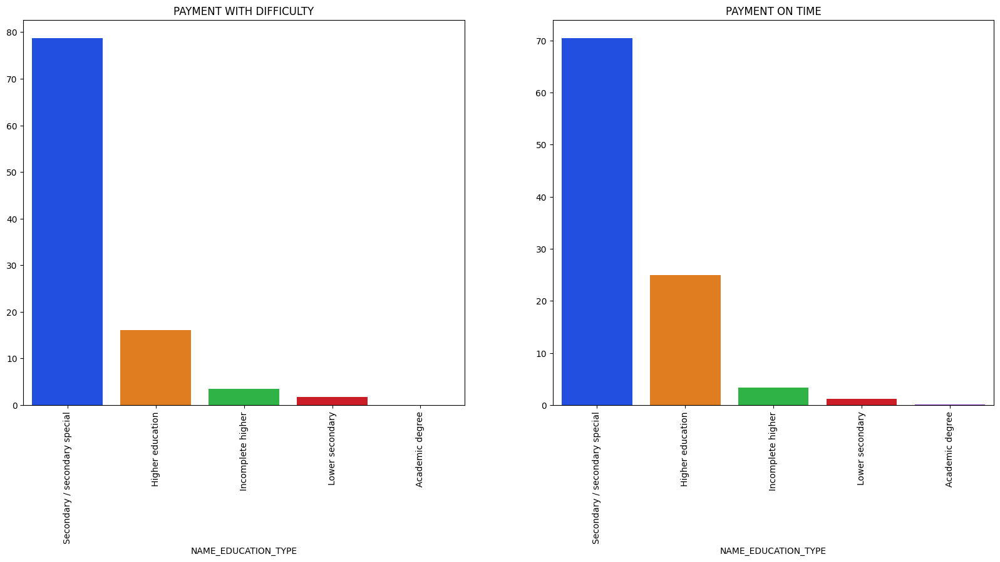

In [74]:
bar_func('NAME_EDUCATION_TYPE')

**Inference**
    * Secondary / Secondary Special facing payment dififculties where as on the other hand Higher education people are doing payment on time

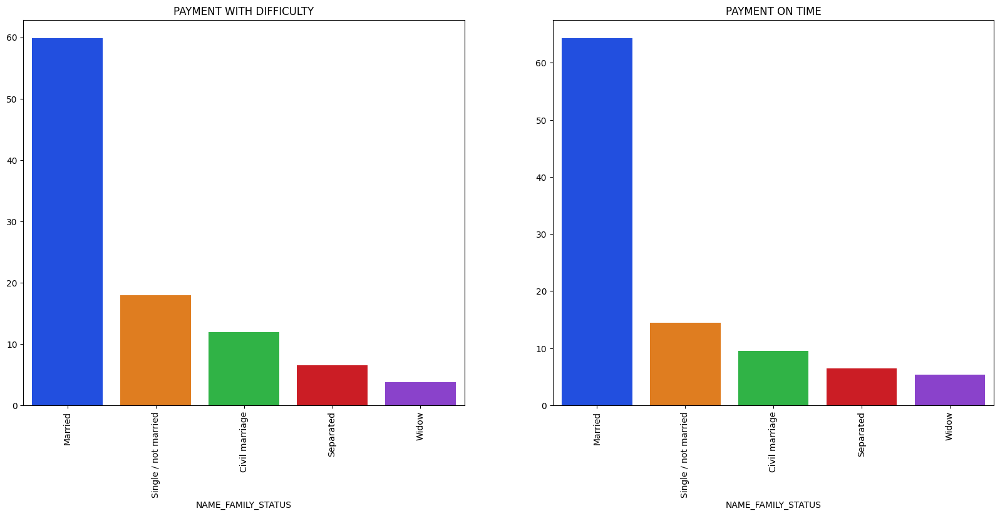

In [75]:
bar_func('NAME_FAMILY_STATUS')

**Inference**
- Married are doing payement on time
- single / not married are facing payment difficulties

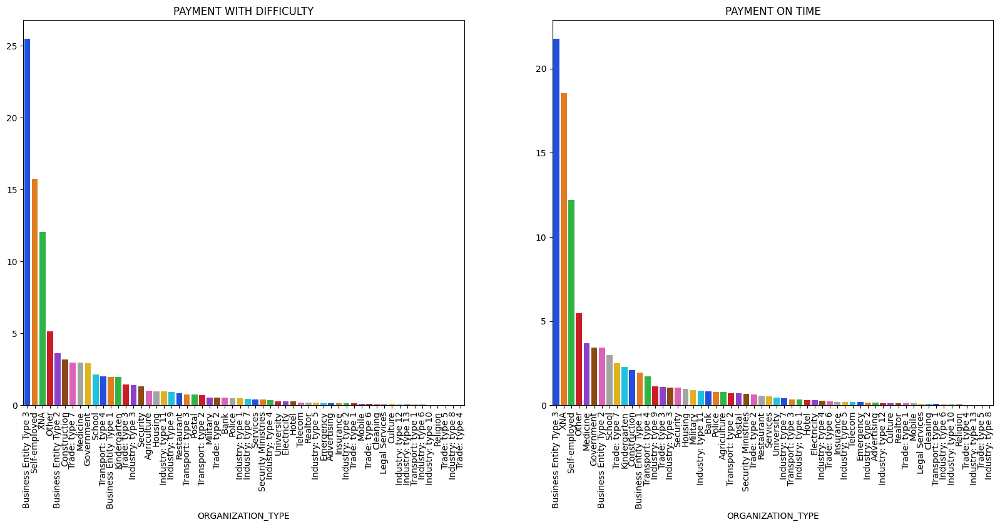

In [76]:
bar_func('ORGANIZATION_TYPE')

**Inference**
- business entities are facing payment difficulties mainly as compared to other organisation types

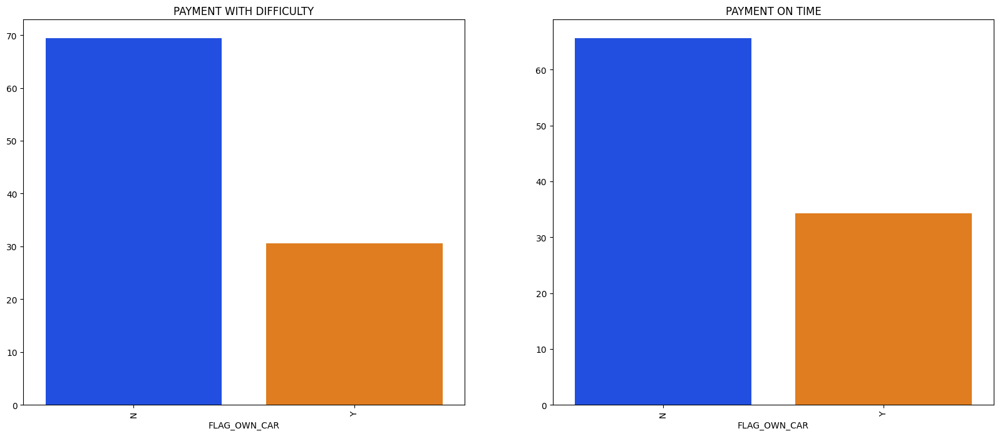

In [77]:
bar_func('FLAG_OWN_CAR')

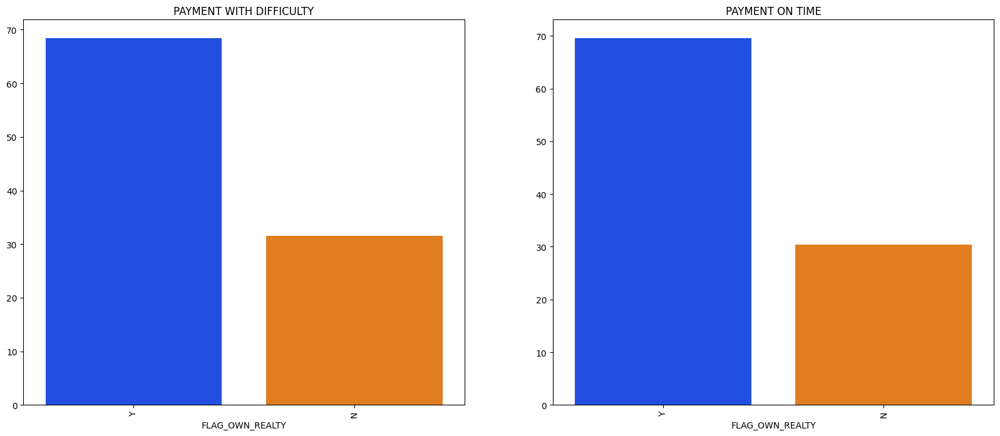

In [78]:
bar_func('FLAG_OWN_REALTY')

**Inference**

- FLAG_OWN_CAR and FLAG_OWN_REALTY have not much effect on payment difficulties since its independent to the target Column

### <font color = red > BIVARIATE ANALYSIS OF SEGMENTED NUMERIC COLUMNS

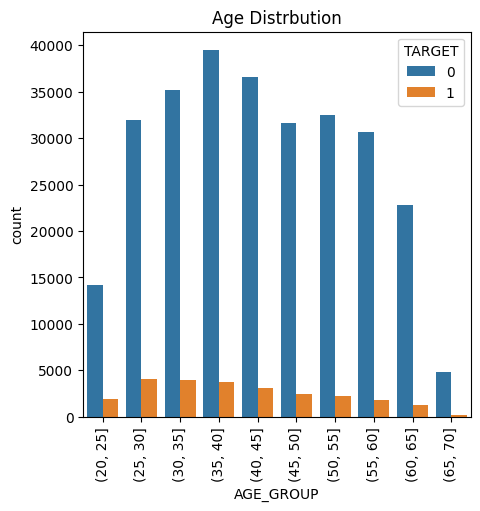

In [79]:
plt.figure(figsize =(5,5))
sns.countplot(x= "AGE_GROUP", hue = "TARGET", data = curr)
plt.title("Age Distrbution")
plt.xticks(rotation=90)
plt.show()
## BIVARIATE ANALYSIS OF SEGMENTED NUMERIC COLUMNS

**Inference:**
<br>Points to be concluded from the above graph

<br>  Customer with age in the range of 35-40 are doing their payments on time,where as customers in the of 25-30 are facing difficulty doing payments on time.Age greater than 40, percentage of payment with difficulty decreases

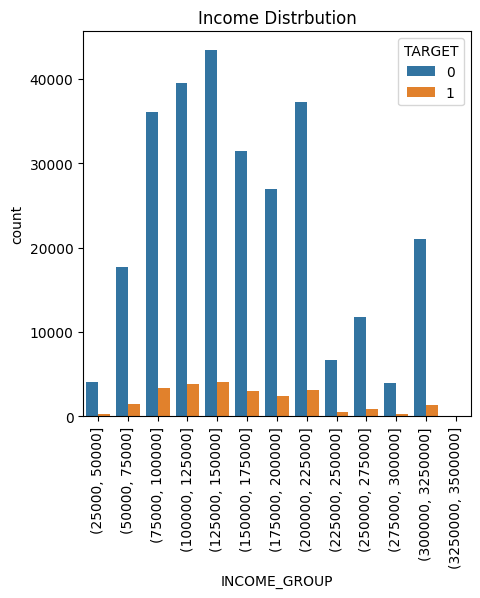

In [80]:
plt.figure(figsize =(5,5))
sns.countplot(x= 'INCOME_GROUP', hue = "TARGET", data = curr)
plt.title("Income Distrbution")
plt.xticks(rotation=90)
plt.show()

**Inference:**
<br>Points to be concluded from the above graph

<br> As the customers income increases percentage of difficulty in payments decreases.Applicants having income range of 1.25 l to 1.50 l are doing payment on time maximum count in compared to others


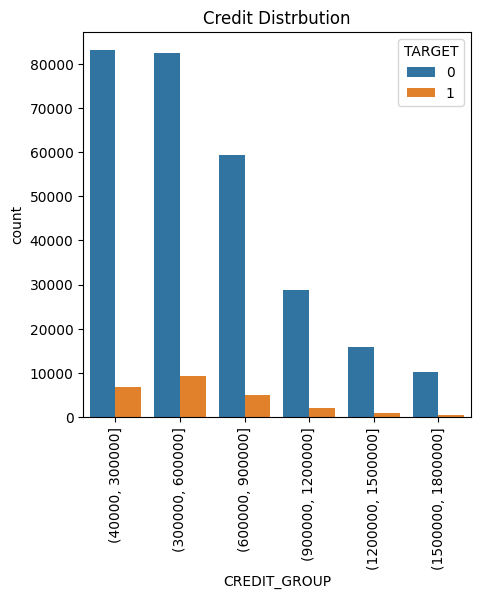

In [81]:
plt.figure(figsize =(5,5))
sns.countplot(x= "CREDIT_GROUP", hue = "TARGET", data = curr)
plt.title("Credit Distrbution")
plt.xticks(rotation=90)
plt.show()

* Maximum number of customers with payment difficulty lies in the range of 300k-600k.Customer in the range 1500k-1800k are having very less percetange of payment difficulty,And also customers with  greater credits are doing there payments on time

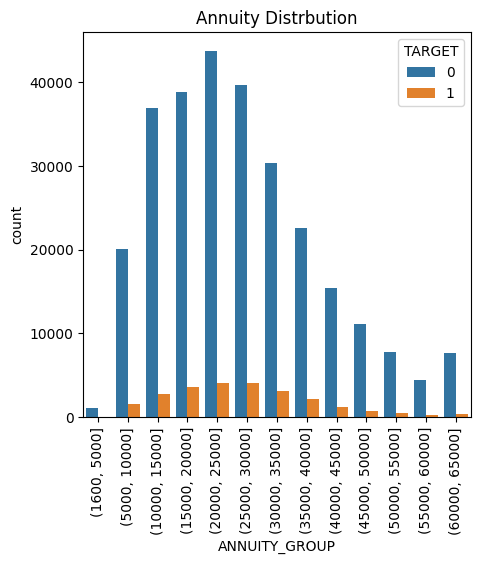

In [82]:
plt.figure(figsize =(5,5))
sns.countplot(x= 'ANNUITY_GROUP', hue = "TARGET", data = curr)
plt.title("Annuity Distrbution")
plt.xticks(rotation=90)
plt.show()

**Inference:**
<br>Points to be concluded from the above graph

<br>Applicants having annuity contract range of 20k-25k are doing payment on time

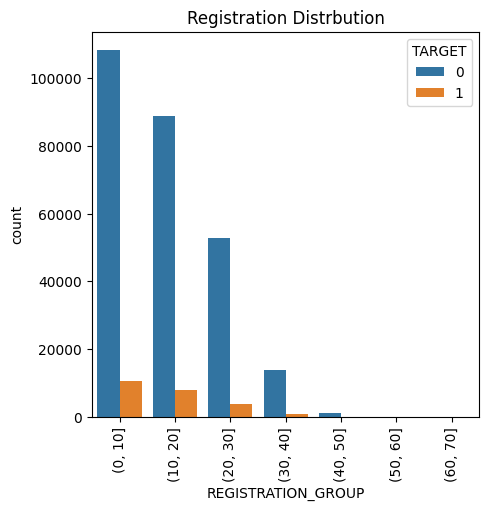

In [83]:
plt.figure(figsize =(5,5))
sns.countplot(x= 'REGISTRATION_GROUP', hue = "TARGET", data = curr)
plt.title("Registration Distrbution")
plt.xticks(rotation=90)
plt.show()

**Inference:**
<br>Points to be concluded from the above graph

<br>Applicants having tendancy to change Registration majorily in within 10 days

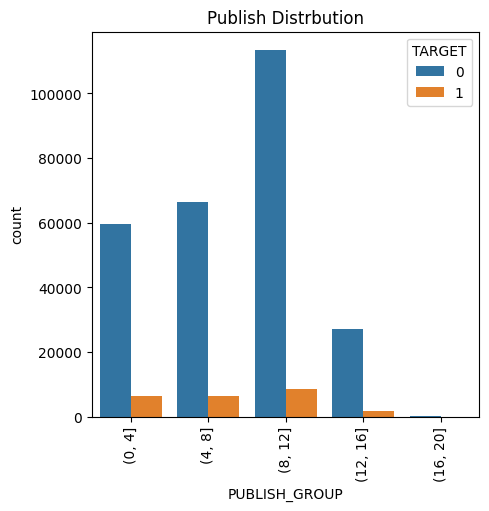

In [84]:
plt.figure(figsize =(5,5))
sns.countplot(x= 'PUBLISH_GROUP', hue = "TARGET", data = curr)
plt.title("Publish Distrbution")
plt.xticks(rotation=90)
plt.show()

**Inference:**
<br>Points to be concluded from the above graph

<br>Applicants having tendancy to change identity document majorily in between 8-12 days ,


In [85]:
curr_true=curr[curr['TARGET']==1]
curr_false=curr[curr['TARGET']==0]

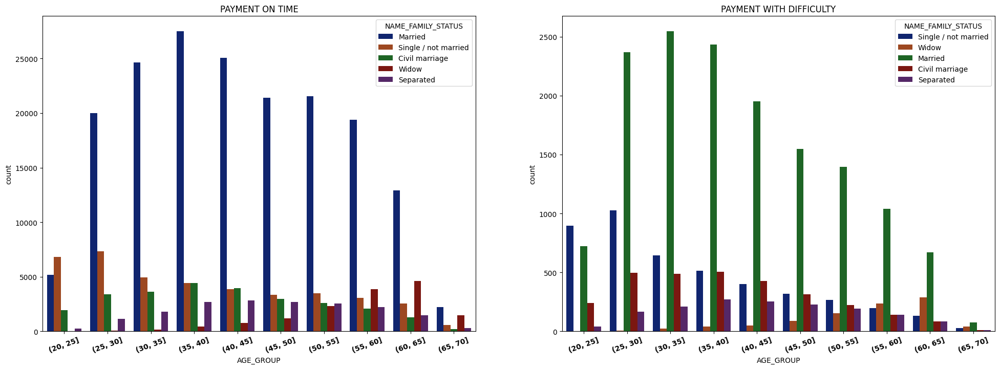

In [86]:
plt.figure(figsize=(24, 8))

plt.subplot(1, 2, 1)
plt.title("PAYMENT ON TIME")
sns.countplot(x='AGE_GROUP', data=curr_false, hue='NAME_FAMILY_STATUS', palette="dark")
plt.xticks(rotation=20, fontsize=10, fontweight='bold')

plt.subplot(1, 2, 2)
plt.title("PAYMENT WITH DIFFICULTY")
sns.countplot(x='AGE_GROUP', data=curr_true, hue='NAME_FAMILY_STATUS', palette="dark")
plt.xticks(rotation=20, fontsize=10, fontweight='bold')

plt.show()

**Inference:**
<br>Points to be concluded from the above 2 graph

<br>1.Married people of age group ( 35-40 ) are safe in terms of repayment
<br>2.single people of age group (25 -30 ) having tendency of payment difficulties

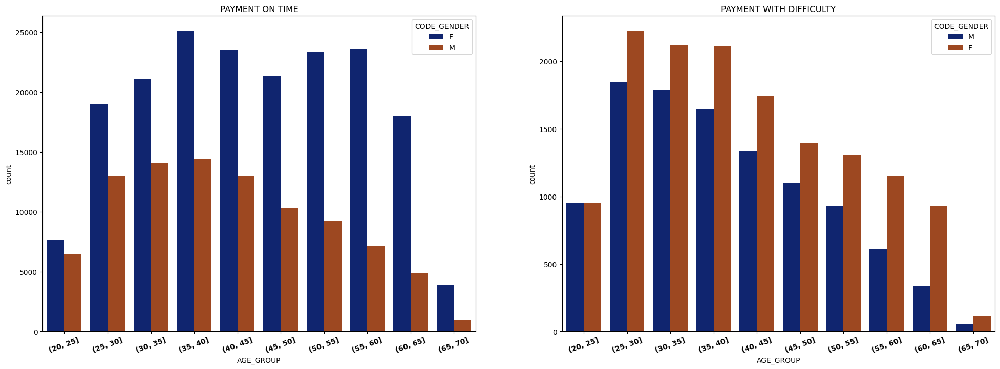

In [87]:
plt.figure(figsize=(24, 8))


plt.subplot(1, 2, 1)
plt.title("PAYMENT ON TIME")
sns.countplot(x='AGE_GROUP', data=curr_false, hue='CODE_GENDER', palette="dark")
plt.xticks(rotation=20, fontsize=10, fontweight='bold')

plt.subplot(1, 2, 2)
plt.title("PAYMENT WITH DIFFICULTY")
sns.countplot(x='AGE_GROUP', data=curr_true, hue='CODE_GENDER', palette="dark")
plt.xticks(rotation=20, fontsize=10, fontweight='bold')

plt.show()

**Inference:**
<br>Points to be concluded from the above 2 graph

<br>1.Female of age group ( 35-40 ) are safe in terms of repayment
<br>2.Male of age group ( 25-30 ) having tendency of payment difficulties

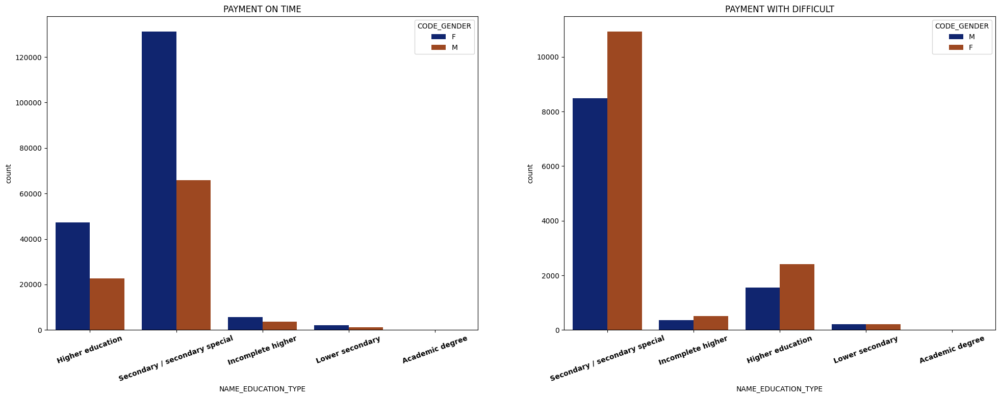

In [88]:
plt.figure(figsize=(24, 8))

# Plot for Target 0
plt.subplot(1, 2, 1)
plt.title("PAYMENT ON TIME")
sns.countplot(x='NAME_EDUCATION_TYPE', data=curr_false, hue='CODE_GENDER', palette="dark")
plt.xticks(rotation=20, fontsize=10, fontweight='bold')

# Plot for Target 1
plt.subplot(1, 2, 2)
plt.title("PAYMENT WITH DIFFICULT")
sns.countplot(x='NAME_EDUCATION_TYPE', data=curr_true, hue='CODE_GENDER', palette="dark")
plt.xticks(rotation=20, fontsize=10, fontweight='bold')

plt.show()

**Inference:**
<br>Points to be concluded from the above 2 graph

<br>1.Female having Secondary education are more reliable in terms of Paying on time
<br>2.Male having Secondary education facing payment difficulties

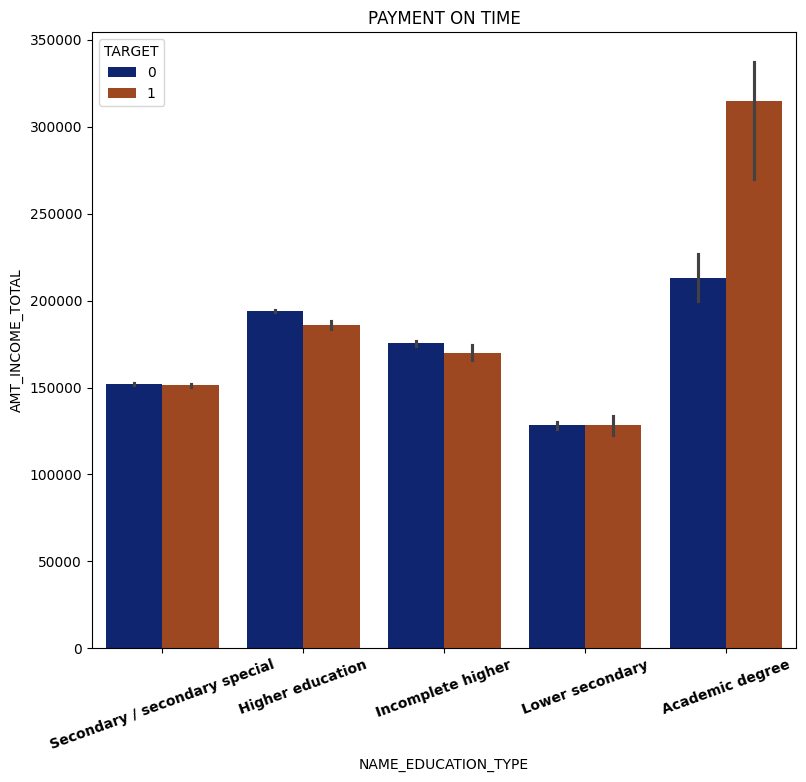

In [89]:
plt.figure(figsize=(20,8))
plt.subplot(1, 2, 1)
plt.title("PAYMENT ON TIME")
sns.barplot(x='NAME_EDUCATION_TYPE',y='AMT_INCOME_TOTAL', data=curr,hue='TARGET', palette="dark")
plt.xticks(rotation=20, fontsize=10, fontweight='bold')
plt.show()

**Inference:**
<br>Points to be concluded from the above graph

<br>1. Acemdic Degree holders having income above 30K coming under payment difficults with higher risk
<br>2.lower secondary with having income below 15k are coming under lower risk payment difficulties category

<font color=red> **Normalization - Analysis of continous numeric columns between 0 and 1**

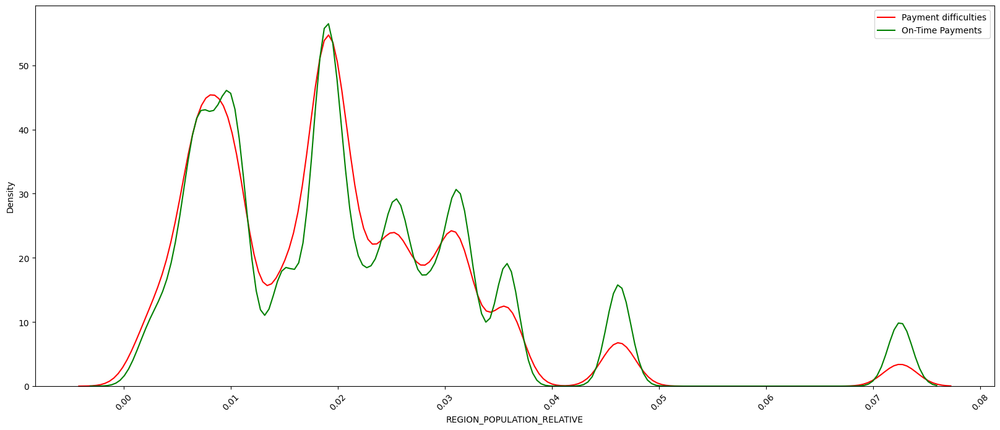

In [90]:
plt.figure(figsize=[20, 8])

sns.distplot(curr_true['REGION_POPULATION_RELATIVE'], label='Payment difficulties', hist=False, color='red')
sns.distplot(curr_false['REGION_POPULATION_RELATIVE'], label='On-Time Payments', hist=False, color='green')

plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation=45)
plt.legend()
plt.show()


- with increase in relative population density , payment diffculty decreases

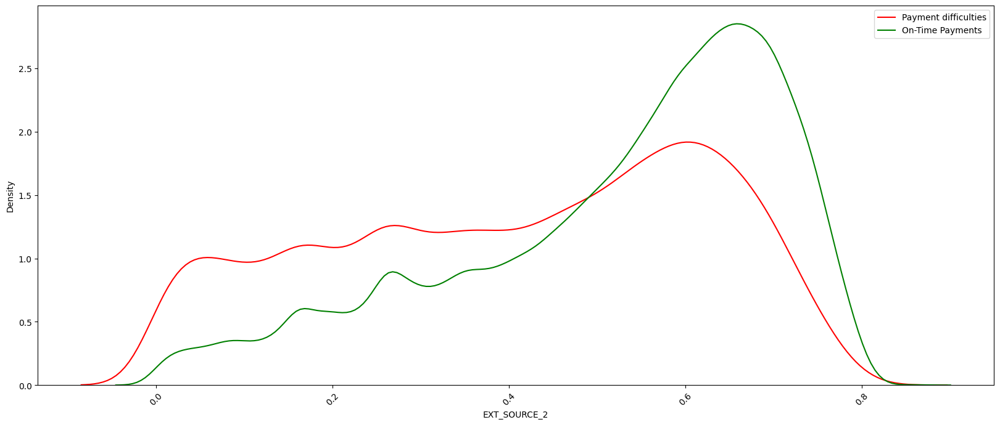

In [91]:
plt.figure(figsize = [20,8])
sns.distplot(curr_true['EXT_SOURCE_2'],label = 'Payment difficulties', hist=False ,color ="red")
sns.distplot(curr_false['EXT_SOURCE_2'],label = 'On-Time Payments', hist=False,color = "green")
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

- Higher credit scores correspond to a higher percentage of on-time payments.

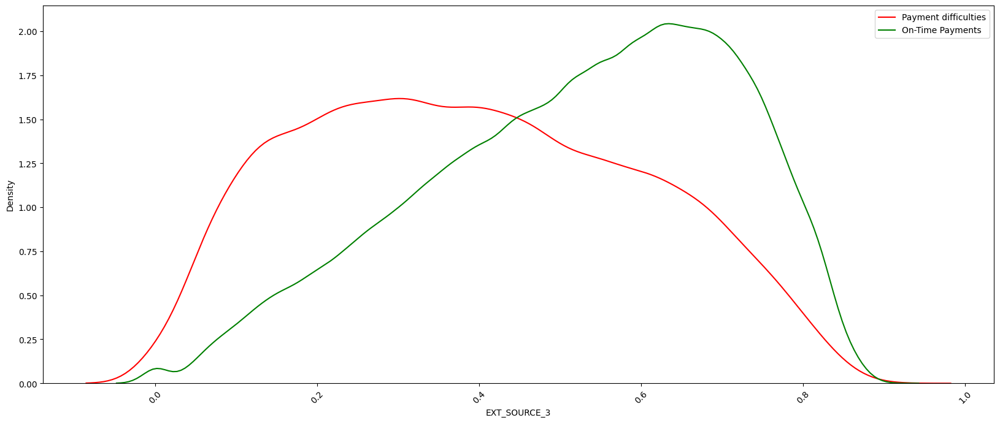

In [92]:
plt.figure(figsize = [20,8])
sns.distplot(curr_true['EXT_SOURCE_3'],label = 'Payment difficulties', hist=False,color ="red")
sns.distplot(curr_false['EXT_SOURCE_3'],label = 'On-Time Payments', hist=False,color = "green")
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

- Higher ext sources correspond to a higher percentage of on-time payments.

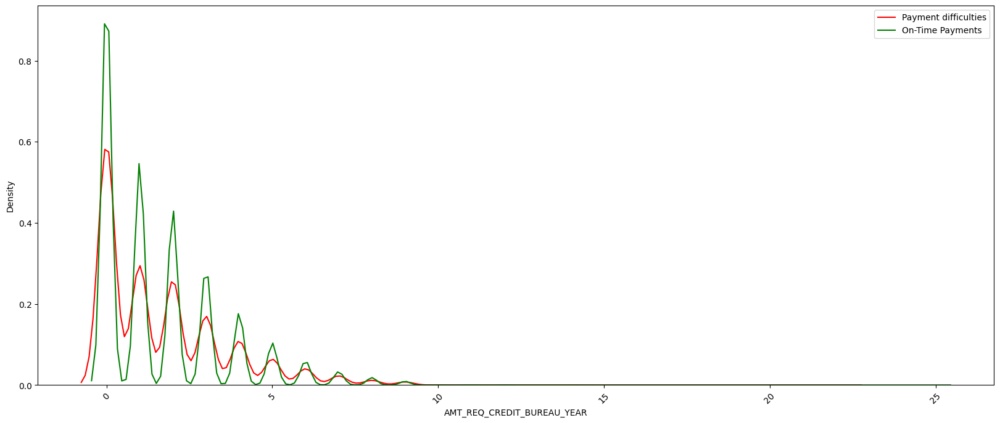

In [93]:
plt.figure(figsize = [20,8])
sns.distplot(curr_true['AMT_REQ_CREDIT_BUREAU_YEAR'],label = 'Payment difficulties', hist=False,color = "red")
sns.distplot(curr_false['AMT_REQ_CREDIT_BUREAU_YEAR'],label = 'On-Time Payments', hist=False,color = "green")
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

- Fewer inquiries correspond to on-time payments.
- Conversely, an increase in the number of inquiries correlates with a decrease in the percentage of on-time payments.

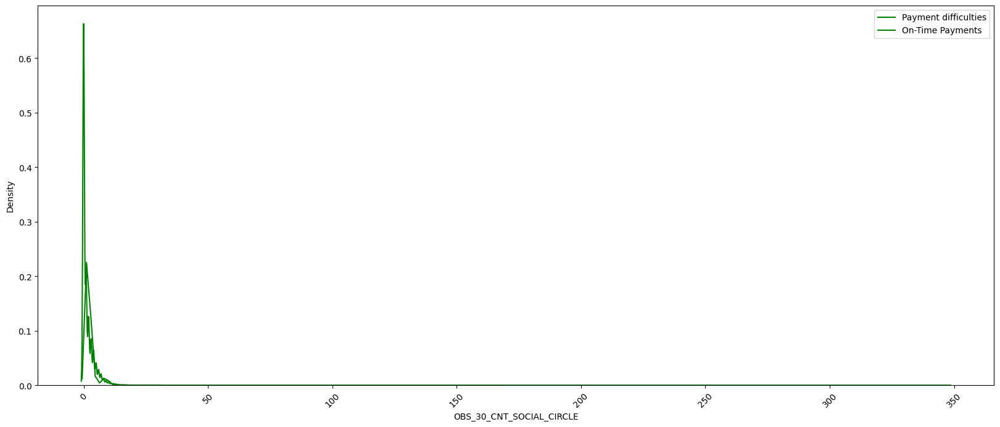

In [94]:
plt.figure(figsize = [20,8])
sns.distplot(curr_true['OBS_30_CNT_SOCIAL_CIRCLE'],label = 'Payment difficulties', hist=False,color = "green")
sns.distplot(curr_false['OBS_30_CNT_SOCIAL_CIRCLE'],label = 'On-Time Payments', hist=False,color = "green")
plt.ticklabel_format(style='plain', axis='x')
plt.xticks(rotation = 45)
plt.legend()
plt.show()

* Customers with smaller social circle are not doing payments on time

## <font color =red>MULTIVARIATE ANALYSIS

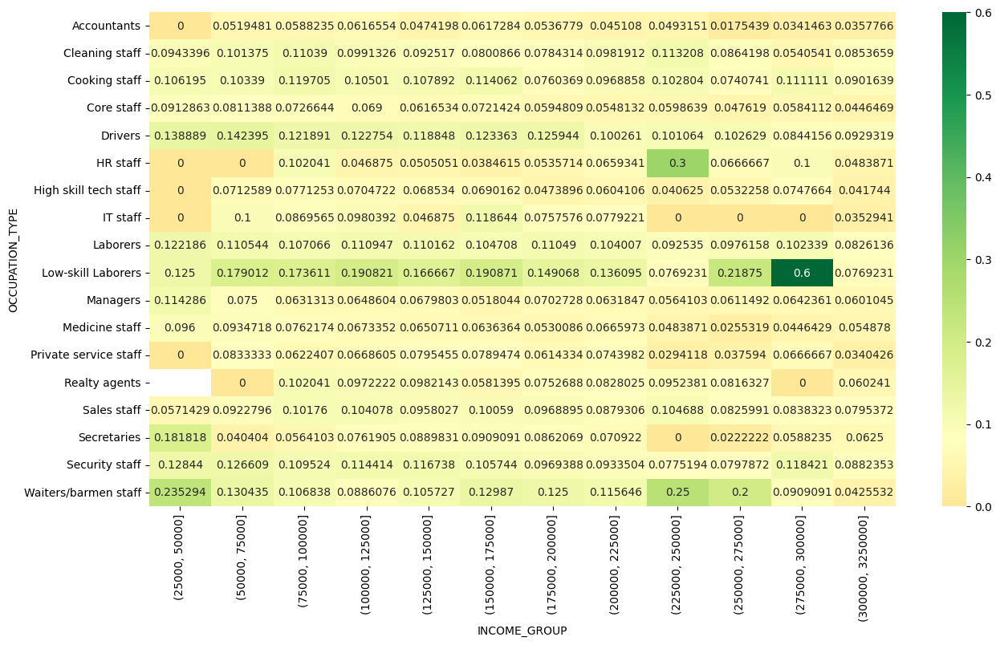

In [95]:
res=pd.pivot_table(data=curr, index="OCCUPATION_TYPE",columns='INCOME_GROUP',values='TARGET')
plt.figure(figsize=(15,8))
sns.heatmap(res,center=0.08, annot=True,cmap='RdYlGn', fmt="g")
plt.show()


* Low-skill laborers and waiters/barmen staff  with income in 275k -300k facing maximum percentage of payment difficulty seems not true income range provided is incorrect.


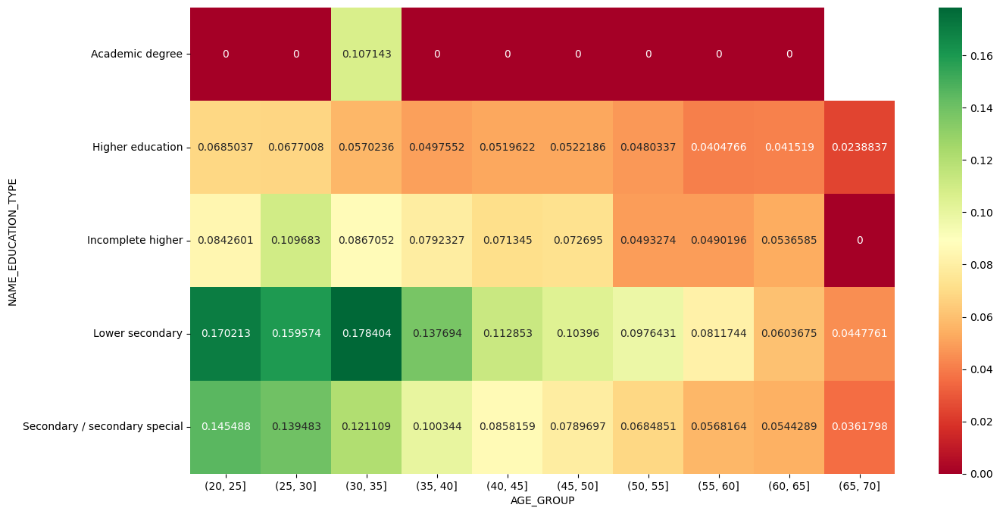

In [96]:
res=pd.pivot_table(data=curr, index="NAME_EDUCATION_TYPE",columns='AGE_GROUP',values='TARGET')
plt.figure(figsize=(15,8))
sns.heatmap(res, annot=True,cmap='RdYlGn', fmt="g")
plt.show()

Lower secondary people being in age group of 20 - 40 is facing challenge with payment where as having academic degree are much more safer in terms of timely payment


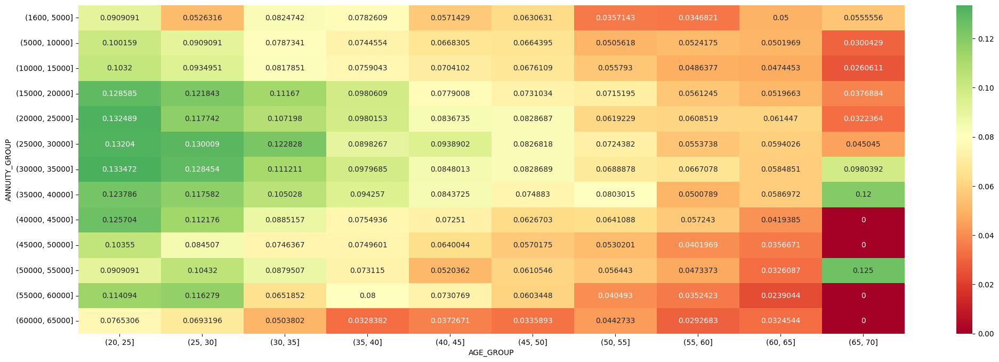

In [97]:
res=pd.pivot_table(data=curr, index="ANNUITY_GROUP",columns='AGE_GROUP',values='TARGET')
plt.figure(figsize=(25,8))
sns.heatmap(res,center=0.08, annot=True,cmap='RdYlGn', fmt="g")
plt.show()

- In ANNUITY_Bins range 15k-45k customers are facing payment difficulty for age group in between 20-30
- In ANNUITY_Bins range 55k-60k customers facing payment diffculty for the same age group.

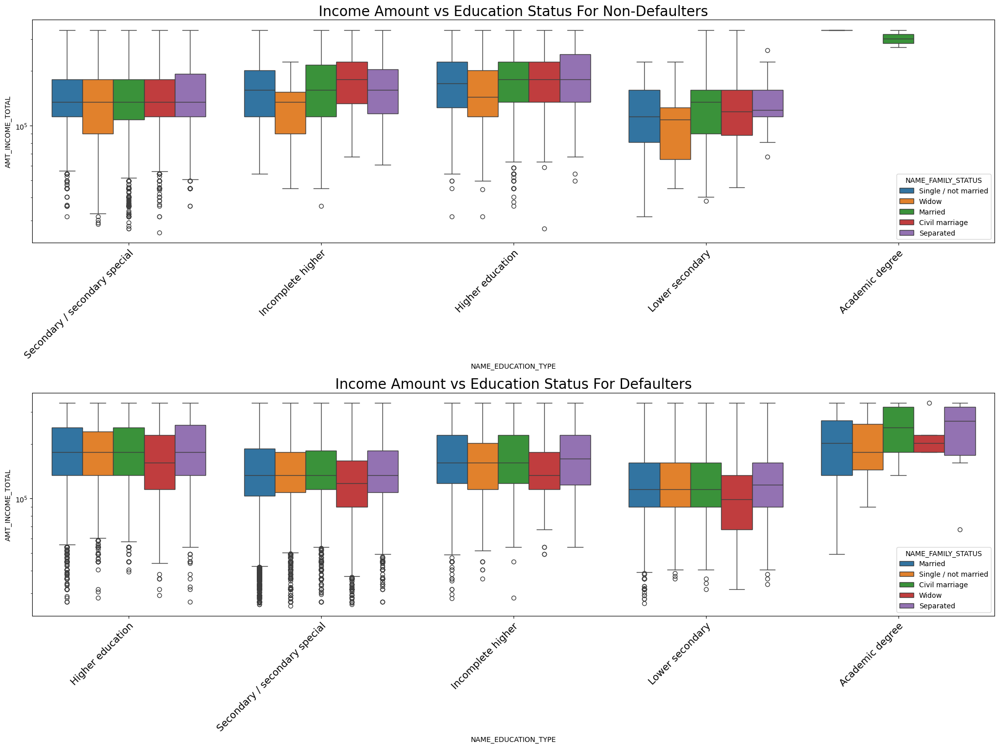

In [98]:
# Box plotting for Income amount vs Education Status for Target 0 in logarithmic scale


plt.figure(figsize=(20, 15))

plt.subplot(2, 1, 1)
plt.xticks(rotation=45, ha="right", rotation_mode="anchor", fontsize=14)
plt.yscale('log')
g1 = sns.boxplot(data=curr_true, x='NAME_EDUCATION_TYPE', y='AMT_INCOME_TOTAL', hue='NAME_FAMILY_STATUS', orient='v')
plt.title('Income Amount vs Education Status For Non-Defaulters', fontsize=20)

plt.subplot(2, 1, 2)
plt.xticks(rotation=45, ha="right", rotation_mode="anchor", fontsize=14)
plt.yscale('log')
sns.boxplot(data=curr_false, x='NAME_EDUCATION_TYPE', y='AMT_INCOME_TOTAL', hue='NAME_FAMILY_STATUS', orient='v')
plt.title('Income Amount vs Education Status For Defaulters', fontsize=20)

plt.tight_layout()
plt.show()


**Inference:**

The conclusions drawn from the boxplots for both target values (1 for Defaulters and 0 for Non-Defaulters) are summarized as follows:

For Defaulters (target = 1):
1. Similar trends to Non-Defaulters: 'Higher education' shows consistent income amounts across family statuses.
2. 'Academic degree' has no outliers, with slightly higher income amounts than 'Higher education.'
3. 'Lower secondary' education generally leads to lower income amounts compared to other education types.

For Non-Defaulters (target = 0):
1. 'Higher education' exhibits consistent income means across family statuses but contains numerous outliers.
2. 'Academic degree' has fewer outliers and slightly higher income amounts than 'Higher education.'
3. 'Lower secondary' education within civil marriage family statuses generally results in lower income amounts compared to others.

Overall, both Defaulters and Non-Defaulters show similar income trends across education types and family statuses, with some variations in outlier presence and income levels for specific education types.

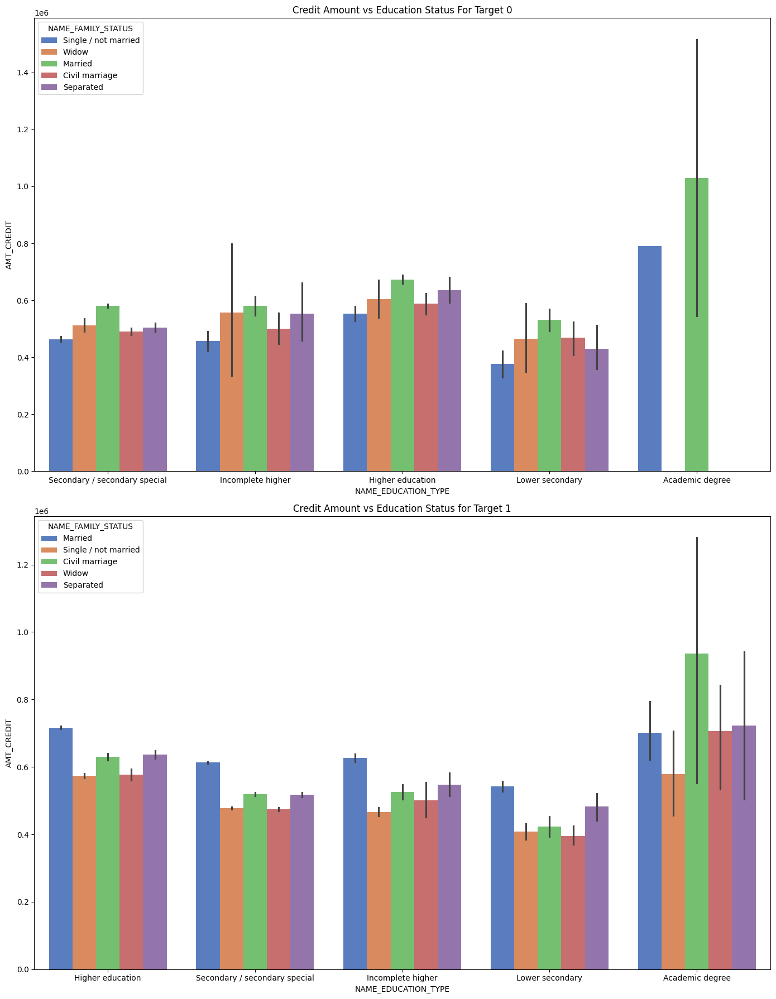

In [99]:
fig, axes = plt.subplots(2, 1, figsize=(14, 18))

sns.barplot(data=curr_true, x='NAME_EDUCATION_TYPE', y='AMT_CREDIT', hue='NAME_FAMILY_STATUS', ax=axes[0], palette="muted")
axes[0].set_title('Credit Amount vs Education Status For Target 0')

sns.barplot(data=curr_false, x='NAME_EDUCATION_TYPE', y='AMT_CREDIT', hue='NAME_FAMILY_STATUS', ax=axes[1], palette="muted")
axes[1].set_title('Credit Amount vs Education Status for Target 1')

plt.tight_layout()
plt.show()


**Inference:**

**For Target = 0 (Non-Defaulters):**
1. Customers with an academic degree, especially those in civil marriages, tend to have higher credit amounts.
2. Lower-educated customers generally have lower credit amounts, with widows having the lowest among them.
3. Married customers across most education segments, except lower secondary and academic degrees, tend to have higher credit amounts.

**For Target = 1 (Defaulters):**
1. Married customers with academic degrees generally have higher credit amounts, contributing to their higher default rates.
2. Across all education segments, married customers tend to have higher credit amounts.
3. Customers with lower education levels tend to have lower credit amounts.
4. Among academic degree holders, only single and married family types are present, indicating a lack of diversity in family status within this education group.

These points provide concise conclusions drawn from the graphs for both non-defaulters and defaulters, highlighting trends and patterns in credit amounts based on education level, family status, and default status.

## Finding the top 10 correlation between the columns 

In [100]:
numeric_curr = curr.select_dtypes(include=['number'])

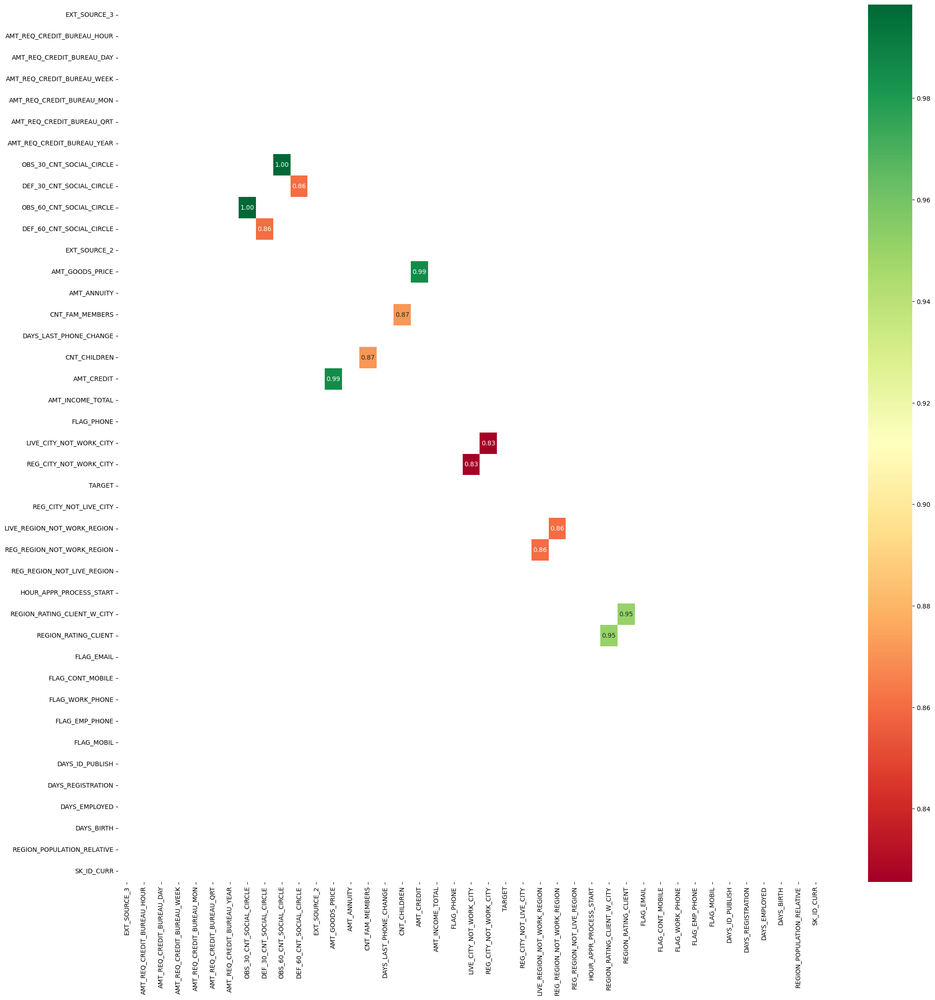

In [101]:
plt.figure(figsize=(25,25))
cor_=numeric_curr.corr()
sns.heatmap(data = cor_[(cor_>= 0.8) & (cor_ < 0.9999)], annot = True, cmap = "RdYlGn", cbar = True, fmt='.2f')
plt.show()

In [102]:
cor_[cor_ <= 0.99].unstack().sort_values(ascending = False).head(22)

AMT_CREDIT                   AMT_GOODS_PRICE                0.985619
AMT_GOODS_PRICE              AMT_CREDIT                     0.985619
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.950608
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.950608
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.871371
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.871371
DEF_30_CNT_SOCIAL_CIRCLE     DEF_60_CNT_SOCIAL_CIRCLE       0.860710
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.860710
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.860057
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.860057
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.825613
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY         0.825613
AMT_GOODS_PRICE              AMT_ANNUITY                    0.794249
AMT_ANNUITY                  AMT_GOODS_PRICE                0.794249
                             AMT_C

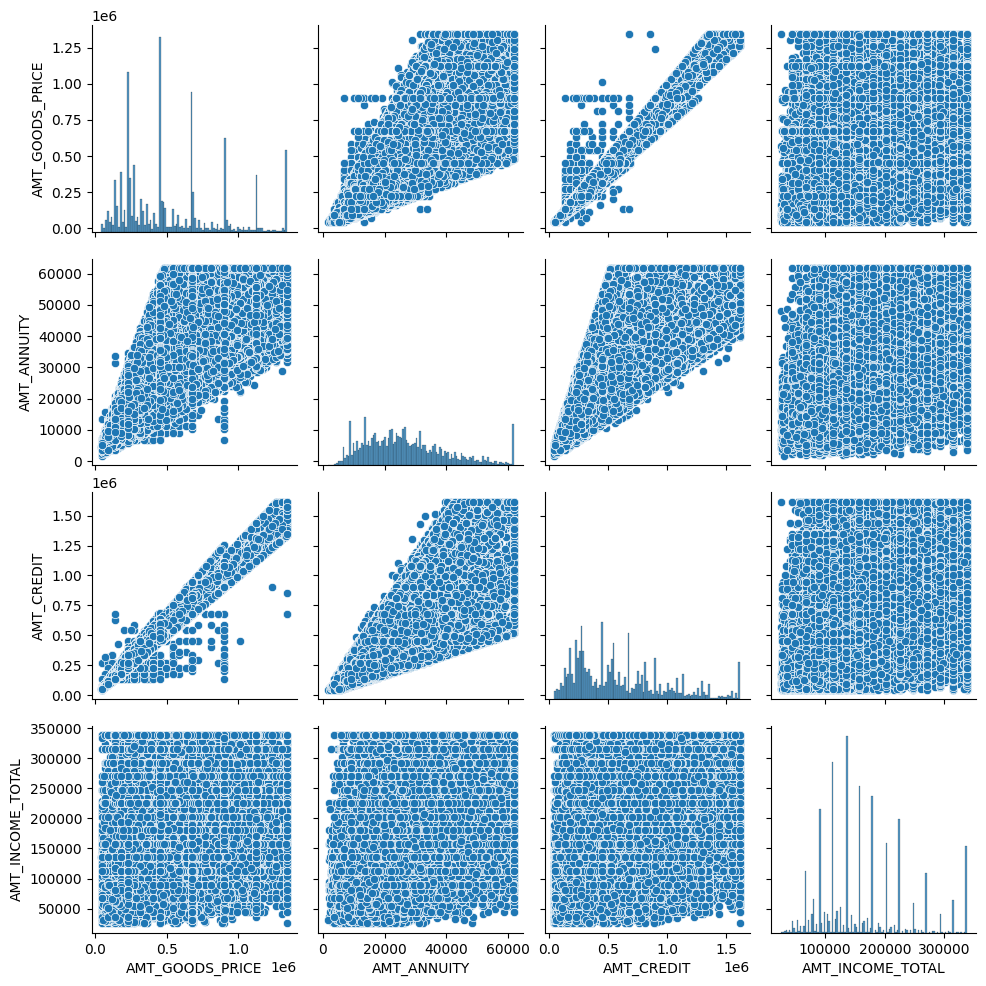

In [103]:
selected_columns = ['AMT_GOODS_PRICE', 'AMT_ANNUITY', 'AMT_CREDIT', 'AMT_INCOME_TOTAL']
sns.pairplot(curr[selected_columns])
plt.show()

**Inference:**
<br>Points to be concluded from the above pair plots

* - High Correlation Observed:
  - AMT_CREDIT (loan amount) and AMT_GOODS_PRICE (price of goods)
  - AMT_CREDIT (loan amount) and AMT_ANNUITY
  - AMT_GOODS_PRICE and AMT_ANNUITY

- Logical Relationship:
  - As the price of goods increases, the loan amount needed also increases.
  - As the amount of loan increases, the installment amount needed also increases.
  - As the price of goods increases, the installment amount needed also increases.

- Cause and Effect:
  - An increase in AMT_GOODS_PRICE causes an increase in AMT_CREDIT.
  - An increase in AMT_CREDIT causes an increase in AMT_ANNUITY.
  - An increase in AMT_GOODS_PRICE causes an increase in AMT_ANNUITY.


## <font color =green> Working with Previous application data sheet

In [104]:
prev=pd.read_csv('previous_application.csv')
prev.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [105]:
prev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

### <font color=blue> Checking Datatype Validation

In [106]:
prev.dtypes

SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

### <font color=red> Percentage calculation of null values in each column

In [107]:
prev.isnull().mean()*100

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_DOWN_PAYMENT               53.636480
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
RATE_DOWN_PAYMENT              53.636480
RATE_INTEREST_PRIMARY          99.643698
RATE_INTEREST_PRIVILEGED       99.643698
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYP

## <font color=red> Dropping the columns having percentage value >40

In [108]:
miss_per = prev.isnull().mean() * 100
col_drop = miss_per[miss_per<40].index
prev= prev[col_drop]

In [109]:
prev.isnull().mean() * 100

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYPE               0.000000
CHANNEL_TYPE                    0.000000
SELLERPLACE_AREA                0.000000
NAME_SELLER_INDUSTRY            0.000000
CNT_PAYMENT                    22.286366
NAME_YIELD_GROUP

#### Identifying Columns containing null values between 0 and 40 percentage

In [110]:
(prev.isnull().mean()*100)[((prev.isnull().mean()*100)>0)&((prev.isnull().mean()*100)<40)]

AMT_ANNUITY            22.286665
AMT_CREDIT              0.000060
AMT_GOODS_PRICE        23.081773
CNT_PAYMENT            22.286366
PRODUCT_COMBINATION     0.020716
dtype: float64

* The NULL VALUE percentage in the columns AMT_ANNUITY, AMT_GOODS_PRICE, and CNT_PAYMENT is notably high, around 22%, while in the PRODUCT_COMBINATION column, it's very small. Dropping those rows will not significantly impact the output.

In [111]:
prev = prev.dropna(subset=['PRODUCT_COMBINATION'])

## Numerical columns

In [112]:
prev.select_dtypes(include=["int64","float64"]).columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_CREDIT', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START',
       'NFLAG_LAST_APPL_IN_DAY', 'DAYS_DECISION', 'SELLERPLACE_AREA',
       'CNT_PAYMENT'],
      dtype='object')

## Categorical columns

In [113]:
prev.select_dtypes(include = "object").columns

Index(['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO',
       'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY',
       'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

#### Handeling Invalid values

In [114]:
prev['NAME_CASH_LOAN_PURPOSE'].value_counts(normalize='True')*100

NAME_CASH_LOAN_PURPOSE
XAP                                 55.232809
XNA                                 40.597101
Repairs                              1.423166
Other                                0.934685
Urgent needs                         0.503752
Buying a used car                    0.172948
Building a house or an annex         0.161270
Everyday expenses                    0.144682
Medicine                             0.130190
Payments on other loans              0.115638
Education                            0.094199
Journey                              0.074197
Purchase of electronic equipment     0.063538
Buying a new car                     0.060604
Wedding / gift / holiday             0.057609
Buying a home                        0.051801
Car repairs                          0.047728
Furniture                            0.044854
Buying a holiday home / land         0.031919
Business development                 0.025511
Gasification / water supply          0.017965
Buying a ga

 * The XAP and XNA values comprise approximately 97% of the data, but no specific instructions have been provided regarding them, so they will not be altered.

### Handling Invalid Columns

In [115]:
prev['DAYS_DECISION'].value_counts()

DAYS_DECISION
-245     2444
-238     2390
-210     2375
-273     2349
-196     2315
         ... 
-2882     163
-2922     162
-2921     158
-2902     148
-1          2
Name: count, Length: 2922, dtype: int64

In [116]:
prev['DAYS_DECISION']=((prev['DAYS_DECISION']/365).abs()).astype('int32')

In [117]:
prev['DAYS_DECISION'].value_counts()

DAYS_DECISION
0    571757
1    385896
2    215049
3    131856
4    102426
6     97044
7     84341
5     81011
8       488
Name: count, dtype: int64

In [118]:
prev.nunique()

SK_ID_PREV                     1669868
SK_ID_CURR                      338857
NAME_CONTRACT_TYPE                   3
AMT_ANNUITY                     357959
AMT_APPLICATION                  93885
AMT_CREDIT                       86803
AMT_GOODS_PRICE                  93885
WEEKDAY_APPR_PROCESS_START           7
HOUR_APPR_PROCESS_START             24
FLAG_LAST_APPL_PER_CONTRACT          2
NFLAG_LAST_APPL_IN_DAY               2
NAME_CASH_LOAN_PURPOSE              25
NAME_CONTRACT_STATUS                 4
DAYS_DECISION                        9
NAME_PAYMENT_TYPE                    4
CODE_REJECT_REASON                   9
NAME_CLIENT_TYPE                     4
NAME_GOODS_CATEGORY                 28
NAME_PORTFOLIO                       5
NAME_PRODUCT_TYPE                    3
CHANNEL_TYPE                         8
SELLERPLACE_AREA                  2097
NAME_SELLER_INDUSTRY                11
CNT_PAYMENT                         49
NAME_YIELD_GROUP                     5
PRODUCT_COMBINATION      

## <font color =red>Handling the Outliers

#### AMT_ANNUITY

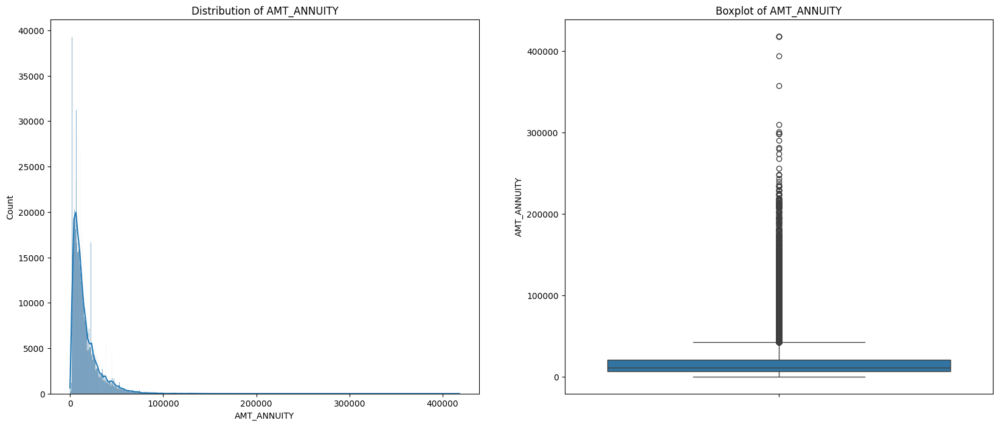

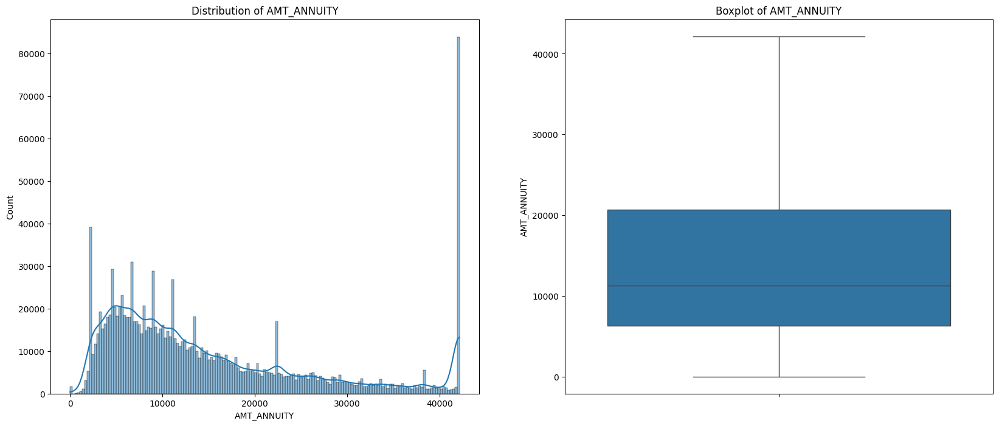

In [119]:
func_boxplot(prev,'AMT_ANNUITY')
prev = iqr(prev, 'AMT_ANNUITY')
func_boxplot(prev,'AMT_ANNUITY')

### AMT_APPLICATION

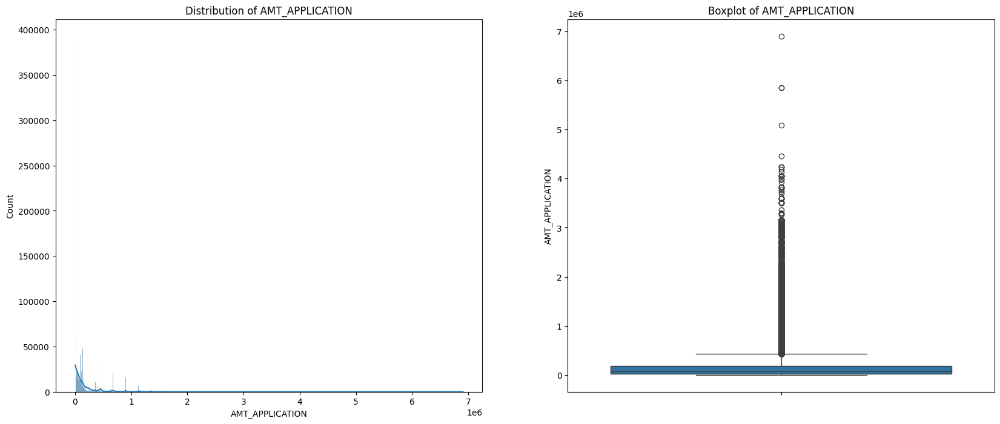

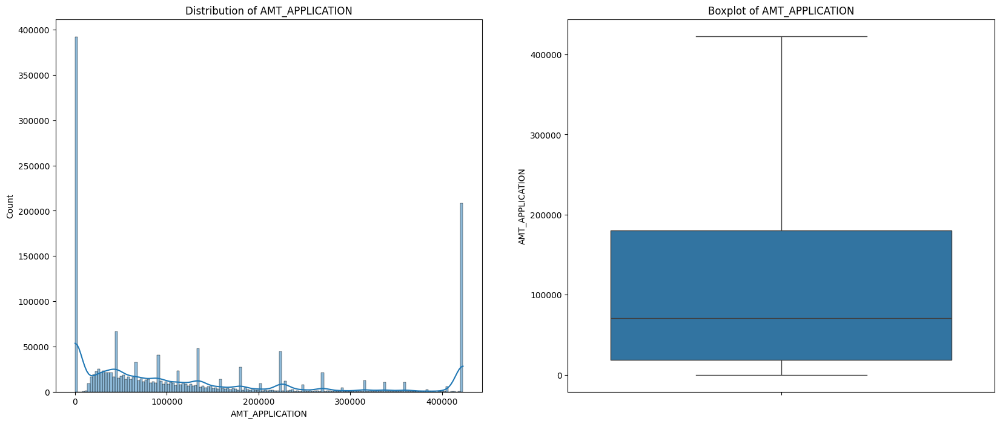

In [120]:
func_boxplot(prev,'AMT_APPLICATION')
prev = iqr(prev, 'AMT_APPLICATION')
func_boxplot(prev,'AMT_APPLICATION')

### AMT_CREDIT

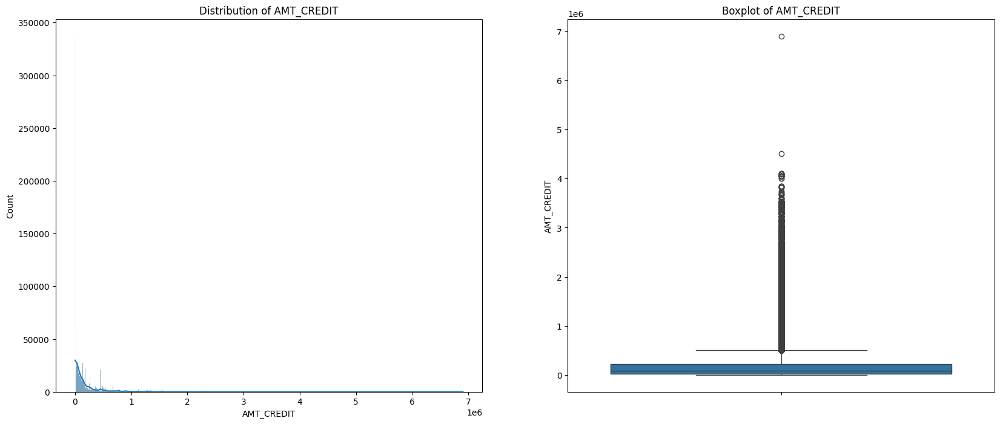

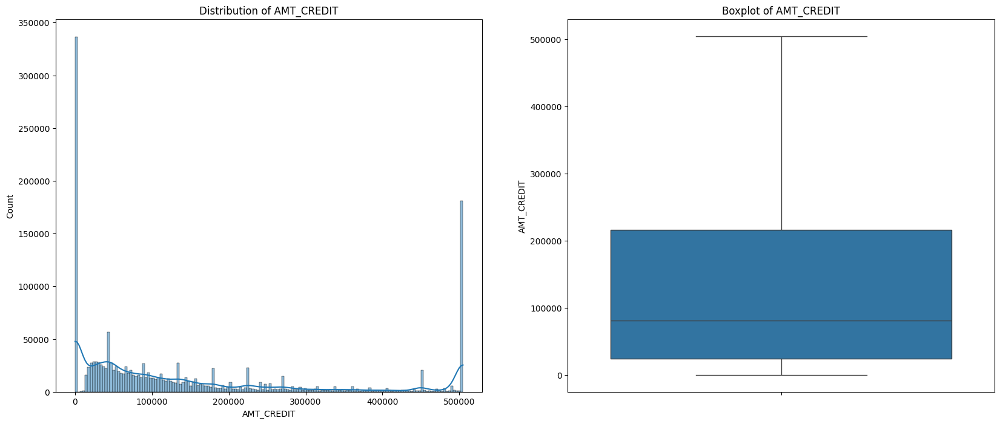

In [121]:
func_boxplot(prev,'AMT_CREDIT')
prev = iqr(prev, 'AMT_CREDIT')
func_boxplot(prev,'AMT_CREDIT')

### AMT_GOODS_PRICE

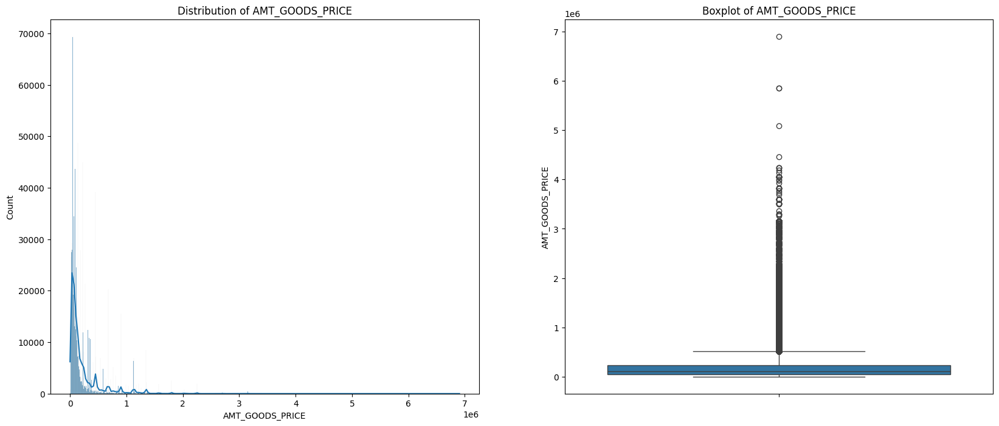

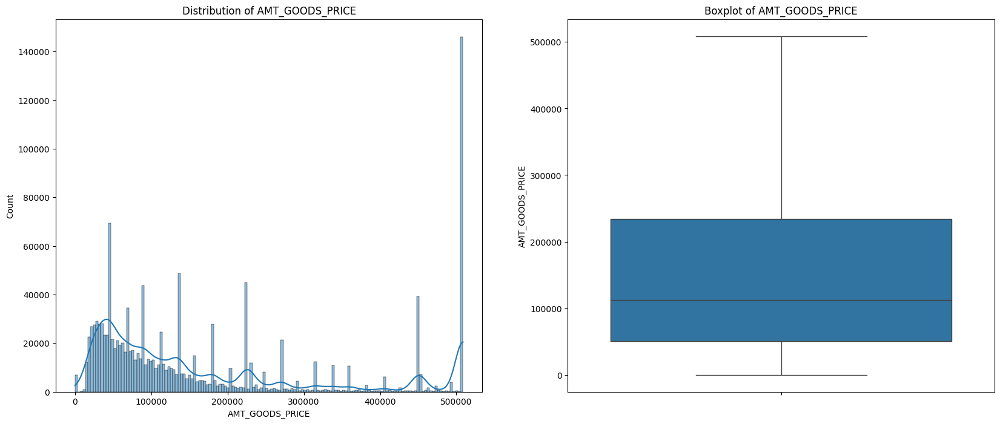

In [122]:
func_boxplot(prev,'AMT_GOODS_PRICE')
prev = iqr(prev, 'AMT_GOODS_PRICE')
func_boxplot(prev,'AMT_GOODS_PRICE')

## CNT_PAYMENT

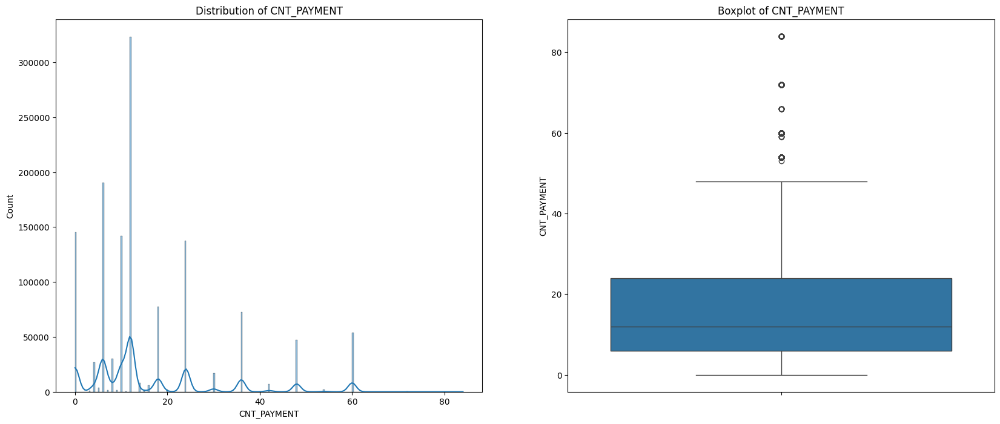

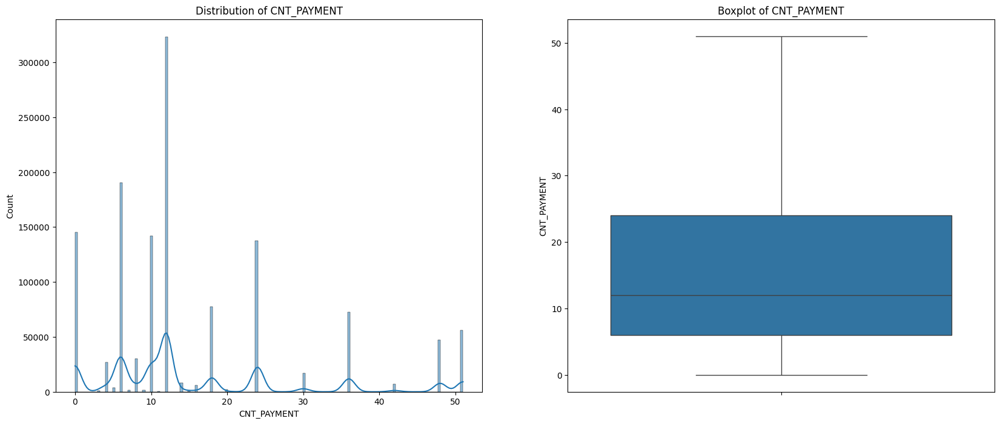

In [123]:
func_boxplot(prev,'CNT_PAYMENT')
prev = iqr(prev, 'CNT_PAYMENT')
func_boxplot(prev,'CNT_PAYMENT')

# <font color= red> Binning Continuous Numeric Column

## AMT_CREDIT

In [124]:
prev['AMT_CREDIT'].max()

504758.25

In [125]:
prev['AMT_CREDIT'].min()

0.0

In [126]:
prev['CREDIT_GROUP']= pd.cut(prev.AMT_CREDIT,bins=[0,100000,200000,300000,400000,500000,600000])

prev['CREDIT_GROUP'].value_counts(normalize=True)

CREDIT_GROUP
(0, 100000]         0.449968
(100000, 200000]    0.221272
(500000, 600000]    0.136279
(200000, 300000]    0.103233
(400000, 500000]    0.046226
(300000, 400000]    0.043023
Name: proportion, dtype: float64

## AMT_GOODS_PRICE

In [127]:
prev['AMT_GOODS_PRICE'].max()

508738.5

In [128]:
prev['AMT_GOODS_PRICE'].min()

0.0

In [129]:
prev['GOODS_GROUP']= pd.cut(prev.AMT_GOODS_PRICE,bins=[0,100000,200000,300000,400000,500000,600000])

prev['GOODS_GROUP'].value_counts(normalize=True)*100

GOODS_GROUP
(0, 100000]         46.615043
(100000, 200000]    22.066863
(500000, 600000]    11.452149
(200000, 300000]    10.375872
(400000, 500000]     5.484376
(300000, 400000]     4.005697
Name: proportion, dtype: float64

## AMT_ANNUITY

In [130]:
prev['AMT_ANNUITY'].max()

42163.38

In [131]:
prev['AMT_ANNUITY'].min()

0.0

In [132]:
prev['ANNUITY_GROUP']= pd.cut(prev.AMT_ANNUITY,bins=[0,10000,20000,30000,40000,50000])

prev['ANNUITY_GROUP'].value_counts(normalize=True)*100

ANNUITY_GROUP
(0, 10000]        44.438659
(10000, 20000]    29.400575
(20000, 30000]    13.087210
(40000, 50000]     7.178275
(30000, 40000]     5.895281
Name: proportion, dtype: float64

## CNT_PAYMENT

In [133]:
prev['CNT_PAYMENT'].max()

51.0

In [134]:
prev['CNT_PAYMENT'].min()

0.0

In [135]:
prev['PAYMENT_GROUP']= pd.cut(prev.CNT_PAYMENT,bins=[0,10,20,30,40,50,60])

prev['PAYMENT_GROUP'].value_counts(normalize=True)*100

PAYMENT_GROUP
(10, 20]    36.246779
(0, 10]     34.459006
(20, 30]    13.424470
(30, 40]     6.297490
(50, 60]     4.848486
(40, 50]     4.723768
Name: proportion, dtype: float64

## AMT_APPLICATION

In [136]:
prev['AMT_APPLICATION'].max()

422907.75

In [137]:
prev['AMT_APPLICATION'].min()

0.0

In [138]:
prev['APPLICATION_GROUP']= pd.cut(prev.AMT_APPLICATION,bins=[0,100000,200000,300000,400000,500000])

prev['APPLICATION_GROUP'].value_counts(normalize=True)*100

APPLICATION_GROUP
(0, 100000]         46.616012
(100000, 200000]    22.068818
(400000, 500000]    16.931520
(200000, 300000]    10.377505
(300000, 400000]     4.006145
Name: proportion, dtype: float64

In [139]:
# Analysing values of object variable
for i in prev.columns:
    if prev[i].dtypes=="object":
        print(prev[i].value_counts(normalize=True, dropna= False))
        print('\n\n')

NAME_CONTRACT_TYPE
Cash loans         0.447672
Consumer loans     0.436652
Revolving loans    0.115676
Name: proportion, dtype: float64



WEEKDAY_APPR_PROCESS_START
TUESDAY      0.152743
WEDNESDAY    0.152681
MONDAY       0.151815
FRIDAY       0.150902
THURSDAY     0.149141
SATURDAY     0.144074
SUNDAY       0.098646
Name: proportion, dtype: float64



FLAG_LAST_APPL_PER_CONTRACT
Y    0.994925
N    0.005075
Name: proportion, dtype: float64



NAME_CASH_LOAN_PURPOSE
XAP                                 0.552328
XNA                                 0.405971
Repairs                             0.014232
Other                               0.009347
Urgent needs                        0.005038
Buying a used car                   0.001729
Building a house or an annex        0.001613
Everyday expenses                   0.001447
Medicine                            0.001302
Payments on other loans             0.001156
Education                           0.000942
Journey                           

# <font color =red> Univariate Analysis

NAME_CONTRACT_TYPE
Cash loans         44.77
Consumer loans     43.67
Revolving loans    11.57
Name: proportion, dtype: float64


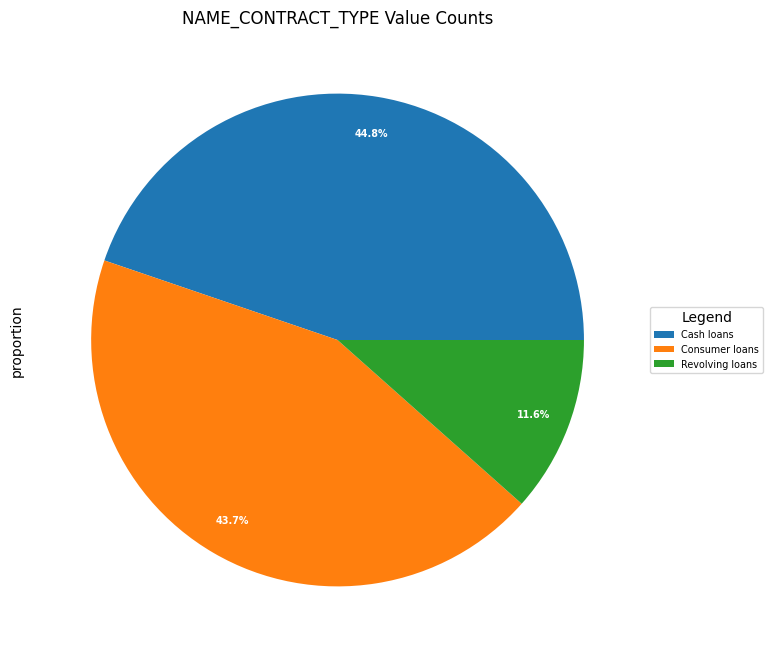

WEEKDAY_APPR_PROCESS_START
TUESDAY      15.27
WEDNESDAY    15.27
MONDAY       15.18
FRIDAY       15.09
THURSDAY     14.91
SATURDAY     14.41
SUNDAY        9.86
Name: proportion, dtype: float64


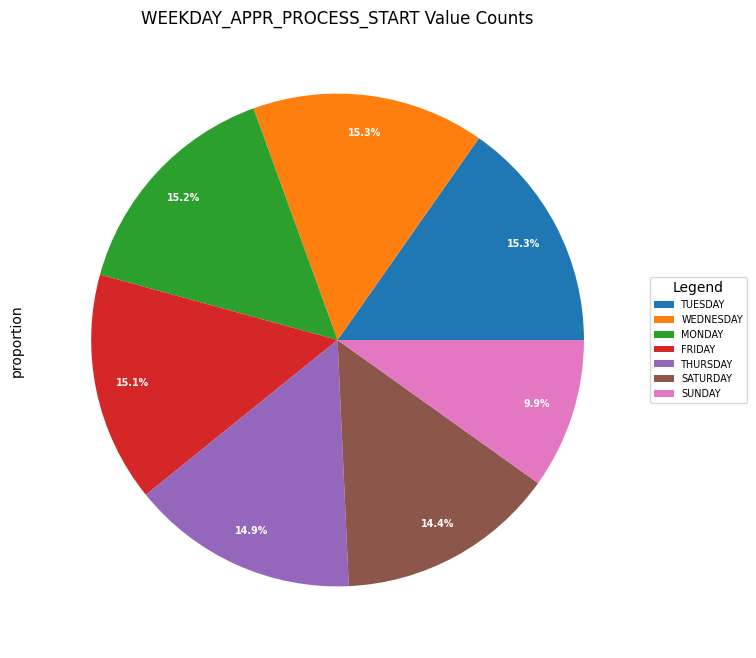

FLAG_LAST_APPL_PER_CONTRACT
Y    99.49
N     0.51
Name: proportion, dtype: float64


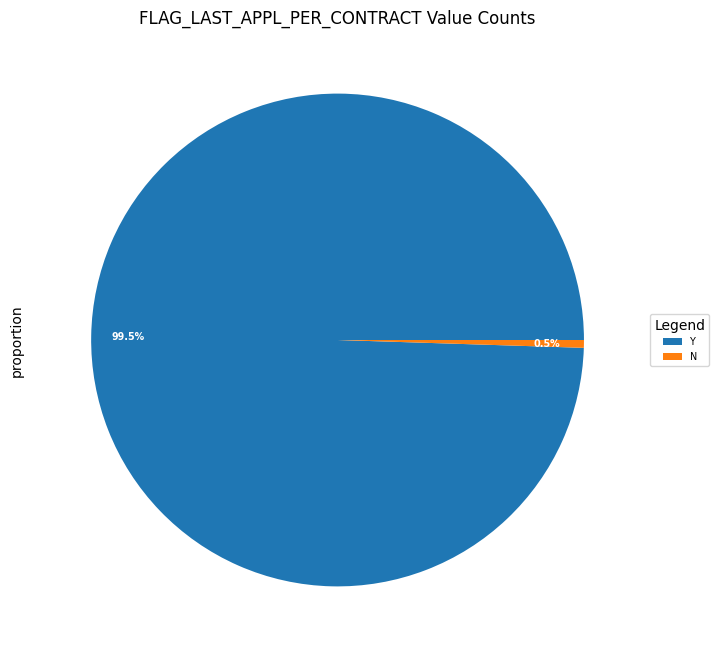

NAME_CASH_LOAN_PURPOSE
XAP                                 55.23
XNA                                 40.60
Repairs                              1.42
Other                                0.93
Urgent needs                         0.50
Buying a used car                    0.17
Building a house or an annex         0.16
Everyday expenses                    0.14
Medicine                             0.13
Payments on other loans              0.12
Education                            0.09
Journey                              0.07
Purchase of electronic equipment     0.06
Buying a new car                     0.06
Wedding / gift / holiday             0.06
Buying a home                        0.05
Car repairs                          0.05
Furniture                            0.04
Buying a holiday home / land         0.03
Business development                 0.03
Gasification / water supply          0.02
Buying a garage                      0.01
Hobby                                0.00
Money for a

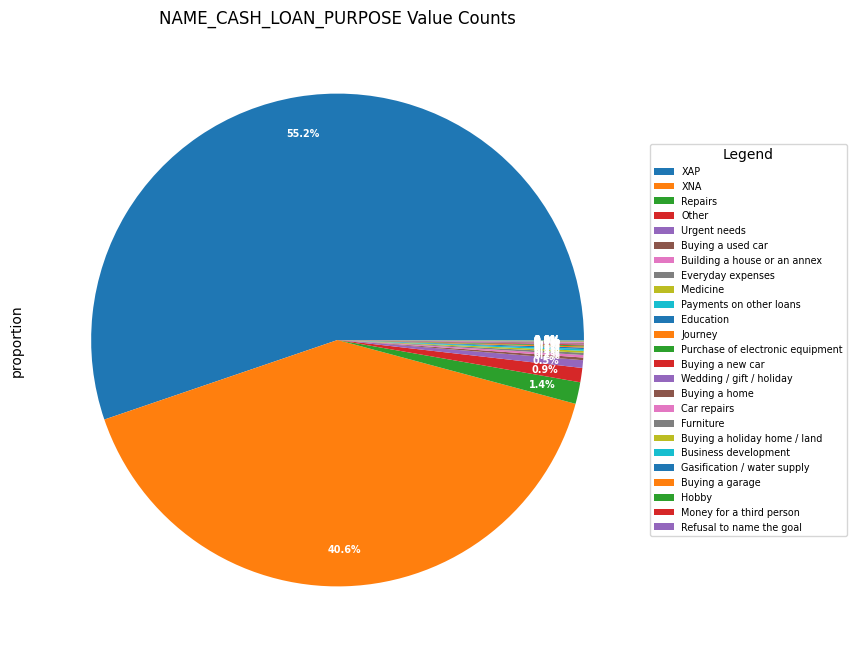

NAME_CONTRACT_STATUS
Approved        62.09
Canceled        18.92
Refused         17.41
Unused offer     1.58
Name: proportion, dtype: float64


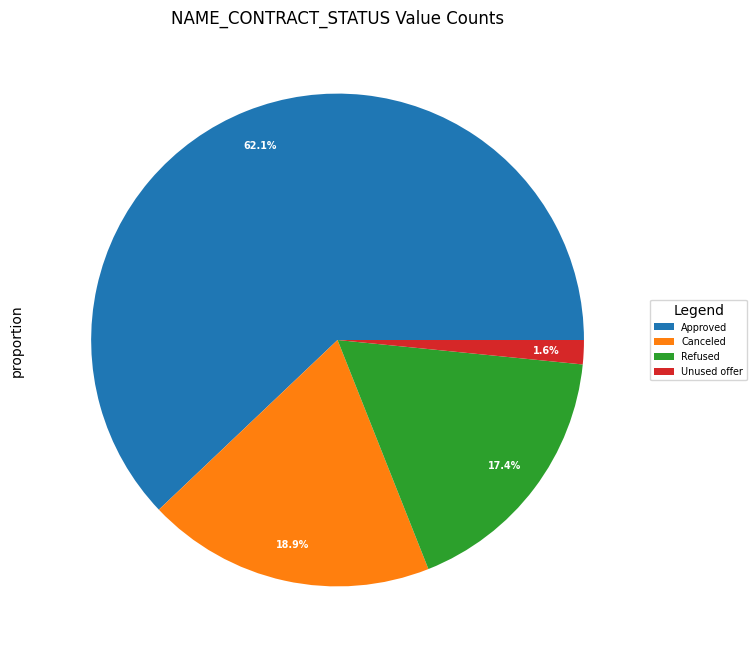

NAME_PAYMENT_TYPE
Cash through the bank                        61.89
XNA                                          37.55
Non-cash from your account                    0.49
Cashless from the account of the employer     0.06
Name: proportion, dtype: float64


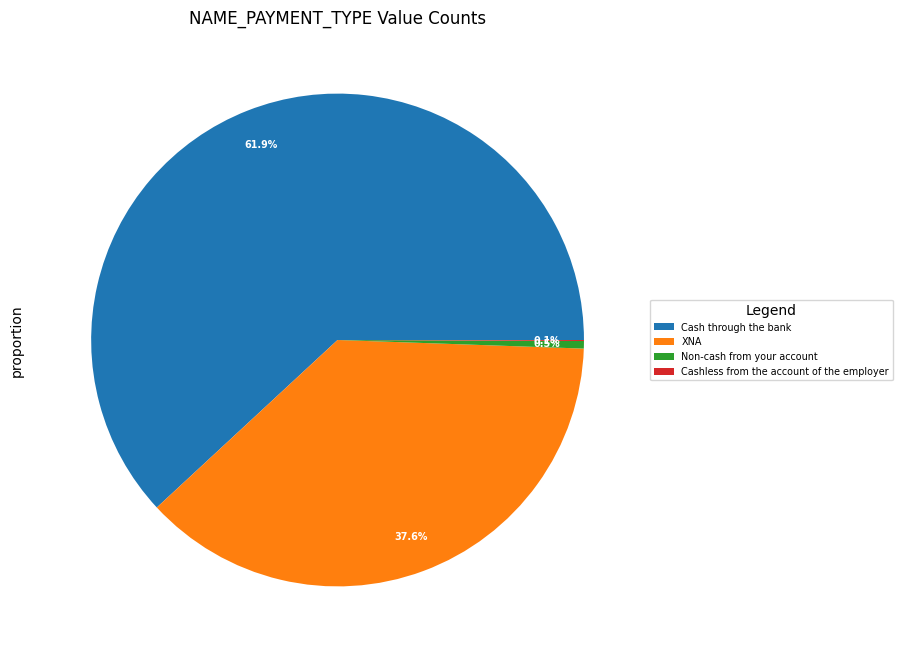

CODE_REJECT_REASON
XAP       81.01
HC        10.49
LIMIT      3.33
SCO        2.24
CLIENT     1.58
SCOFR      0.77
XNA        0.31
VERIF      0.21
SYSTEM     0.04
Name: proportion, dtype: float64


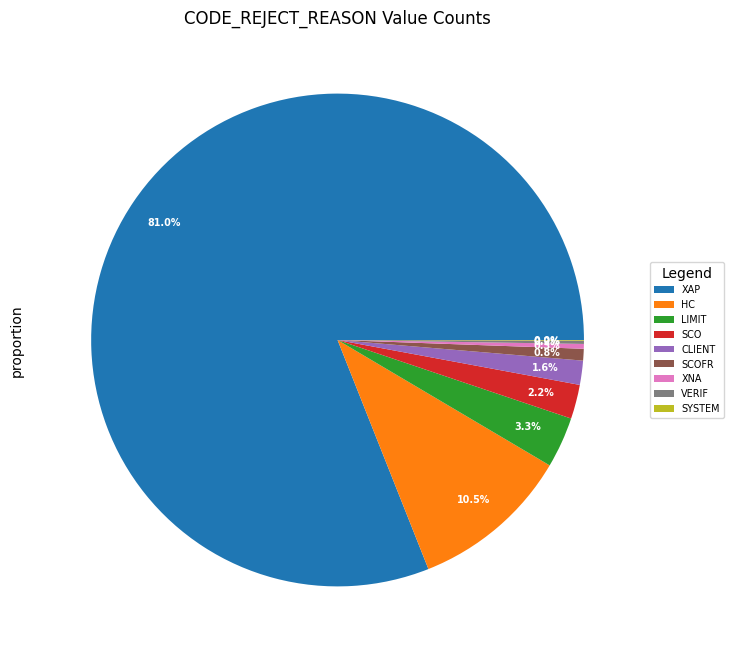

NAME_CLIENT_TYPE
Repeater     73.72
New          18.05
Refreshed     8.12
XNA           0.12
Name: proportion, dtype: float64


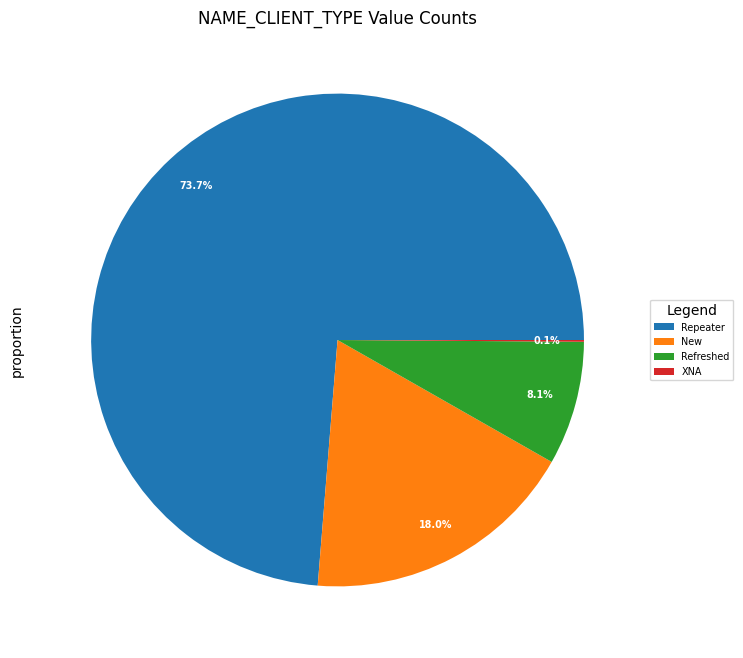

NAME_GOODS_CATEGORY
XNA                         56.92
Mobile                      13.46
Consumer Electronics         7.28
Computers                    6.33
Audio/Video                  5.96
Furniture                    3.21
Photo / Cinema Equipment     1.50
Construction Materials       1.50
Clothing and Accessories     1.41
Auto Accessories             0.44
Jewelry                      0.38
Homewares                    0.30
Medical Supplies             0.23
Vehicles                     0.20
Sport and Leisure            0.18
Gardening                    0.16
Other                        0.15
Office Appliances            0.14
Tourism                      0.10
Medicine                     0.09
Direct Sales                 0.03
Fitness                      0.01
Additional Service           0.01
Education                    0.01
Weapon                       0.00
Insurance                    0.00
Animals                      0.00
House Construction           0.00
Name: proportion, dtype: flo

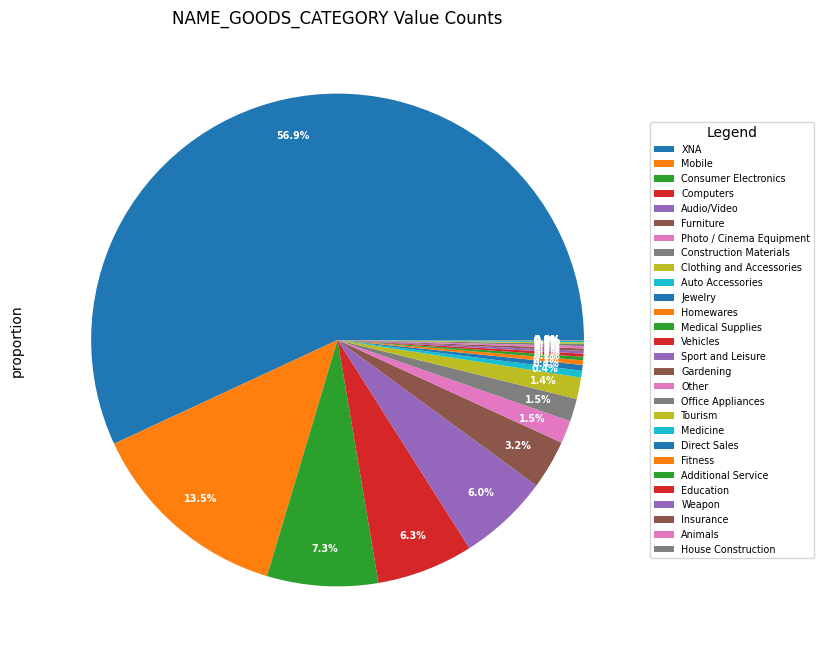

NAME_PORTFOLIO
POS      41.38
Cash     27.64
XNA      22.27
Cards     8.68
Cars      0.03
Name: proportion, dtype: float64


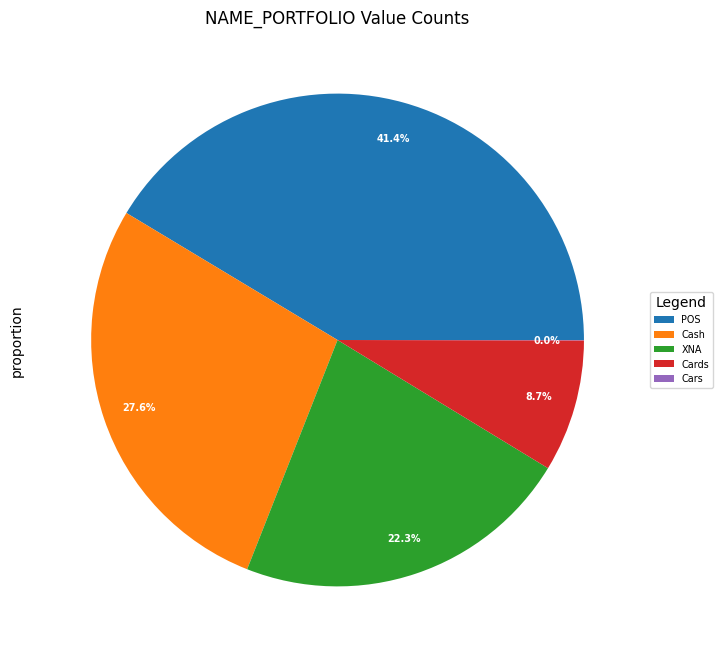

NAME_PRODUCT_TYPE
XNA        63.68
x-sell     27.32
walk-in     9.00
Name: proportion, dtype: float64


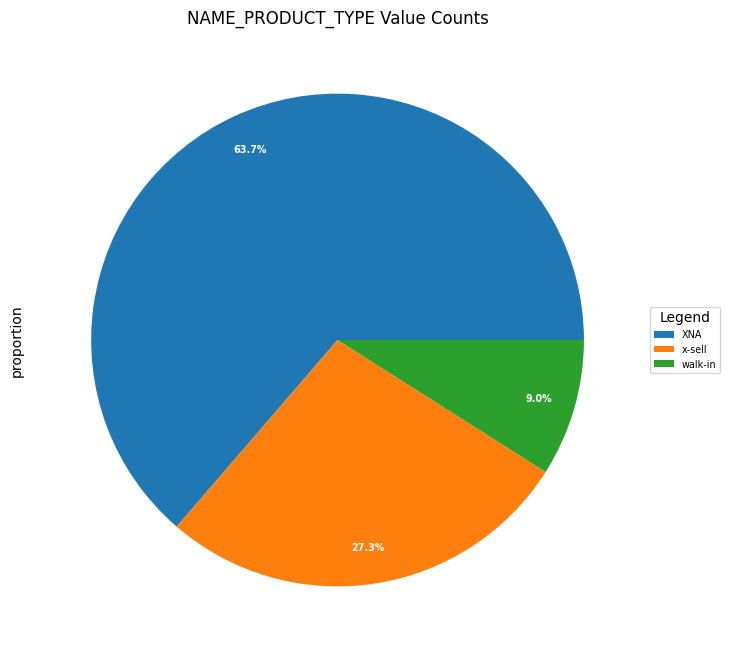

CHANNEL_TYPE
Credit and cash offices       43.12
Country-wide                  29.60
Stone                         12.70
Regional / Local               6.50
Contact center                 4.27
AP+ (Cash loan)                3.42
Channel of corporate sales     0.37
Car dealer                     0.03
Name: proportion, dtype: float64


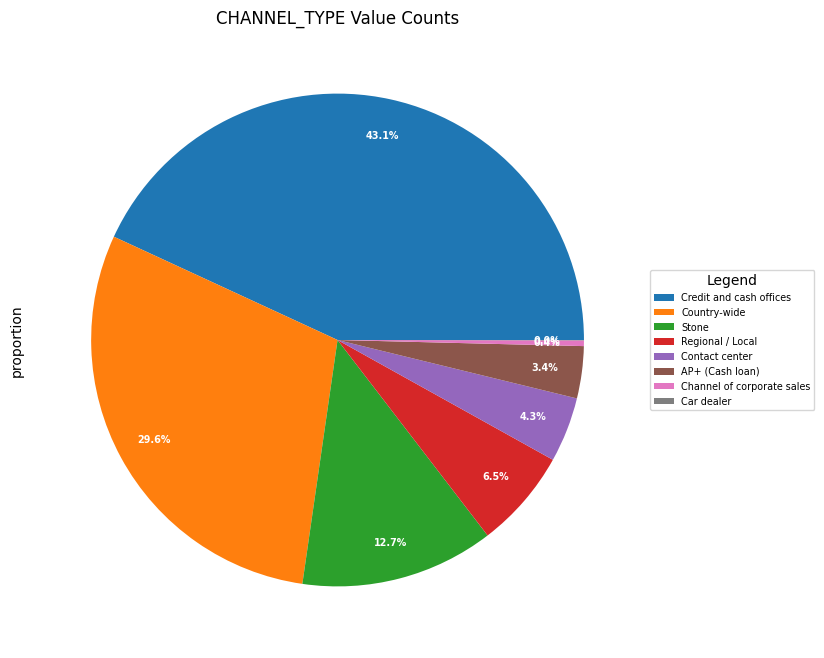

NAME_SELLER_INDUSTRY
XNA                     51.24
Consumer electronics    23.85
Connectivity            16.51
Furniture                3.46
Construction             1.78
Clothing                 1.43
Industry                 1.15
Auto technology          0.30
Jewelry                  0.16
MLM partners             0.07
Tourism                  0.03
Name: proportion, dtype: float64


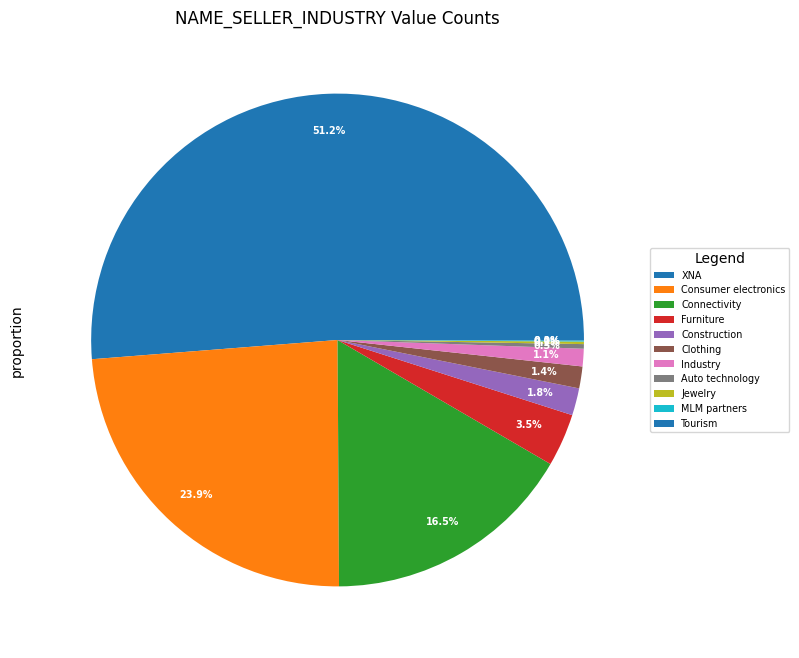

NAME_YIELD_GROUP
XNA           30.95
middle        23.09
high          21.16
low_normal    19.29
low_action     5.51
Name: proportion, dtype: float64


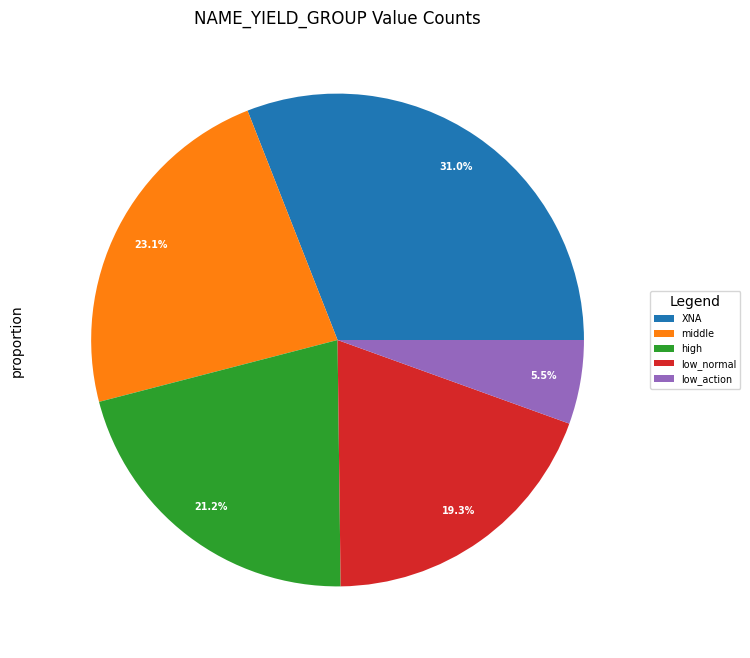

PRODUCT_COMBINATION
Cash                              17.13
POS household with interest       15.79
POS mobile with interest          13.21
Cash X-Sell: middle                8.62
Cash X-Sell: low                   7.80
Card Street                        6.74
POS industry with interest         5.92
POS household without interest     4.96
Card X-Sell                        4.83
Cash Street: high                  3.57
Cash X-Sell: high                  3.55
Cash Street: middle                2.08
Cash Street: low                   2.03
POS mobile without interest        1.44
POS other with interest            1.43
POS industry without interest      0.75
POS others without interest        0.15
Name: proportion, dtype: float64


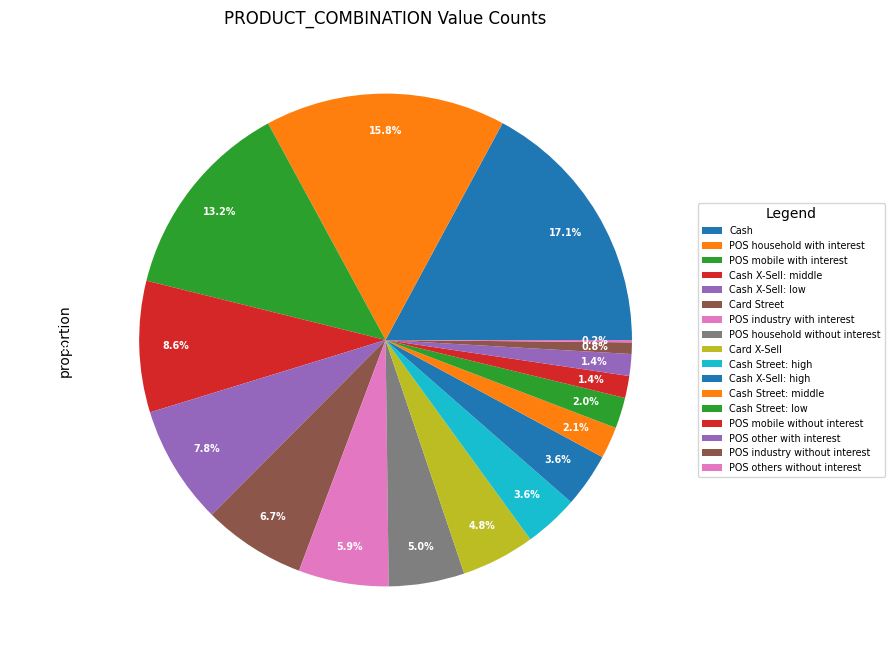

In [140]:
object_columns = prev.select_dtypes(include='object').columns
num_rows = len(object_columns)

for idx, col in enumerate(object_columns):
    value_counts_percentage = (prev[col].value_counts(normalize=True, dropna=False) * 100).round(2)
    print(value_counts_percentage)

    plt.figure(figsize=[8,8])
    pie = prev[col].value_counts(normalize=True, dropna=False).plot.pie(labeldistance=1.1, autopct='%1.1f%%', pctdistance=0.85)
    plt.title(f'{col} Value Counts')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='x-small')
    pie.legend(value_counts_percentage.index, title="Legend", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1), fontsize='x-small')

    for text in pie.texts:
        text.set_fontsize('x-small')
        text.set_color('white')
        text.set_weight('bold')

    plt.show()


**Inference**

1. **Loan Types**: The DataFrame includes a new loan type called Consumer Loan, which was not present in the Application DataFrame. Consumer loans account for 55% of all loans, while 37% are cash loans, and the remaining are revolving loans.

2. **Imbalance in Loan Status**: There is a significant class imbalance in the loan status. Approved loans constitute 79% of the data, while the rest are either refused, cancelled, or unused.

3. **Client Type Distribution**: Around 67% of the applicants are repeaters. Additionally, the `NAME_CLIENT_TYPE` column contains some null values represented as 'XNA'.

4. **Loan Purpose**: 55% of the applicants have taken loans for POS (Point of Sale) purchases.

5. **Seller Industry**: The `NAME_SELLER_INDUSTRY` column has 37% 'XNA' values, indicating missing or unspecified data. Among the specified categories, the Consumer Electronics industry is the next highest at 30%.



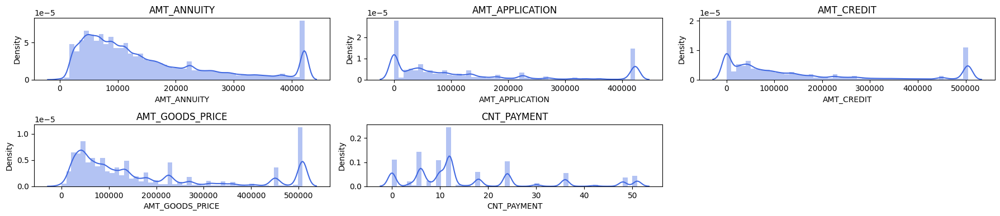

In [141]:
num_rows = 8 
num_cols = 3  
plot_counter = 1  

plt.figure(figsize=(18, 15))

for col in prev.columns:
    if prev[col].dtypes == "float64" or prev[col].dtypes == "float32":
        plt.subplot(num_rows, num_cols, plot_counter)
        plt.title(col)
        plt.xlabel(col)
        sns.distplot(a=prev[col], color='royalblue')
        plot_counter += 1

plt.tight_layout()
plt.show()


**Inference**


High Percentage of Outliers in Continuous Variables: Both box plots and distribution plots indicate a high percentage of outliers in continuous variables. This suggests that there are extreme values in these variables that deviate significantly from the majority of the data points.

# <font color=red> Bivariate Analysis

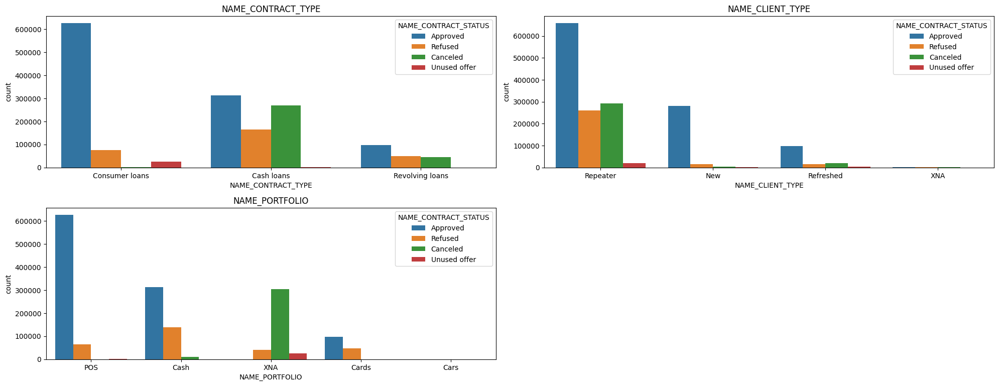

In [142]:
cols=['NAME_CONTRACT_TYPE','NAME_CLIENT_TYPE','NAME_PORTFOLIO']
num_rows = 4  # number of rows
num_cols = 2  # number of columns
plot_counter = 1  # initialize plot counter

plt.figure(figsize=(20, 15))

for col in cols:
    plt.subplot(num_rows, num_cols, plot_counter)
    plt.title(col)
    plt.xlabel(col)
    sns.countplot(x=col, data=prev, hue='NAME_CONTRACT_STATUS')
    plot_counter += 1

plt.tight_layout()
plt.show()


**Inference**

1. **Prevalence of Consumer Loans in Approved Category**: The largest number of applicants in the approved category are for consumer loans.
   
2. **Absence of Cancelled Cash Loans**: There are no cancelled loans in the cash loan category compared to consumer loans.
   
3. **Refusal Rate for Cash Loans**: More cash loans have been refused compared to consumer loans.
   
4. **Repeat Applicants Across Categories**: The bank has a higher number of repeat applicants in all categories—approved, refused, unused, and cancelled.

5. **POS Transactions and Refusal Rate**: POS transactions appear to be associated with consumer loans. Similar to the second point, more cash loans have been refused than POS transactions.


### <font color=red>Multivariate Analysis


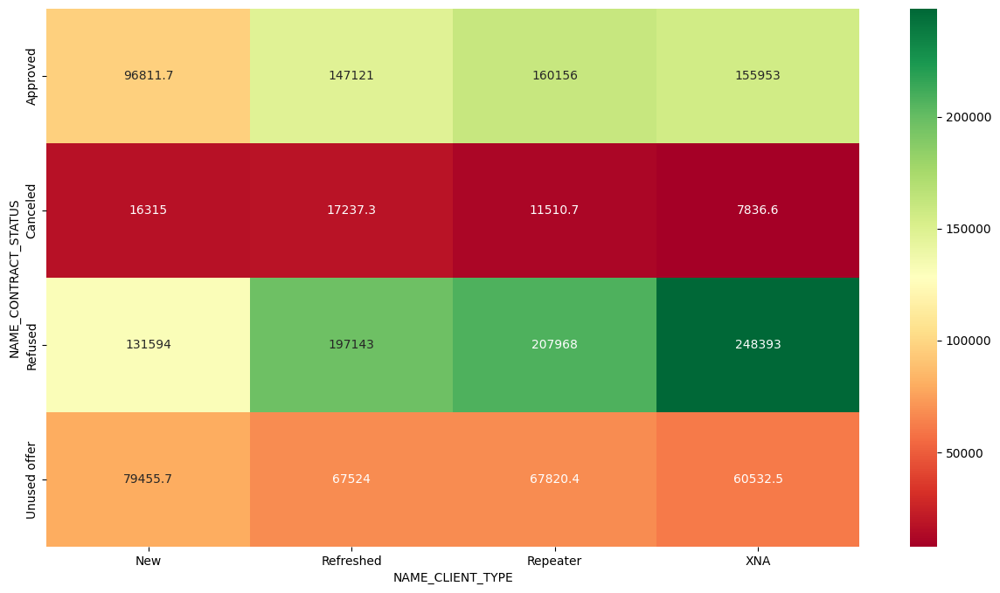

In [143]:
result = pd.pivot_table(data=prev, index="NAME_CONTRACT_STATUS", columns='NAME_CLIENT_TYPE', values='AMT_APPLICATION')
plt.figure(figsize=(15, 8))
sns.heatmap(result, annot=True, cmap='RdYlGn', fmt="g")
plt.show()


**Inference**

1. **Low Application Amount for Unused Offers**: The application amount for unused offers is observed to be low. This could indicate that the offered amount is not attractive enough for customers to utilize.

2. **High Application Amount for Cancelled Cases**: Cancelled cases show a high application amount. This may suggest that the bank is refusing these applications, possibly due to concerns about the consumer's debt liability ratio. The high amount could increase the credit default risk.

3. **Higher Application Amount for Repeaters**: Repeaters have a higher application amount compared to new customers. This might indicate that the bank offers more favorable policies or interest rates for repeat applicants, encouraging them to apply for higher amounts.

These points provide insights into patterns and trends within the dataset related to application amounts and contract statuses.

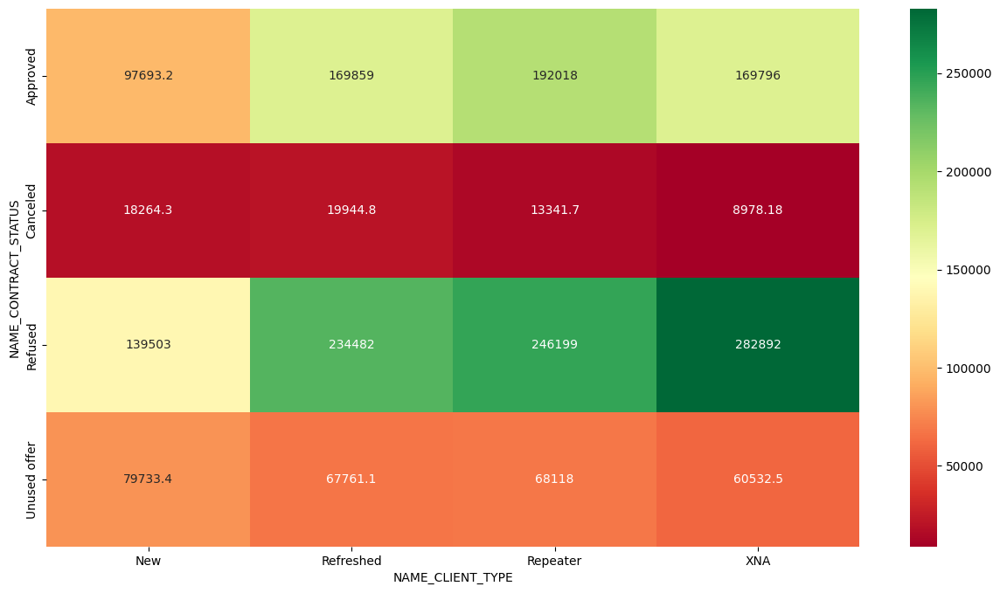

In [144]:
result = pd.pivot_table(data=prev, index="NAME_CONTRACT_STATUS", columns='NAME_CLIENT_TYPE', values='AMT_CREDIT')
plt.figure(figsize=(15, 8))
sns.heatmap(result, annot=True, cmap='RdYlGn', fmt="g")
plt.show()


**inference**

1. **Low Credit Amount for Unused Offers**: It's notable that the credit amount for unused offers is low. This observation suggests a potential reason for customers not utilizing these offers—perhaps the offered credit amount is insufficient or unattractive to them.

2. **Questionable Credit Amount for Cancelled and Refused Cases**: There's confusion regarding why there should be any credit amount associated with cancelled and refused cases. Typically, these cases involve the rejection or cancellation of a loan application, so it's unexpected to see any credit amount associated with them.

These points highlight potential areas for further investigation or consideration within the dataset.

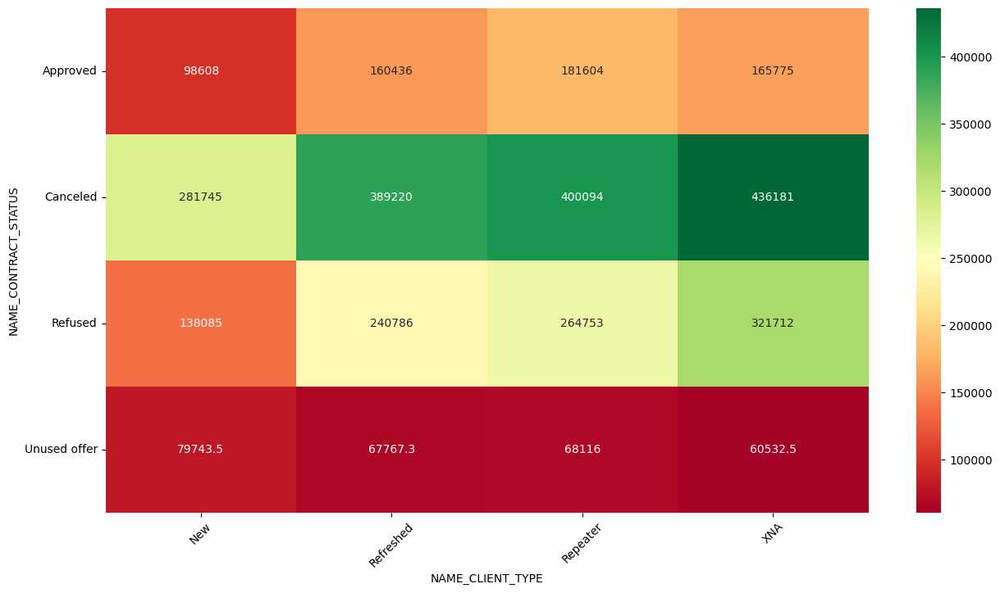

In [145]:

result = pd.pivot_table(data=prev, index="NAME_CONTRACT_STATUS", columns='NAME_CLIENT_TYPE', values='AMT_GOODS_PRICE')
plt.figure(figsize=(15, 8))
sns.heatmap(result, annot=True, cmap='RdYlGn', fmt="g")
plt.yticks(rotation=0)  # Rotate y-axis labels to horizontal
plt.xticks(rotation=45)  # Rotate x-axis labels to 45 degrees
plt.show()


**inference**

1. **Higher Value Goods in Cancelled and Refused Cases**: It's notable that all cancelled and refused cases have a higher value of goods compared to other categories.

This summary highlights a specific trend observed in the data where cancelled and refused cases consistently exhibit higher values for goods compared to other categories.

**Analysing columns having highest correlation**

In [146]:
numeric_prev = prev.select_dtypes(include=['number'])

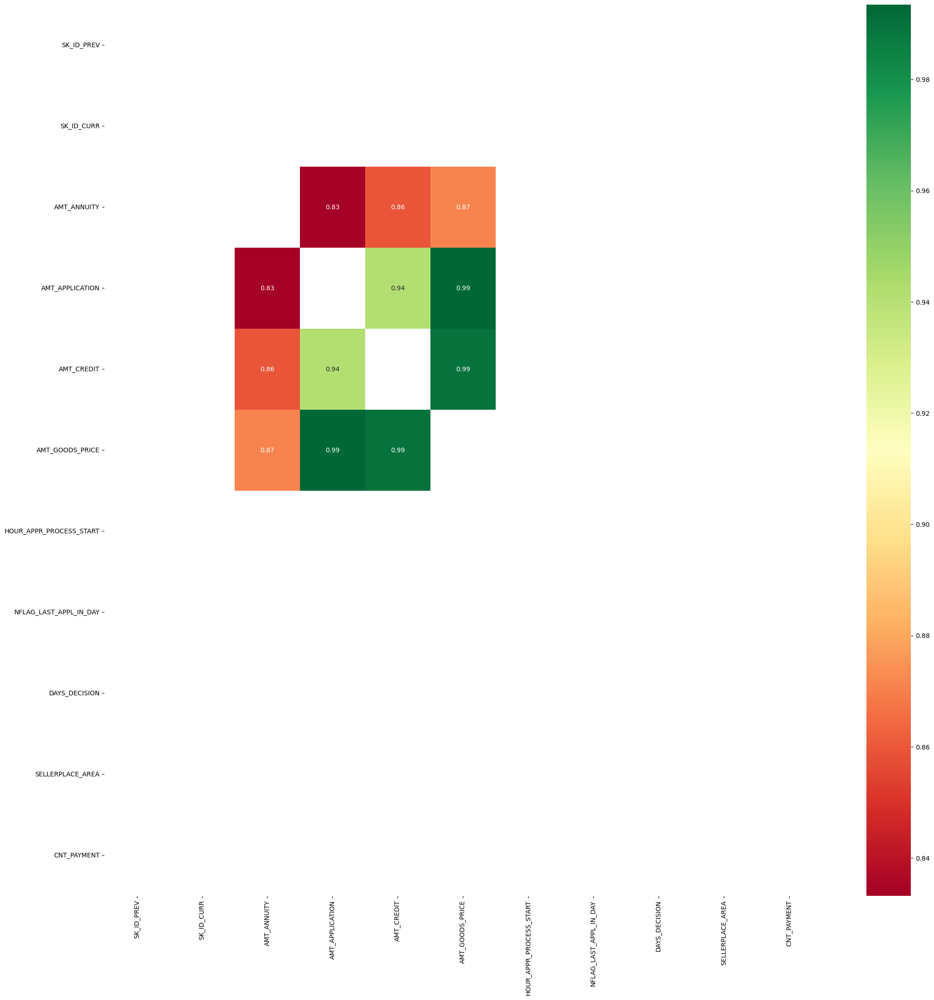

In [147]:
plt.figure(figsize=(25,25))
corr_prev=numeric_prev.corr()
sns.heatmap(data = corr_prev[(corr_prev >= 0.8) & (corr_prev < 0.9999)], annot = True, cmap = "RdYlGn", cbar = True, fmt='.2f')
plt.show()

In [148]:
corr_prev[corr_prev<= 0.99].unstack().sort_values(ascending = False).head(22)

AMT_GOODS_PRICE          AMT_CREDIT                 0.989193
AMT_CREDIT               AMT_GOODS_PRICE            0.989193
                         AMT_APPLICATION            0.941221
AMT_APPLICATION          AMT_CREDIT                 0.941221
AMT_GOODS_PRICE          AMT_ANNUITY                0.871289
AMT_ANNUITY              AMT_GOODS_PRICE            0.871289
                         AMT_CREDIT                 0.859160
AMT_CREDIT               AMT_ANNUITY                0.859160
AMT_APPLICATION          AMT_ANNUITY                0.833217
AMT_ANNUITY              AMT_APPLICATION            0.833217
CNT_PAYMENT              AMT_APPLICATION            0.695721
AMT_APPLICATION          CNT_PAYMENT                0.695721
CNT_PAYMENT              AMT_GOODS_PRICE            0.690232
AMT_GOODS_PRICE          CNT_PAYMENT                0.690232
CNT_PAYMENT              AMT_CREDIT                 0.658088
AMT_CREDIT               CNT_PAYMENT                0.658088
CNT_PAYMENT             

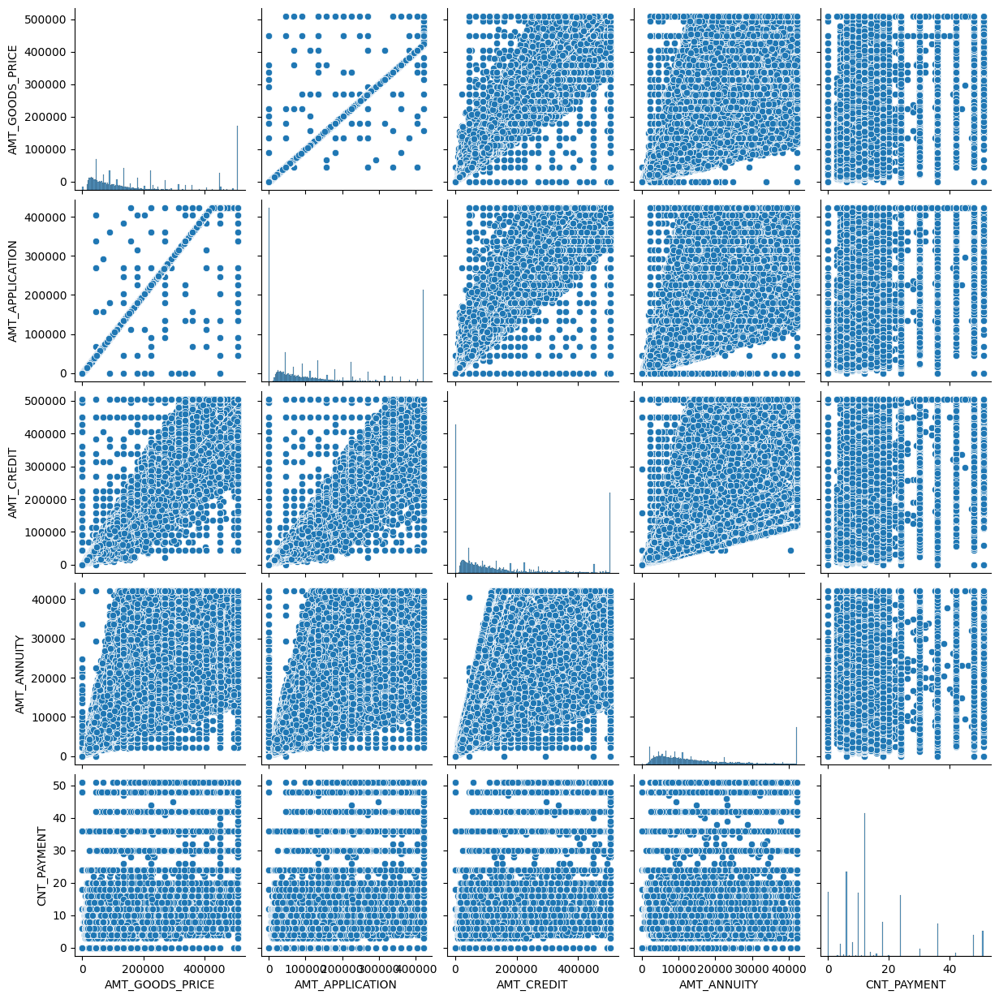

In [149]:
sns.pairplot(prev[['AMT_GOODS_PRICE','AMT_APPLICATION','AMT_CREDIT','AMT_ANNUITY','CNT_PAYMENT']])
plt.show()  

**Inference**

1. **High Correlation Among Key Financial Variables**: As expected, variables such as `AMT_GOODS_PRICE`, `AMT_ANNUITY`, and `AMT_APPLICATION` exhibit high correlation. This is logical since the higher the value of goods purchased, the greater the need for a loan, resulting in a strong correlation between these variables.

2. **High Correlation Between Credit Amount and Goods Price**: Similarly, there's a high correlation between the amount of credit (`AMT_CREDIT`) and the value of goods (`AMT_GOODS_PRICE`). This correlation is expected since the credit amount is typically related to the cost of the goods being financed.

3. **Unexpected Lack of Correlation Between Credit Count and Amount**: Surprisingly, there's no significant correlation between the count of payments (`CNT_PAYMENT`) and the amount of credit (`AMT_CREDIT`). One might expect a higher credit amount to be associated with a longer payment term, but no such correlation is observed in the data.



### <font color =navy> Combine the dataframes current_application and previous_application

In [150]:
curr_merge = curr.merge(prev, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')

In [151]:
curr_merge.shape

(1404813, 89)

In [152]:
curr.shape

(304531, 59)

In [153]:
prev.shape

(1669868, 31)

In [154]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

In [155]:
curr_merge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1404813 entries, 0 to 1404812
Data columns (total 89 columns):
 #   Column                        Non-Null Count    Dtype   
---  ------                        --------------    -----   
 0   OCCUPATION_TYPE               950118 non-null   object  
 1   EXT_SOURCE_3                  1164708 non-null  float64 
 2   AMT_REQ_CREDIT_BUREAU_HOUR    1404813 non-null  float64 
 3   AMT_REQ_CREDIT_BUREAU_DAY     1404813 non-null  float64 
 4   AMT_REQ_CREDIT_BUREAU_WEEK    1404813 non-null  float64 
 5   AMT_REQ_CREDIT_BUREAU_MON     1404813 non-null  float64 
 6   AMT_REQ_CREDIT_BUREAU_QRT     1404813 non-null  float64 
 7   AMT_REQ_CREDIT_BUREAU_YEAR    1404813 non-null  float64 
 8   NAME_TYPE_SUITE               1404813 non-null  object  
 9   OBS_30_CNT_SOCIAL_CIRCLE      1404813 non-null  float64 
 10  DEF_30_CNT_SOCIAL_CIRCLE      1404813 non-null  float64 
 11  OBS_60_CNT_SOCIAL_CIRCLE      1404813 non-null  float64 
 12  DEF_60_CNT_SOC

## <font color = red>Data Imbalance

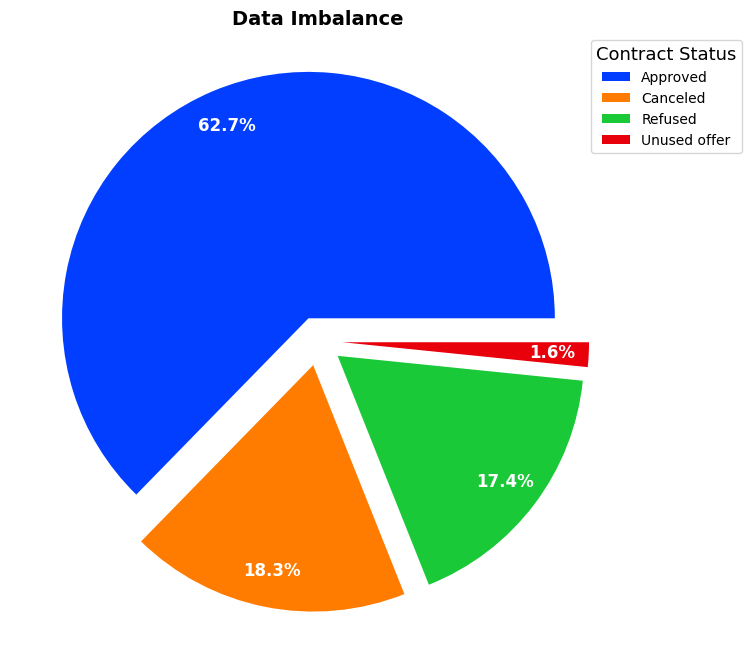

In [156]:


contract_status_counts = curr_merge['NAME_CONTRACT_STATUS'].value_counts()
explode = [0.1] * len(contract_status_counts)

plt.figure(figsize=(8, 8))

def make_autopct(pct):
    return ('%1.1f%%' % pct) if pct > 0 else ''

plt.pie(contract_status_counts, labels=contract_status_counts.index, autopct=make_autopct, 
        colors=sns.color_palette('bright', len(contract_status_counts)), explode=explode, 
        pctdistance=0.85, textprops={'color': 'white', 'weight': 'bold', 'fontsize': 12})

plt.title('Data Imbalance', fontdict={'fontsize': 14, 'weight': 'bold'})
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1), title='Contract Status', title_fontsize='13')
plt.show()


**Inference**

* The target column NAME_CONTRACT_STATUS shows that a large number of customers received loan approval compared to those who were refused.

### <font color=red> Univariate Analysis

In [157]:
def bar_func(column):
    plt.figure(figsize=(20,8))           
    per = curr_merge[column].value_counts(normalize=True) * 100
    sns.barplot(x=per.index, y=per.values, palette='bright')
    plt.xticks(rotation=90)
    plt.title(column)
    
   
    

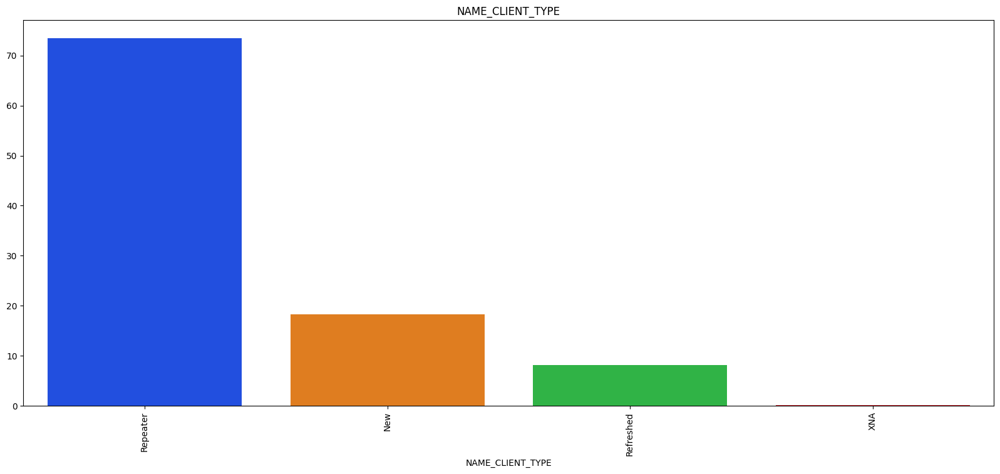

In [158]:
bar_func('NAME_CLIENT_TYPE')

* Repeater are more as compared to new customers 

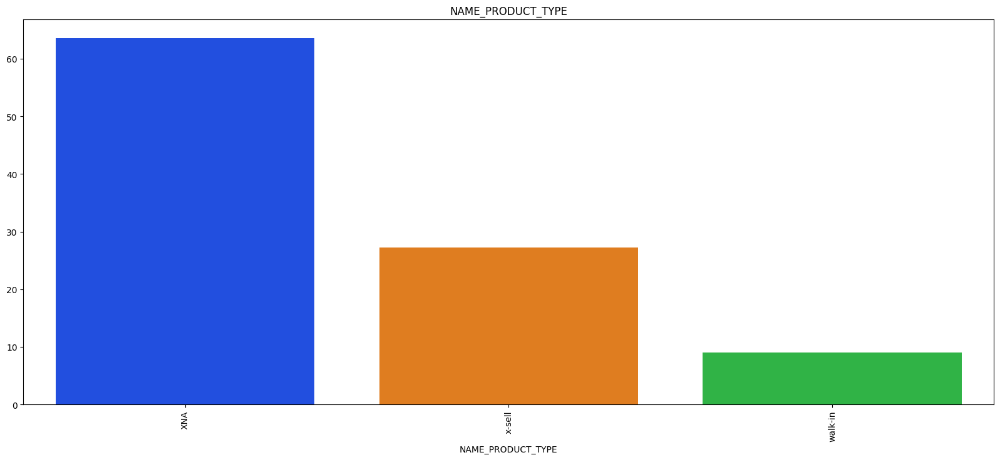

In [159]:
bar_func('NAME_PRODUCT_TYPE')

**Inference**

The NAME_PRODUCT_TYPE column, which is supposed to represent the type of loan, does not provide clear information about the product types.

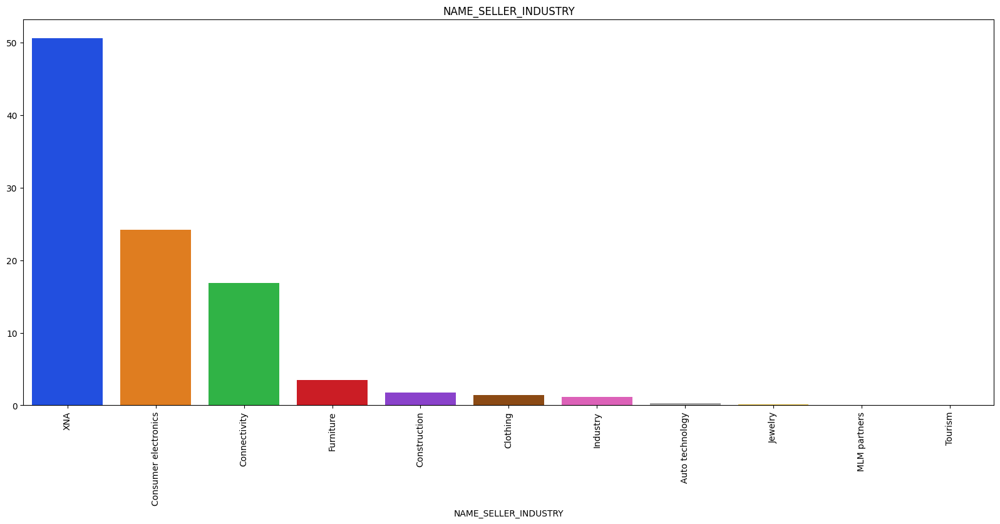

In [160]:
bar_func('NAME_SELLER_INDUSTRY')

**Inference**

* XNA is maximum as compared to others

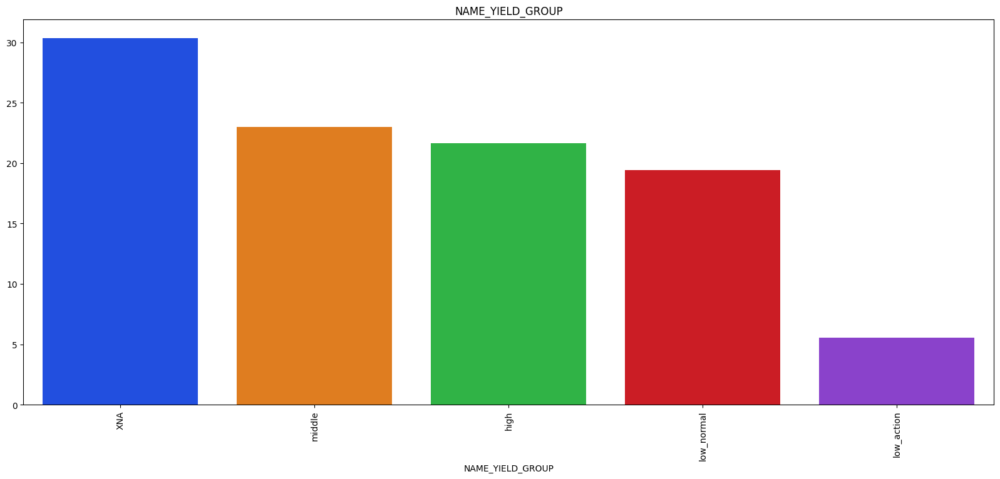

In [161]:
bar_func('NAME_YIELD_GROUP')

**Inference**
* Count of XNA is maximum followed by middle yield group

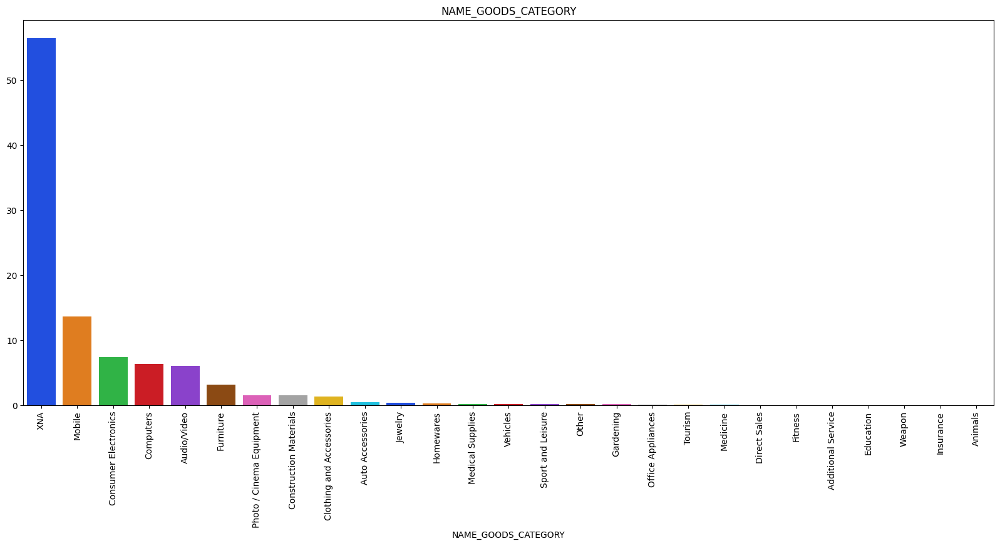

In [162]:
bar_func('NAME_GOODS_CATEGORY')

**Inference**

- XNA is maximum followed by mobile and computer

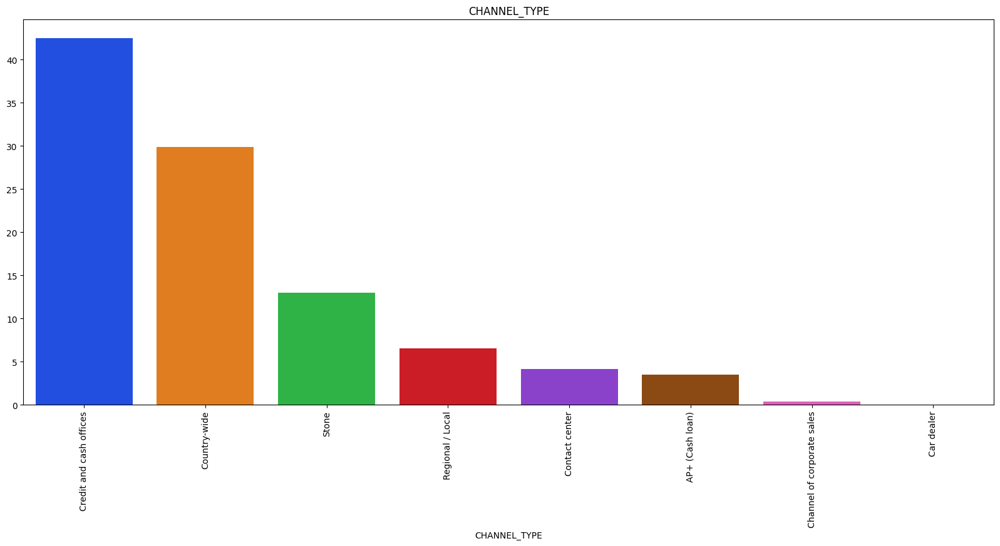

In [163]:
bar_func('CHANNEL_TYPE')

**Inference**

* Count of Credit and cash offices is maximum followed by Country-wide.

## BIVARIATE ANALYSIS OF SEGMENTED NUMERIC COLUMNS

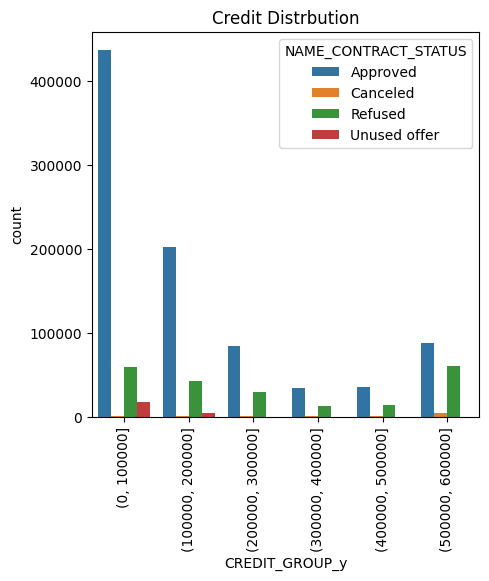

In [164]:
plt.figure(figsize =(5,5))
sns.countplot(x= "CREDIT_GROUP_y", hue = "NAME_CONTRACT_STATUS", data = curr_merge)
plt.title("Credit Distrbution")
plt.xticks(rotation=90)
plt.show()

**Inference**

credit group till 100k are having higher chance for loan approval

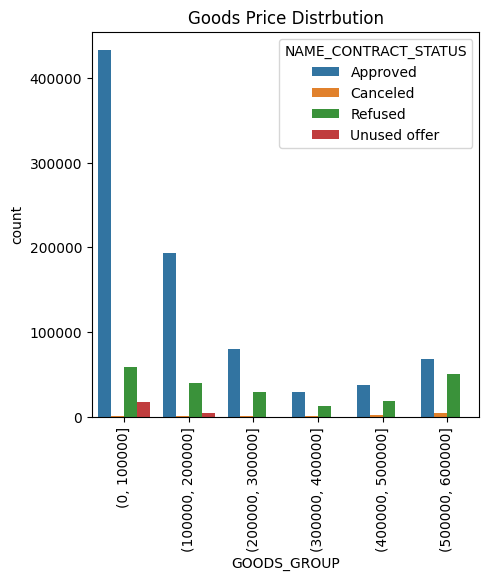

In [165]:
plt.figure(figsize =(5,5))
sns.countplot(x= "GOODS_GROUP", hue = "NAME_CONTRACT_STATUS", data = curr_merge)
plt.title("Goods Price Distrbution")
plt.xticks(rotation=90)
plt.show()

**Inference**

Goods & Price distribution till 100k have got loan approval with ease

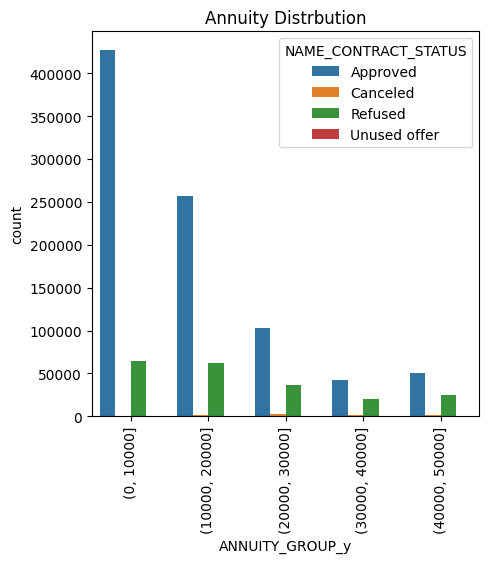

In [166]:
plt.figure(figsize =(5,5))
sns.countplot(x= "ANNUITY_GROUP_y", hue = "NAME_CONTRACT_STATUS", data = curr_merge)
plt.title("Annuity Distrbution")
plt.xticks(rotation=90)
plt.show()

**Inference**

people having annuity of 10k got many approval for loans

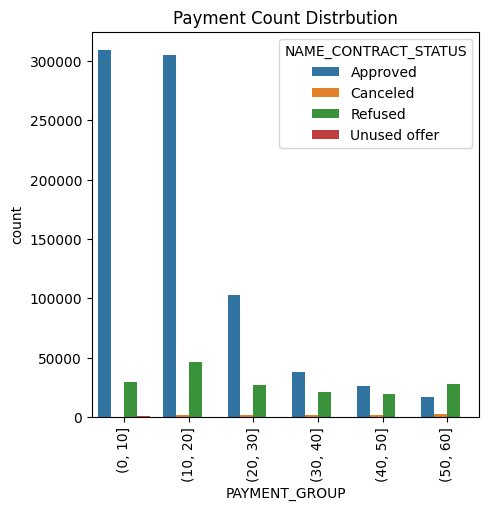

In [167]:
plt.figure(figsize =(5,5))
sns.countplot(x= "PAYMENT_GROUP", hue = "NAME_CONTRACT_STATUS", data = curr_merge)
plt.title("Payment Count Distrbution")
plt.xticks(rotation=90)
plt.show()

**Inference**

payment group between 1-10, got higher amount of approvals

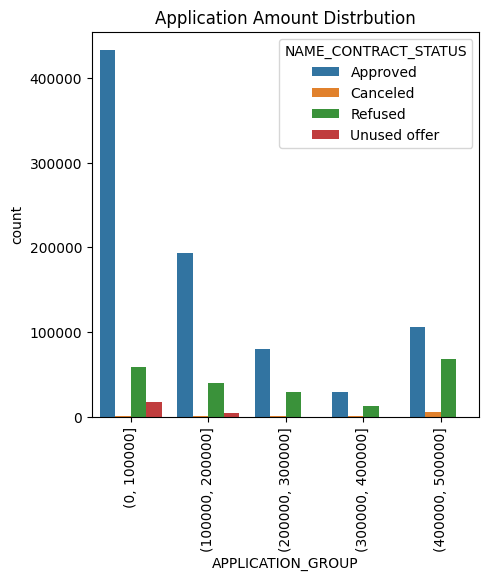

In [168]:
plt.figure(figsize =(5,5))
sns.countplot(x= "APPLICATION_GROUP", hue = "NAME_CONTRACT_STATUS", data = curr_merge)
plt.title("Application Amount Distrbution")
plt.xticks(rotation=90)
plt.show()

**Inference**

application amount distribution of 100k got loan multiple time

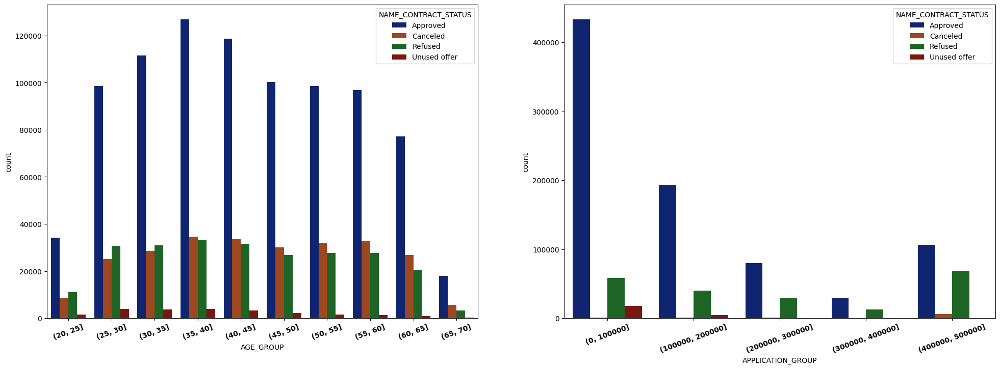

In [169]:
plt.figure(figsize=(24, 8))


plt.subplot(1, 2, 1)
plt.title("")
sns.countplot(x='AGE_GROUP', data=curr_merge, hue='NAME_CONTRACT_STATUS', palette="dark")
plt.xticks(rotation=20, fontsize=10, fontweight='bold')


plt.subplot(1, 2, 2)
plt.title("")
sns.countplot(x='APPLICATION_GROUP', data=curr_merge, hue='NAME_CONTRACT_STATUS', palette="dark")
plt.xticks(rotation=20, fontsize=10, fontweight='bold')

plt.show()

**Inference**

people lying under the age bracket of 35 & 40 years having higher frequency of loan approval

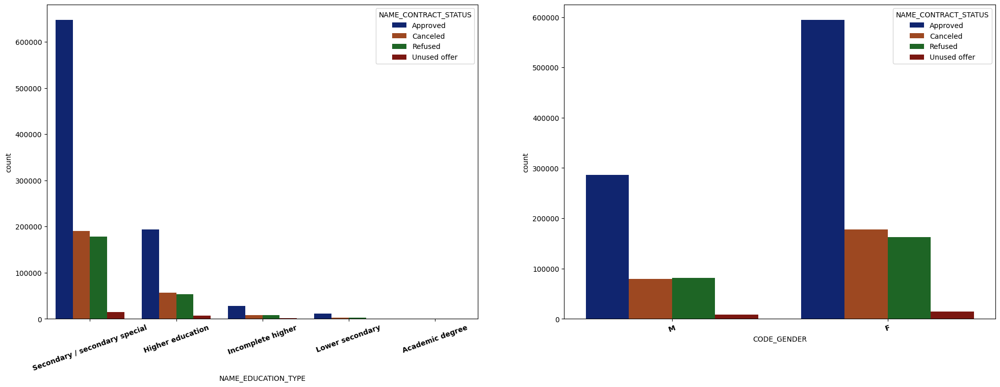

In [170]:
plt.figure(figsize=(24, 8))


plt.subplot(1, 2, 1)
plt.title("")
sns.countplot(x='NAME_EDUCATION_TYPE', data=curr_merge, hue='NAME_CONTRACT_STATUS', palette="dark")
plt.xticks(rotation=20, fontsize=10, fontweight='bold')


plt.subplot(1, 2, 2)
plt.title("")
sns.countplot(x='CODE_GENDER', data=curr_merge, hue='NAME_CONTRACT_STATUS', palette="dark")
plt.xticks(rotation=20, fontsize=10, fontweight='bold')

plt.show()

**Inference**

Secondary people are having higher approval , at the same time females get loan approval more than male

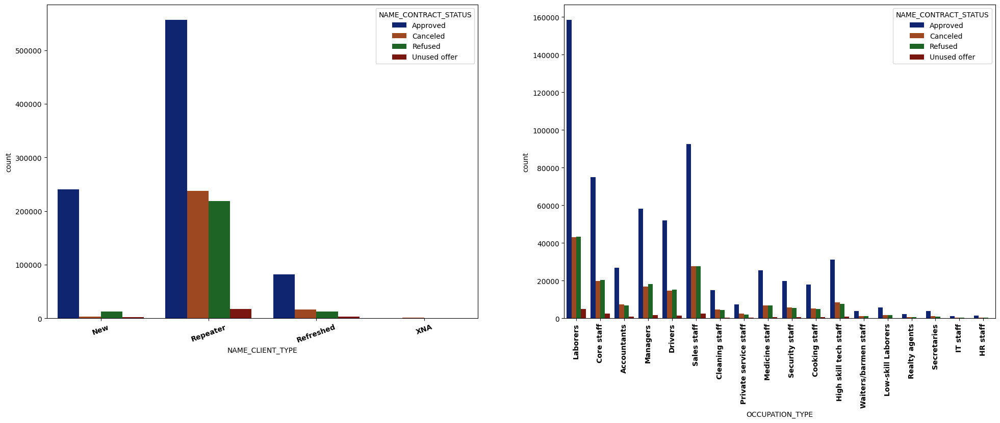

In [171]:
plt.figure(figsize=(24, 8))


plt.subplot(1, 2, 1)
plt.title("")
sns.countplot(x='NAME_CLIENT_TYPE', data=curr_merge, hue='NAME_CONTRACT_STATUS', palette="dark")
plt.xticks(rotation=20, fontsize=10, fontweight='bold')


plt.subplot(1, 2, 2)
plt.title("")
sns.countplot(x='OCCUPATION_TYPE', data=curr_merge, hue='NAME_CONTRACT_STATUS', palette="dark")
plt.xticks(rotation=90, fontsize=10, fontweight='bold')

plt.show()

**Inference**

Approval with Repeater is having high frequency compared to others.on the other hand labourers are having high chance of getting loan approvals as per previous record

**Analysing columns having highest correlation**

In [172]:
numeric_curr = curr_merge.select_dtypes(include=['number'])

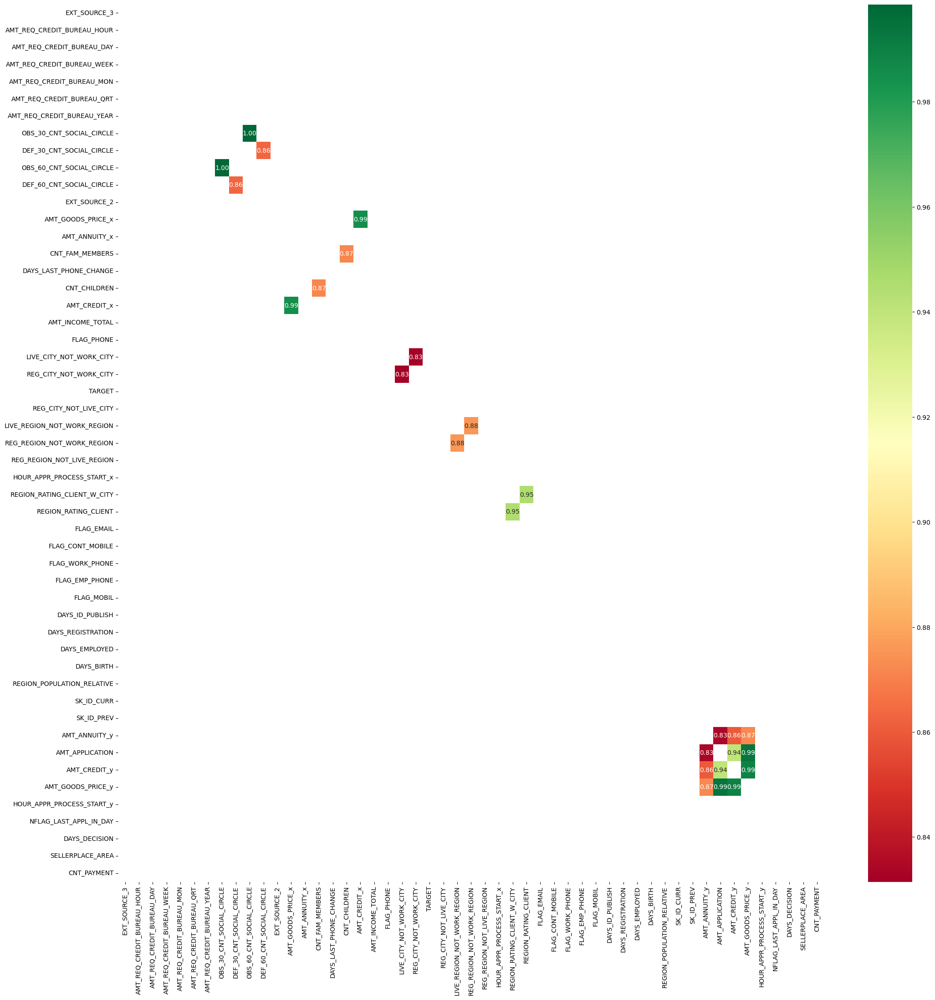

In [173]:
plt.figure(figsize=(25,25))
corr_curr=numeric_curr.corr()
sns.heatmap(data = corr_curr[(corr_curr >= 0.8) & (corr_curr < 0.9999)], annot = True, cmap = "RdYlGn", cbar = True, fmt='.2f')
plt.show()

In [174]:
corr_curr[corr_curr <= 0.99].unstack().sort_values(ascending = False).head(22)

AMT_GOODS_PRICE_y            AMT_CREDIT_y                   0.989222
AMT_CREDIT_y                 AMT_GOODS_PRICE_y              0.989222
AMT_GOODS_PRICE_x            AMT_CREDIT_x                   0.985327
AMT_CREDIT_x                 AMT_GOODS_PRICE_x              0.985327
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.945427
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.945427
AMT_CREDIT_y                 AMT_APPLICATION                0.939988
AMT_APPLICATION              AMT_CREDIT_y                   0.939988
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.875290
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.875290
AMT_GOODS_PRICE_y            AMT_ANNUITY_y                  0.872252
AMT_ANNUITY_y                AMT_GOODS_PRICE_y              0.872252
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.871905
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.871905
DEF_30_CNT_SOCIAL_CIRCLE     DEF_6

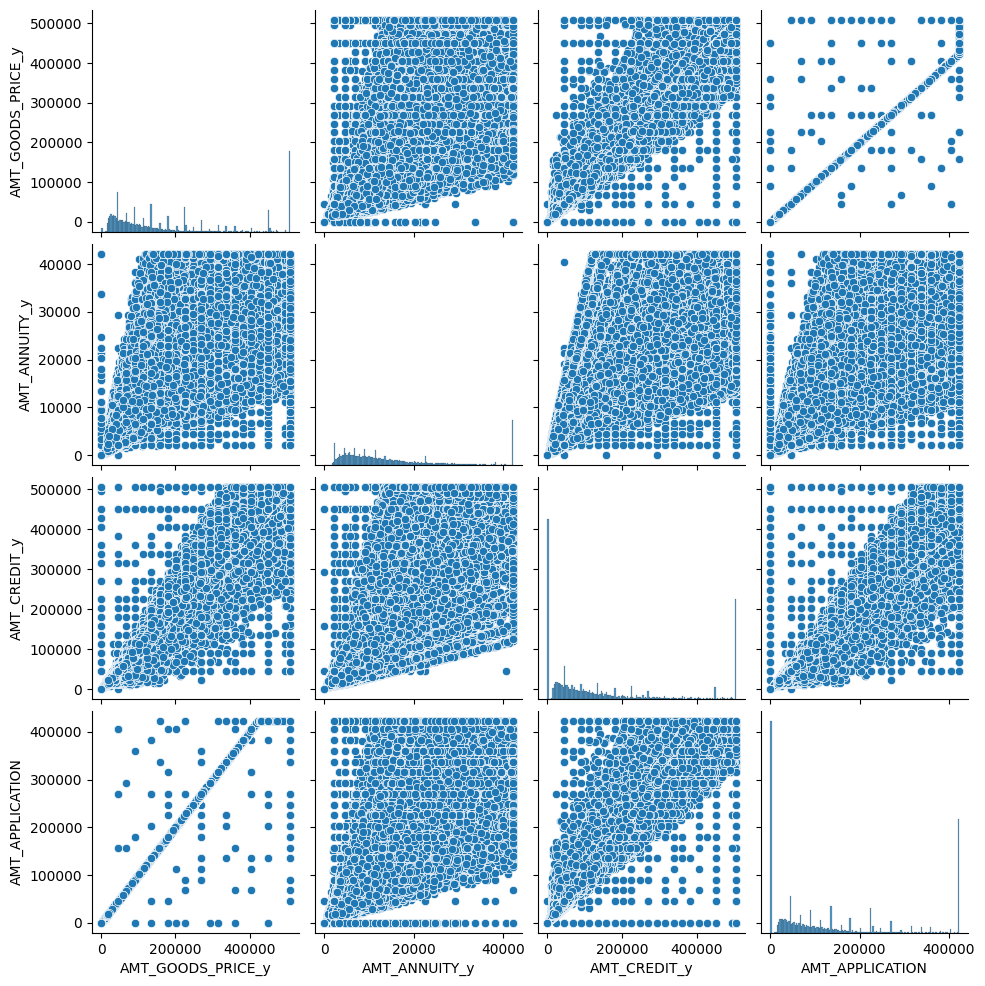

In [175]:
selected_columns = ['AMT_GOODS_PRICE_y', 'AMT_ANNUITY_y', 'AMT_CREDIT_y', 'AMT_APPLICATION']
sns.pairplot(curr_merge[selected_columns])
plt.show()

- **High Correlation Observed**:
  - **AMT_ANNUITY_y and AMT_CREDIT_y**: As the loan amount increases, the installment amount also increases.
  - **AMT_GOODS_PRICE_y and AMT_ANNUITY_y**: As the price of goods increases, the installment amount needed also increases.
  - **AMT_GOODS_PRICE_y and AMT_CREDIT_y**: As the price of goods increases, the loan amount also increases.
  - **AMT_APPLICATION and AMT_CREDIT_y**: As the loan amount requested increases, the loan amount sanctioned also increases.
  - **AMT_APPLICATION and AMT_ANNUITY_y**: As the loan amount requested increases, the installment amount needed also increases.

- **Cause and Effect**:
  - Increase in **AMT_GOODS_PRICE** leads to an increase in **AMT_ANNUITY**.
  - Increase in **AMT_GOODS_PRICE** leads to an increase in **AMT_CREDIT**.
  - Increase in **AMT_APPLICATION** leads to an increase in **AMT_CREDIT**.
  - Increase in **AMT_APPLICATION** leads to an increase in **AMT_ANNUITY**.

## <font color = green>Conclusion
    
#### <font color = red>Reliable Customers

1. **Occupations:**
   - **Accountant:** Tend to make payments on time.
   - **Retired:** Tend to make payments on time.
   - **Students:** Tend to make payments on time.

2. **Education:**
   - **Higher Education or Academic Degrees:** Customers with higher education levels or academic degrees are favorable targets for lenders.

3. **Employment:**
   - **Employed for More Than 10 Years:** Customers who have a stable employment history of more than 10 years should be considered.

4. **Age:**
   - **Over 40:** Customers aged over 40 are considered reliable borrowers.

#### <font color = red>Less Reliable Customers

1. **Occupations:**
   - **Drivers:** Often face difficulties in making payments on time.
   - **Low-Skill Laborers:** Often face difficulties in making payments on time.

2. **Employment:**
   - **Employed for Less Than 10 Years:** Customers who have been employed for less than 10 years should not be considered for loans.

3. **Age:**
   - **Under 30:** Customers under the age of 30 frequently encounter difficulties in making payments.

4. **Education:**
   - **Lower Secondary Education:** Customers with lower secondary education tend not to make payments on time.

5. **Marital Status:**
   - **Single or Not Married:** Should be avoided as they are less reliable.

#### <font color = red>Not Recommended

- **Working-Class and Unemployed Customers:** It is advisable to avoid these customers as they often face difficulties in making payments on time.